# *Merged Jupyter Notebook*

# UFC Dataset analysis

## Exploaratory data analysis

In this section we'll perform some exploratory data analysis on the dataset. We'll look at important features, their distribution and other interesting patterns in the data.

In [96]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [69]:
stats = pd.read_csv("datasets/stats.csv", sep=";")
stats.head()

,red_fighter_name,blue_fighter_name,event_date,red_fighter_nickname,blue_fighter_nickname,red_fighter_result,blue_fighter_result,method,round,time,...,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct
0,ILIA TOPURIA,MAX HOLLOWAY,26/10/2024,El Matador,Blessed,W,L,KO/TKO,3,1:34,...,14,16,20,24,94,100,0,0,5,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,26/10/2024,The Reaper,Borz,L,W,Submission,1,3:34,...,0,33,100,0,100,0,0,0,0,100
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,26/10/2024,-,Rocket,W,L,Decision - Unanimous,3,5:00,...,40,16,23,64,90,94,9,5,0,0
3,LERONE MURPHY,DAN IGE,26/10/2024,The Miracle,50K,W,L,Decision - Unanimous,3,5:00,...,23,10,7,13,71,69,23,13,5,17
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,26/10/2024,Bullet,Superman,W,L,KO/TKO,2,4:52,...,44,12,18,58,96,97,3,2,0,0


In [70]:
# distinct values in stats bonus column
stats["bonus"].head()

0    belt
1    perf
2       -
3       -
4    perf
Name: bonus, dtype: object

In [71]:
stats.columns

Index(['red_fighter_name', 'blue_fighter_name', 'event_date',
       'red_fighter_nickname', 'blue_fighter_nickname', 'red_fighter_result',
       'blue_fighter_result', 'method', 'round', 'time', 'time_format',
       'referee', 'details', 'bout_type', 'bonus', 'event_name',
       'event_location', 'red_fighter_KD', 'blue_fighter_KD',
       'red_fighter_sig_str', 'blue_fighter_sig_str',
       'red_fighter_sig_str_pct', 'blue_fighter_sig_str_pct',
       'red_fighter_total_str', 'blue_fighter_total_str', 'red_fighter_TD',
       'blue_fighter_TD', 'red_fighter_TD_pct', 'blue_fighter_TD_pct',
       'red_fighter_sub_att', 'blue_fighter_sub_att', 'red_fighter_rev',
       'blue_fighter_rev', 'red_fighter_ctrl', 'blue_fighter_ctrl',
       'red_fighter_sig_str_head', 'blue_fighter_sig_str_head',
       'red_fighter_sig_str_body', 'blue_fighter_sig_str_body',
       'red_fighter_sig_str_leg', 'blue_fighter_sig_str_leg',
       'red_fighter_sig_str_distance', 'blue_fighter_sig_str_distan

### Fight time and rounds

Firstly, we can focus on the fight time and number of rounds. 

In [72]:
# filter stats to only contain fights after 1999
stats["event_date"] = pd.to_datetime(stats["event_date"])
stats_after_1999 = stats[stats["event_date"].dt.year > 1999]

# create a fight_night dataframe from stats where the 'bout_type' contains "UFC Fight Night"
fight_night = stats_after_1999[stats_after_1999["bout_type"].str.contains("UFC Fight Night")]
# create a column "fight_lenght" 
fight_night["fight_lenght"] = fight_night["time"].apply(lambda x: int(x.split(":")[0])*60 + int(x.split(":")[1]))


# create a numbered event dataframe from stats where the 'bout_type' contains a number
numbered_event = stats_after_1999[stats_after_1999["bout_type"].str.contains("\d")]
numbered_event["fight_lenght"] = numbered_event["time"].apply(lambda x: int(x.split(":")[0])*60 + int(x.split(":")[1]))

/var/folders/8f/r3_wj0mj7j7589tsdf6vxc2w0000gn/T/ipykernel_20125/3764195426.py:2: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  stats["event_date"] = pd.to_datetime(stats["event_date"])
/var/folders/8f/r3_wj0mj7j7589tsdf6vxc2w0000gn/T/ipykernel_20125/3764195426.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numbered_event["fight_lenght"] = numbered_event["time"].apply(lambda x: int(x.split(":")[0])*60 + int(x.split(":")[1]))


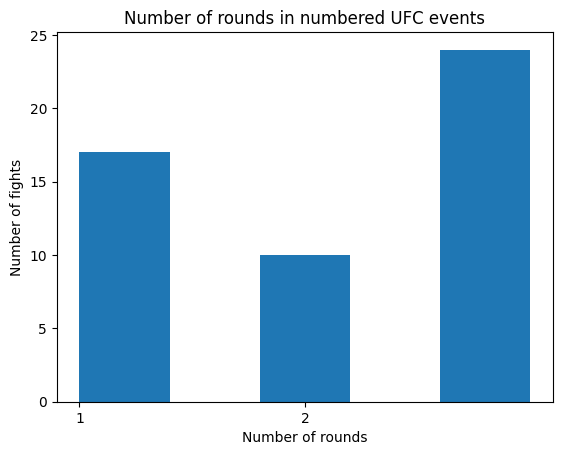

In [73]:
# make a histogram of "round" column in numbered_event
plt.hist(numbered_event["round"], bins=5)
plt.xlabel("Number of rounds")
plt.xticks(np.arange(1, 3, 1))
plt.ylabel("Number of fights")
plt.title("Number of rounds in numbered UFC events")
plt.show()

In [74]:
stats_after_1999["bout_type"].unique()

array(['UFC Featherweight Title Bout', 'Middleweight Bout',
       'Light Heavyweight Bout', 'Featherweight Bout',
       'Welterweight Bout', 'Catch Weight Bout', 'Heavyweight Bout',
       'Bantamweight Bout', 'Flyweight Bout', "Women's Bantamweight Bout",
       "Women's Strawweight Bout", 'Lightweight Bout',
       'UFC Light Heavyweight Title Bout',
       "UFC Women's Bantamweight Title Bout",
       'UFC Bantamweight Title Bout', "UFC Women's Flyweight Title Bout",
       "Women's Flyweight Bout", 'UFC Middleweight Title Bout',
       'UFC Welterweight Title Bout',
       'UFC Interim Heavyweight Title Bout', 'UFC Lightweight Title Bout',
       'UFC Flyweight Title Bout', "UFC Women's Strawweight Title Bout",
       "Women's Featherweight Bout", 'UFC Heavyweight Title Bout',
       'UFC Interim Featherweight Title Bout',
       'Road To UFC 1 Lightweight Tournament Title Bout',
       'Road To UFC 1 Featherweight Tournament Title Bout',
       'Road To UFC 1 Bantamweight Tourna

In [75]:
numbered_event["round"].value_counts()

round
3    24
1    17
2    10
Name: count, dtype: int64

/Users/lucijaaleksic/anaconda3/envs/torch/lib/python3.10/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


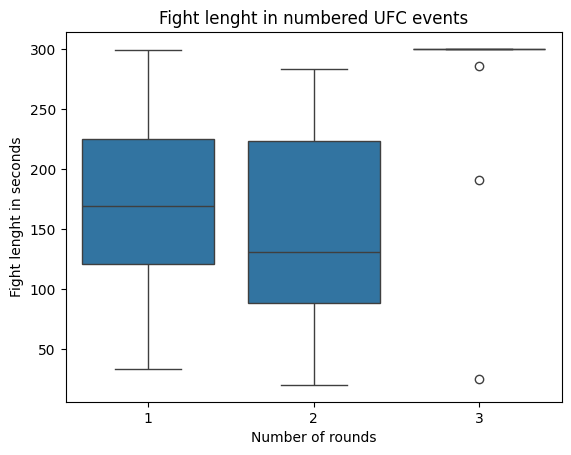

In [76]:
# show distribution of fight lenght in numbered_event by three boxplots and color the data points by round
sns.boxplot(x="round", y="fight_lenght", data=numbered_event)
plt.xlabel("Number of rounds")
plt.ylabel("Fight lenght in seconds")
plt.title("Fight lenght in numbered UFC events")
plt.show()


/Users/lucijaaleksic/anaconda3/envs/torch/lib/python3.10/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


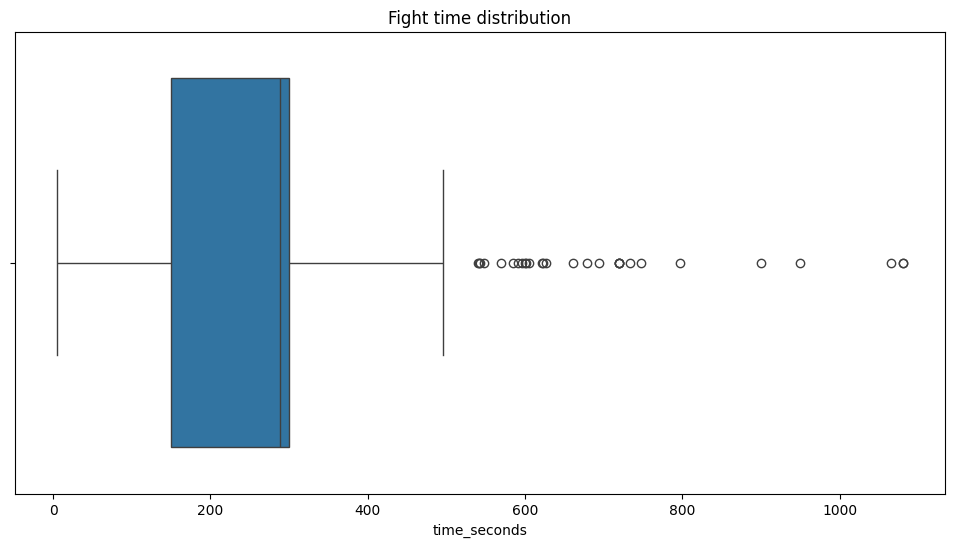

In [77]:
# add columnt time_seconds to stats - from min:sec to seconds
stats["time_seconds"] = stats["time"].apply(lambda x: int(x.split(":")[0])*60 + int(x.split(":")[1]))

plt.figure(figsize=(12, 6))
sns.boxplot(x="time_seconds", data=stats)
plt.title("Fight time distribution")
plt.show()

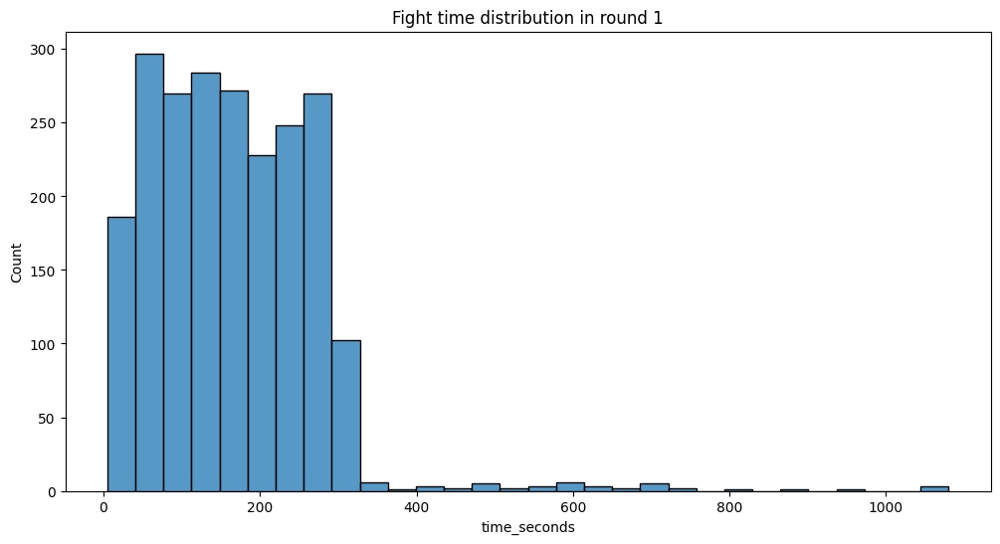

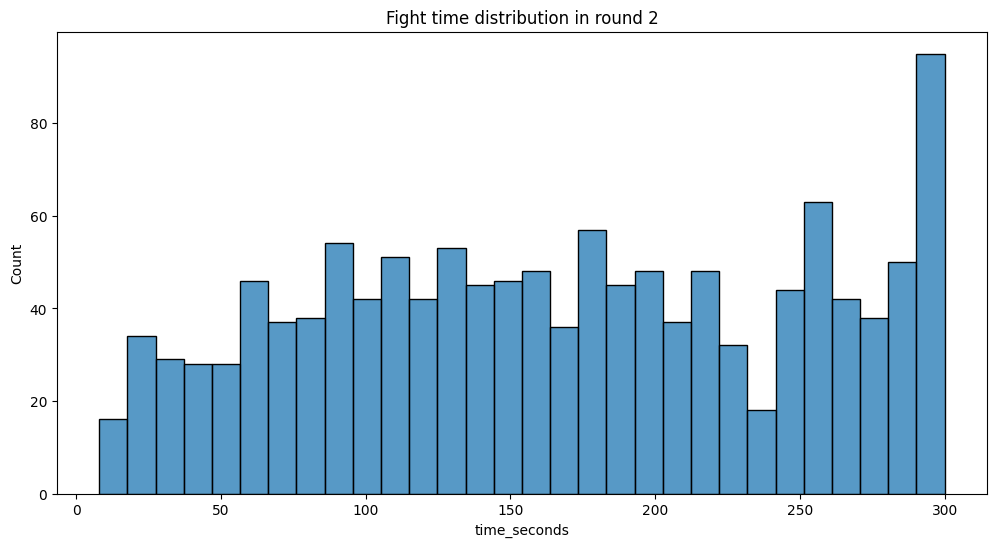

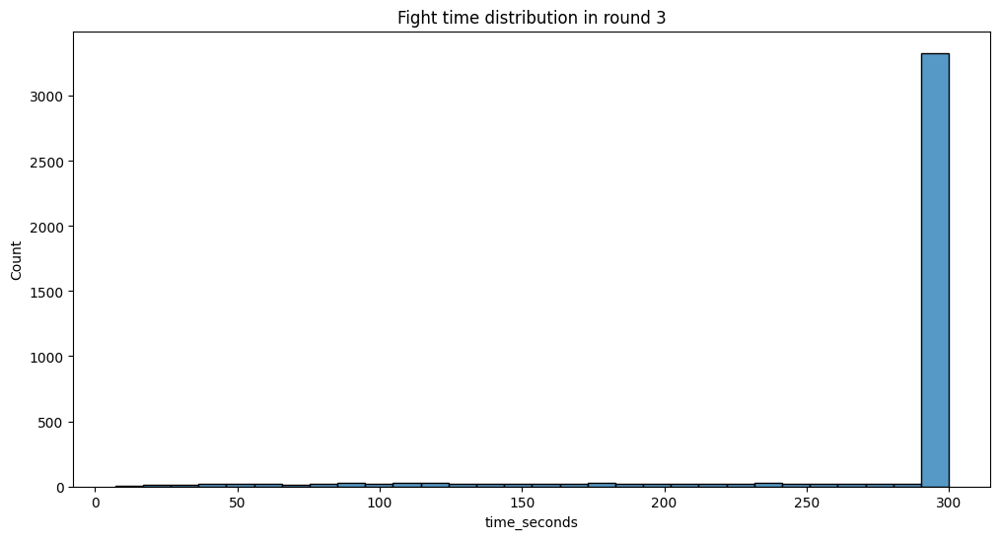

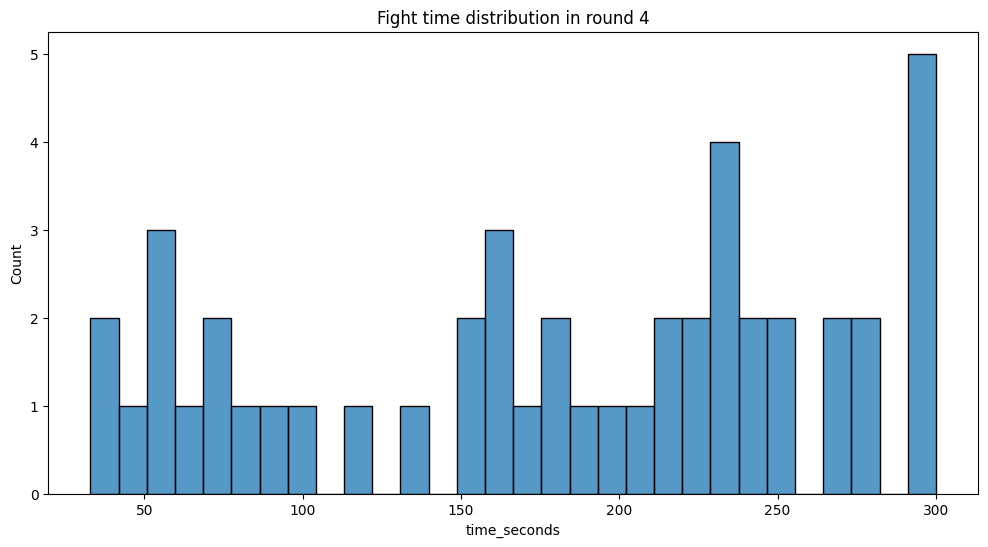

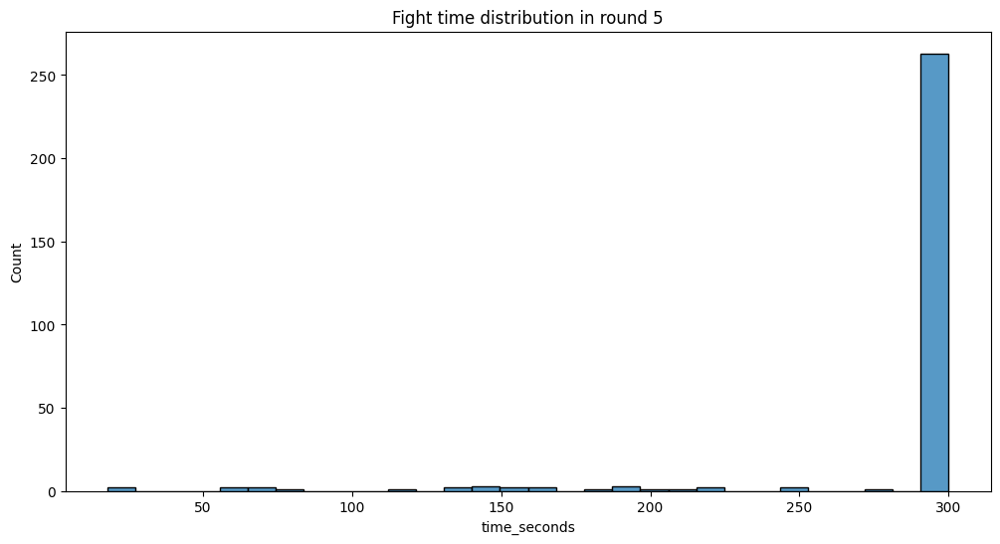

In [78]:
# plot fight time distribution per rounds 
for i in range(1, 6):
    plt.figure(figsize=(12, 6))
    sns.histplot(stats[stats["round"] == i]["time_seconds"], bins=30)
    plt.title(f"Fight time distribution in round {i}")
    plt.show()

In [95]:
# which is the longest fight?
stats[stats["time_seconds"] == stats["time_seconds"].max()]

,red_fighter_name,blue_fighter_name,event_date,red_fighter_nickname,blue_fighter_nickname,red_fighter_result,blue_fighter_result,method,round,time,...,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,time_seconds,city,country
7686,OLEG TAKTAROV,MARCO RUAS,1995-12-16,The Russian Bear,King of the Streets,W,L,Decision - Unanimous,1,18:00,...,78,100,100,0,0,0,0,1080,Denver,Colorado
7687,DAN SEVERN,DAVID ABBOTT,1995-12-16,The Beast,Tank,W,L,Decision - Unanimous,1,18:00,...,0,0,0,8,66,91,33,1080,Denver,Colorado


The longest fights are two 18 minute fights which are both from 1995 when the UFC was still in its early days and there were no rounds.

### Fight location

Here we can focus on where the fights are taking place. We'll look into cities and countries.

In [81]:
stats["event_location"].unique()

array(['Abu Dhabi, Abu Dhabi, United Arab Emirates',
       'Las Vegas, Nevada, USA', 'Salt Lake City, Utah, USA',
       'Paris, Ile-de-France, France',
       'Perth, Western Australia, Australia',
       'Manchester, England, United Kingdom', 'Denver, Colorado, USA',
       'Riyadh, Riyadh, Saudi Arabia', 'Louisville, Kentucky, USA',
       'Newark, New Jersey, USA', 'St. Louis, Missouri, USA',
       'Rio de Janeiro, Rio de Janeiro, Brazil',
       'Atlantic City, New Jersey, USA', 'Miami, Florida, USA',
       'Mexico City, Distrito Federal, Mexico',
       'Anaheim, California, USA', 'Toronto, Ontario, Canada',
       'Austin, Texas, USA', 'New York City, New York, USA',
       'Sao Paulo, Sao Paulo, Brazil',
       'Sydney, New South Wales, Australia', 'Kallang, Singapore',
       'Boston, Massachusetts, USA', 'Nashville, Tennessee, USA',
       'London, England, United Kingdom', 'Jacksonville, Florida, USA',
       'Vancouver, British Columbia, Canada',
       'Charlotte, North

In [82]:
# split location to city and country
stats["city"] = stats["event_location"].apply(lambda x: x.split(",")[0])
stats["country"] = stats["event_location"].apply(lambda x: x.split(",")[1]) # in usa it's state

In [83]:
# most common cities
stats["city"].value_counts().head(10)

city
Las Vegas         2609
Abu Dhabi          233
London             166
Rio de Janeiro     146
Newark             112
Anaheim            105
Houston            103
Sao Paulo           99
Atlantic City       91
Toronto             86
Name: count, dtype: int64

In [84]:
# most common countries
stats["country"].value_counts().head(10)

country
Nevada        2609
California     353
Texas          292
England        275
Florida        249
New Jersey     223
Abu Dhabi      216
New York       201
Ontario        111
Colorado       110
Name: count, dtype: int64

### Fighters

Now we can focus on the fighters. We can look at the number of fights they have, their win rate, and other interesting statistics.

In [85]:
# transform the stats dataset to have one row per figher 
# - red_fighter_name and blue_fighter_name = fighter
# - red_fighter_result and blue_fighter_result = result
# - red_fighter_nickname and blue_fighter_nickname = nickname
# - keep event_date

fighters = pd.DataFrame()
fighters["fighter"] = pd.concat([stats["red_fighter_name"], stats["blue_fighter_name"]])
fighters["result"] = pd.concat([stats["red_fighter_result"], stats["blue_fighter_result"]])
fighters["nickname"] = pd.concat([stats["red_fighter_nickname"], stats["blue_fighter_nickname"]])
fighters["event_date"] = stats["event_date"].reset_index(drop=True)

fighters.head()

,fighter,result,nickname,event_date
0,ILIA TOPURIA,W,El Matador,2024-10-26
1,ROBERT WHITTAKER,L,The Reaper,2024-10-26
2,MAGOMED ANKALAEV,W,-,2024-10-26
3,LERONE MURPHY,W,The Miracle,2024-10-26
4,SHARA MAGOMEDOV,W,Bullet,2024-10-26


In [86]:
# fighter with the most fights
fighters["fighter"].value_counts().head(10)

fighter
JIM MILLER          43
ANDREI ARLOVSKI     41
DONALD CERRONE      37
CLAY GUIDA          36
RAFAEL DOS ANJOS    36
JEREMY STEPHENS     33
DEMIAN MAIA         33
NEIL MAGNY          33
CHARLES OLIVEIRA    32
DIEGO SANCHEZ       32
Name: count, dtype: int64

In [87]:
# fighter with the most wins (result == "W")
fighters[fighters["result"] == "W"]["fighter"].value_counts().head(10)

fighter
JIM MILLER          26
DONALD CERRONE      23
ANDREI ARLOVSKI     23
NEIL MAGNY          22
DUSTIN POIRIER      22
CHARLES OLIVEIRA    22
MAX HOLLOWAY        22
DEMIAN MAIA         22
JON JONES           21
RAFAEL DOS ANJOS    21
Name: count, dtype: int64

In [88]:
# fighter with the most losses (result == "L")
fighters[fighters["result"] == "L"]["fighter"].value_counts().head(10)

fighter
JEREMY STEPHENS       18
ANDREI ARLOVSKI       18
CLAY GUIDA            18
JIM MILLER            17
RAFAEL DOS ANJOS      15
MICHAEL JOHNSON       15
DONALD CERRONE        14
ANGELA HILL           14
TIM MEANS             14
OVINCE SAINT PREUX    13
Name: count, dtype: int64

In [90]:
# fighter with the best win ratio
# fighters with more than 4 fights
fighters_5 = fighters["fighter"].value_counts()[fighters["fighter"].value_counts() > 5].index
fighters_5 = fighters[fighters["fighter"].isin(fighters_5)]

win_ratio = fighters_5.groupby("fighter")["result"].apply(lambda x: x[x == "W"].count() / x.count()).sort_values(ascending=False)

top_20_win_ratio = win_ratio.head(20)

for fighter, ratio in top_20_win_ratio.items():
    # count how many fights the fighter had
    fights = fighters[fighters["fighter"] == fighter]["result"].count()
    last_figth = fighters[fighters["fighter"] == fighter]["event_date"].max()
    print(f"{fighter} {ratio*100:.2f}% {fights} fights, last fight: {last_figth}")

UMAR NURMAGOMEDOV 100.00% 6 fights, last fight: 2024-08-03 00:00:00
JACK DELLA MADDALENA 100.00% 7 fights, last fight: 2024-03-09 00:00:00
NATALIA SILVA 100.00% 6 fights, last fight: 2024-09-07 00:00:00
CAIO BORRALHO 100.00% 7 fights, last fight: 2024-08-24 00:00:00
TATIANA SUAREZ 100.00% 7 fights, last fight: 2023-08-05 00:00:00
PADDY PIMBLETT 100.00% 6 fights, last fight: 2024-07-27 00:00:00
MANON FIOROT 100.00% 7 fights, last fight: 2024-03-30 00:00:00
LERONE MURPHY 100.00% 7 fights, last fight: 2024-10-26 00:00:00
KHAMZAT CHIMAEV 100.00% 8 fights, last fight: 2024-10-26 00:00:00
KHABIB NURMAGOMEDOV 100.00% 13 fights, last fight: 2020-10-24 00:00:00
MUHAMMAD MOKAEV 100.00% 7 fights, last fight: 2024-07-27 00:00:00
DRICUS DU PLESSIS 100.00% 8 fights, last fight: 2024-08-17 00:00:00
ZABIT MAGOMEDSHARIPOV 100.00% 6 fights, last fight: 2019-11-09 00:00:00
SHAVKAT RAKHMONOV 100.00% 6 fights, last fight: 2023-12-16 00:00:00
MOVSAR EVLOEV 100.00% 8 fights, last fight: 2024-01-20 00:00:00
I

# Question 1 - Fight outcome prediction

Import necessary libraries and create global variables

In [114]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV
import warnings
import os
# Ignore warnings
warnings.filterwarnings("ignore")
sns.set(style='whitegrid')


base_folder_path = "datasets/"  

#intermediate_steps_folder = 'dataset/Intermediate_datasets_Q1/'
#os.makedirs(intermediate_steps_folder, exist_ok=True) # this is in case we create 
# set up for printing whole dataframes
pd.set_option("display.max_columns", None)
#pd.set_option("display.max_rows", None)

#### Read data

First dataset

In [115]:
df_fight_stats = pd.read_csv(base_folder_path + 'merged_stats_n_scorecards.csv', sep=';')
df_fighter_stats = pd.read_csv(base_folder_path + "fighter_stats.csv")

In [116]:
df_fight_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2143 entries, 0 to 2142
Data columns (total 61 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   red_fighter_name                   2143 non-null   object
 1   blue_fighter_name                  2143 non-null   object
 2   event_date                         2143 non-null   object
 3   red_fighter_nickname               2143 non-null   object
 4   blue_fighter_nickname              2143 non-null   object
 5   red_fighter_result                 2143 non-null   object
 6   blue_fighter_result                2143 non-null   object
 7   method                             2143 non-null   object
 8   round                              2143 non-null   int64 
 9   time                               2143 non-null   object
 10  time_format                        2143 non-null   object
 11  referee                            2143 non-null   object
 12  detail

In [117]:
df_fight_stats.head(5)

,red_fighter_name,blue_fighter_name,event_date,red_fighter_nickname,blue_fighter_nickname,red_fighter_result,blue_fighter_result,method,round,time,time_format,referee,details,bout_type,bonus,event_name,event_location,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str,blue_fighter_sig_str,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_total_str,blue_fighter_total_str,red_fighter_TD,blue_fighter_TD,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head,blue_fighter_sig_str_head,red_fighter_sig_str_body,blue_fighter_sig_str_body,red_fighter_sig_str_leg,blue_fighter_sig_str_leg,red_fighter_sig_str_distance,blue_fighter_sig_str_distance,red_fighter_sig_str_clinch,blue_fighter_sig_str_clinch,red_fighter_sig_str_ground,blue_fighter_sig_str_ground,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts
0,ILIA TOPURIA,MAX HOLLOWAY,26/10/2024,El Matador,Blessed,W,L,KO/TKO,3,1:34,5 Rnd (5-5-5-5-5),Marc Goddard,Punch to Head At Distance,UFC Featherweight Title Bout,belt,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",1,0,75 of 144,79 of 204,52,38,78 of 147,84 of 209,2 of 2,0 of 0,100,---,0,0,0,0,0:45,0:00,49 of 114,47 of 151,11 of 14,13 of 30,15 of 16,19 of 23,71 of 140,79 of 204,0 of 0,0 of 0,4 of 4,0 of 0,65,59,14,16,20,24,94,100,0,0,5,0,20 20 19,18 18 19
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,26/10/2024,The Reaper,Borz,L,W,Submission,1,3:34,5 Rnd (5-5-5-5-5),Jason Herzog,Rear Naked Choke,Middleweight Bout,perf,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",0,0,2 of 2,3 of 4,100,75,2 of 2,25 of 31,0 of 0,2 of 4,---,50,0,1,0,0,0:00,3:20,0 of 0,2 of 3,0 of 0,1 of 1,2 of 2,0 of 0,2 of 2,0 of 1,0 of 0,0 of 0,0 of 0,3 of 3,0,66,0,33,100,0,100,0,0,0,0,100,- - -,- - -
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,26/10/2024,-,Rocket,W,L,Decision - Unanimous,3,5:00,3 Rnd (5-5-5),Vitor Ribeiro,Sal D'amato 28 - 29. Jacob Montalvo 28 - 29. T...,Light Heavyweight Bout,-,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",0,0,55 of 114,53 of 117,48,45,75 of 142,59 of 123,0 of 0,0 of 1,---,0,0,0,0,0,1:31,1:00,20 of 72,10 of 65,22 of 29,9 of 12,13 of 13,34 of 40,50 of 105,50 of 111,5 of 9,3 of 6,0 of 0,0 of 0,36,18,40,16,23,64,90,94,9,5,0,0,29 29 29,28 28 28
3,LERONE MURPHY,DAN IGE,26/10/2024,The Miracle,50K,W,L,Decision - Unanimous,3,5:00,3 Rnd (5-5-5),Mark Smith,Mike Bell 28 - 29. Ben Cartlidge 28 - 29. Hadi...,Featherweight Bout,-,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",0,1,52 of 100,46 of 106,52,43,78 of 133,52 of 116,3 of 5,1 of 3,60,33,0,0,0,2,2:17,4:47,36 of 77,35 of 92,12 of 17,5 of 8,4 of 6,6 of 6,37 of 80,32 of 79,12 of 16,6 of 16,3 of 4,8 of 11,69,76,23,10,7,13,71,69,23,13,5,17,29 29 29,28 28 28
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,26/10/2024,Bullet,Superman,W,L,KO/TKO,2,4:52,3 Rnd (5-5-5),Kerry Hatley,Spinning Back Fist Head,Middleweight Bout,perf,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",1,0,65 of 106,77 of 140,61,55,67 of 108,77 of 141,0 of 0,0 of 0,---,---,0,0,0,0,0:02,0:21,24 of 53,22 of 66,29 of 34,10 of 14,12 of 19,45 of 60,63 of 104,75 of 138,2 of 2,2 of 2,0 of 0,0 of 0,36,28,44,12,18,58,96,97,3,2,0,0,10 10 10,9 9 9


Second dataset

In [118]:
df_fighter_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4111 entries, 0 to 4110
Data columns (total 18 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   name                                          4111 non-null   object 
 1   nickname                                      2257 non-null   object 
 2   wins                                          4111 non-null   int64  
 3   losses                                        4111 non-null   int64  
 4   draws                                         4111 non-null   int64  
 5   height_cm                                     3813 non-null   float64
 6   weight_in_kg                                  4024 non-null   float64
 7   reach_in_cm                                   2184 non-null   float64
 8   stance                                        3288 non-null   object 
 9   date_of_birth                                 2976 non-null   o

In [119]:
df_fighter_stats.head()

,name,nickname,wins,losses,draws,height_cm,weight_in_kg,reach_in_cm,stance,date_of_birth,significant_strikes_landed_per_minute,significant_striking_accuracy,significant_strikes_absorbed_per_minute,significant_strike_defence,average_takedowns_landed_per_15_minutes,takedown_accuracy,takedown_defense,average_submissions_attempted_per_15_minutes
0,Robert Drysdale,NaN,7,0,0,190.50,92.99,NaN,Orthodox,1981-10-05,0.00,0.0,0.00,0.0,7.32,100.0,0.0,21.9
1,Daniel McWilliams,The Animal,15,37,0,185.42,83.91,NaN,NaN,NaN,3.36,77.0,0.00,0.0,0.00,0.0,100.0,21.6
2,Dan Molina,NaN,13,9,0,177.80,97.98,NaN,NaN,NaN,0.00,0.0,5.58,60.0,0.00,0.0,0.0,20.9
3,Paul Ruiz,NaN,7,4,0,167.64,61.23,NaN,NaN,NaN,1.40,33.0,1.40,75.0,0.00,0.0,100.0,20.9
4,Collin Huckbody,All In,8,2,0,190.50,83.91,193.04,Orthodox,1994-09-29,2.05,60.0,2.73,42.0,10.23,100.0,0.0,20.4


We need to merge these 2 datasets, using the fighters' names. Why? Because we would like to predict the results of the fights. Firstly, we will check if we have all red fighters and after that we will check if we have all blue fighters

In [120]:
df_fighter_stats['name'] = df_fighter_stats['name'].str.upper()
df_fight_stats['red_fighter_name'] = df_fight_stats['red_fighter_name'].str.upper()
df_fight_stats['blue_fighter_name'] = df_fight_stats['blue_fighter_name'].str.upper()


# Merge statistics for red fighters
red_fighter_stats = df_fight_stats.merge(
    df_fighter_stats.add_prefix('red_'), 
    left_on='red_fighter_name', 
    right_on='red_name', 
    how='left'
)

# Merge statistics for blue fighters
merged_fighter_stats = red_fighter_stats.merge(
    df_fighter_stats.add_prefix('blue_'), 
    left_on='blue_fighter_name', 
    right_on='blue_name', 
    how='left'
)

merged_fighter_stats = merged_fighter_stats.drop(columns=['red_name', 'blue_name'])
#merged_fighter_stats.to_csv("Complete_merge.csv")


Probably, some fighters are missing or they were not recognized. We will extract them

In [121]:
# Extract fighters with missing values from merged data
missing_values_red = merged_fighter_stats[merged_fighter_stats.filter(like='red_').isnull().any(axis=1)]
missing_values_blue = merged_fighter_stats[merged_fighter_stats.filter(like='blue_').isnull().any(axis=1)]

missing_values_blue = missing_values_blue[['blue_fighter_name']].drop_duplicates()
missing_values_red = missing_values_red[['red_fighter_name']].drop_duplicates()


In [122]:
missing_values_red

,red_fighter_name
2,MAGOMED ANKALAEV
7,MATEUSZ REBECKI
8,ABUS MAGOMEDOV
15,ROB FONT
19,MATHEUS NICOLAU
...,...
2075,CHRIS DAUKAUS
2090,CASEY KENNEY
2102,KHADIS IBRAGIMOV
2109,MIRSAD BEKTIC


In [123]:
missing_values_blue

,blue_fighter_name
2,ALEKSANDAR RAKIC
5,RAFAEL CERQUEIRA
6,RAFAEL DOS ANJOS
7,MYKTYBEK OROLBAI
13,CARLOS LEAL
...,...
2129,ZELIM IMADAEV
2134,HUNTER AZURE
2140,ZAK CUMMINGS
2141,AUSTIN SPRINGER


#### For column explanation

## EDA analysis and data preparation.

### Data transformation

Firstly, we will create target features, which will define who won the match. We will introduce new target feature, "who_wins". In case that Red fighter won, we will endoce it with "Red" in case that "Blue" fighter won, we will introduce "Blue". In our dataset, there is no Draw and it is very rare in real scenarios, but in our code we will introduce that third category "Draw"

In [124]:
def create_target_feature(row):
    if(row["blue_fighter_result"] == 'W'):
        return "Blue"
    elif(row["red_fighter_result"] == 'W'):
        return "Red"
    else:
        return "Draw"
    
# apply this function and create target column
merged_fighter_stats['who_wins'] = merged_fighter_stats.apply(create_target_feature, axis=1) 

# we need to drop existing red_fighter_result and blue_fighter_result
merged_fighter_stats = merged_fighter_stats.drop(columns=['red_fighter_result', 'blue_fighter_result'])

merged_fighter_stats.head(5)

,red_fighter_name,blue_fighter_name,event_date,red_fighter_nickname,blue_fighter_nickname,method,round,time,time_format,referee,details,bout_type,bonus,event_name,event_location,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str,blue_fighter_sig_str,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_total_str,blue_fighter_total_str,red_fighter_TD,blue_fighter_TD,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head,blue_fighter_sig_str_head,red_fighter_sig_str_body,blue_fighter_sig_str_body,red_fighter_sig_str_leg,blue_fighter_sig_str_leg,red_fighter_sig_str_distance,blue_fighter_sig_str_distance,red_fighter_sig_str_clinch,blue_fighter_sig_str_clinch,red_fighter_sig_str_ground,blue_fighter_sig_str_ground,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_nickname,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_stance,red_date_of_birth,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_nickname,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_stance,blue_date_of_birth,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins
0,ILIA TOPURIA,MAX HOLLOWAY,26/10/2024,El Matador,Blessed,KO/TKO,3,1:34,5 Rnd (5-5-5-5-5),Marc Goddard,Punch to Head At Distance,UFC Featherweight Title Bout,belt,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",1,0,75 of 144,79 of 204,52,38,78 of 147,84 of 209,2 of 2,0 of 0,100,---,0,0,0,0,0:45,0:00,49 of 114,47 of 151,11 of 14,13 of 30,15 of 16,19 of 23,71 of 140,79 of 204,0 of 0,0 of 0,4 of 4,0 of 0,65,59,14,16,20,24,94,100,0,0,5,0,20 20 19,18 18 19,El Matador,14.0,0.0,0.0,170.18,65.77,175.26,Orthodox,1997-01-21,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,Blessed,25.0,7.0,0.0,180.34,65.77,175.26,Orthodox,1991-12-04,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,26/10/2024,The Reaper,Borz,Submission,1,3:34,5 Rnd (5-5-5-5-5),Jason Herzog,Rear Naked Choke,Middleweight Bout,perf,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",0,0,2 of 2,3 of 4,100,75,2 of 2,25 of 31,0 of 0,2 of 4,---,50,0,1,0,0,0:00,3:20,0 of 0,2 of 3,0 of 0,1 of 1,2 of 2,0 of 0,2 of 2,0 of 1,0 of 0,0 of 0,0 of 0,3 of 3,0,66,0,33,100,0,100,0,0,0,0,100,- - -,- - -,The Reaper,25.0,7.0,0.0,182.88,83.91,185.42,Orthodox,1990-12-20,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,Borz,13.0,0.0,0.0,187.96,83.91,190.50,Orthodox,1994-05-01,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,26/10/2024,-,Rocket,Decision - Unanimous,3,5:00,3 Rnd (5-5-5),Vitor Ribeiro,Sal D'amato 28 - 29. Jacob Montalvo 28 - 29. T...,Light Heavyweight Bout,-,UFC 308: Topuria vs. Holloway,"Abu Dhabi, Abu Dhabi, United Arab Emirates",0,0,55 of 114,53 of 117,48,45,75 of 142,59 of 123,0 of 0,0 of 1,---,0,0,0,0,0,1:31,1:00,20 of 72,10 of 65,22 of 29,9 of 12,13 of 13,34 of 40,50 of 105,50 of 111,5 of 9,3 of 6,0 of 0,0 of 0,36,18,40,16,23,64,90,94,9,5,0,0,29 29 29,28 28 28,NaN,18.0,1.0,1.0,190.50,92.99,190.50,Orthodox,1992-06-02,3.56,52.0,2.20,58.

### Features explanation

Fighter Identification
1. red_fighter_name, blue_fighter_name: Names of the red and blue fighters.
2. red_nickname, blue_nickname: Fighter nicknames 
   
Match Metadata
1. event_date: Date of the match.
2. method: How the match ended (e.g., knockout, decision, submission).
3. round: The round in which the fight ended.
4. bout_type: Type of bout (e.g., main event, undercard).
5. bonus: Whether bonuses were awarded for performance.

Performance Metrics
1. Knockdowns (KD):
   - red_fighter_KD, blue_fighter_KD: Knockdowns delivered by each fighter.

2. Significant Strikes (Sig Str):
   - red_fighter_sig_str, blue_fighter_sig_str: Total significant strikes landed.
   - red_fighter_sig_str_pct, blue_fighter_sig_str_pct: Strike accuracy percentage.
   - Detailed strikes (head, body, leg, distance, clinch, ground).

3. Takedowns (TD):
   - red_fighter_TD, blue_fighter_TD: Total takedowns landed.
   - red_fighter_TD_pct, `blue_fighter_TD_pct: Takedown accuracy percentage.

4. Control Metrics:
   - red_fighter_ctrl, blue_fighter_ctrl: Time spent controlling the opponent.
   - red_fighter_sub_att, blue_fighter_sub_att: Submission attempts.
   - red_fighter_rev, blue_fighter_rev: Reversals.

5. Points:
   - red_fighter_total_pts, blue_fighter_total_pts: Points scored.

Physical Attributes
1. Height: red_height_cm, blue_height_cm.
2. Weight: red_weight_in_kg, blue_weight_in_kg.
3. Reach: red_reach_in_cm, blue_reach_in_cm.
4. Stance: red_stance, blue_stance (e.g., orthodox, southpaw).

Career Statistics
1. Wins/Losses/Draws:
   - red_wins, blue_wins: Career wins.
   - red_losses, blue_losses: Career losses.
   - red_draws, blue_draws: Career draws.

2. Striking Metrics:
   - red_significant_strikes_landed_per_minute, blue_significant_strikes_landed_per_minute: Strikes landed per minute.
   - red_significant_striking_accuracy, blue_significant_striking_accuracy: Accuracy.
   - red_significant_strikes_absorbed_per_minute, blue_significant_strikes_absorbed_per_minute: Strikes absorbed.

3. Defense Metrics:
   - red_significant_strike_defence, blue_significant_strike_defence: Percentage of strikes defended.
   - red_takedown_defense, blue_takedown_defense: Takedown defense percentage.

4. Takedowns and Submissions:
   - red_average_takedowns_landed_per_15_minutes, blue_average_takedowns_landed_per_15_minutes: Takedowns per 15 minutes.
   - red_average_submissions_attempted_per_15_minutes, blue_average_submissions_attempted_per_15_minutes: Submission attempts.

Outcome
1. who_wins: Target feature (Red, Blue, or Draw).


#### Remove irrelevant features

For the analysis, there are some feature that are completely irrelevant for prediction, such as nicknames of the fighters, etc... We will remove them. Complete list:
- event_date, 
- red_fighter_nickname,
- blue_fighter_nickname, 
- time_format, 
- referee, 
- details, 
- event_name,
- event_location, 
- red_nickname, 
- red_stance, 
- blue_nickname, 
- blue_stance


In [125]:
merged_fighter_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2164 entries, 0 to 2163
Data columns (total 94 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   red_fighter_name                                   2164 non-null   object 
 1   blue_fighter_name                                  2164 non-null   object 
 2   event_date                                         2164 non-null   object 
 3   red_fighter_nickname                               2164 non-null   object 
 4   blue_fighter_nickname                              2164 non-null   object 
 5   method                                             2164 non-null   object 
 6   round                                              2164 non-null   int64  
 7   time                                               2164 non-null   object 
 8   time_format                                        2164 non-null   object 
 9   referee 

In [126]:
columns_to_drop = ['event_date', 'red_fighter_nickname', 'blue_fighter_nickname', 'time_format', 'referee', 'details', 'event_name',
                   'event_location', 'red_nickname', 'red_stance', 'blue_nickname', 'blue_stance']

merged_fighter_stats = merged_fighter_stats.drop(columns=columns_to_drop)

merged_fighter_stats.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2164 entries, 0 to 2163
Data columns (total 82 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   red_fighter_name                                   2164 non-null   object 
 1   blue_fighter_name                                  2164 non-null   object 
 2   method                                             2164 non-null   object 
 3   round                                              2164 non-null   int64  
 4   time                                               2164 non-null   object 
 5   bout_type                                          2164 non-null   object 
 6   bonus                                              2164 non-null   object 
 7   red_fighter_KD                                     2164 non-null   int64  
 8   blue_fighter_KD                                    2164 non-null   int64  
 9   red_figh

In [127]:
display(merged_fighter_stats)

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str,blue_fighter_sig_str,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_total_str,blue_fighter_total_str,red_fighter_TD,blue_fighter_TD,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head,blue_fighter_sig_str_head,red_fighter_sig_str_body,blue_fighter_sig_str_body,red_fighter_sig_str_leg,blue_fighter_sig_str_leg,red_fighter_sig_str_distance,blue_fighter_sig_str_distance,red_fighter_sig_str_clinch,blue_fighter_sig_str_clinch,red_fighter_sig_str_ground,blue_fighter_sig_str_ground,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_date_of_birth,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_date_of_birth,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,1:34,UFC Featherweight Title Bout,belt,1,0,75 of 144,79 of 204,52,38,78 of 147,84 of 209,2 of 2,0 of 0,100,---,0,0,0,0,0:45,0:00,49 of 114,47 of 151,11 of 14,13 of 30,15 of 16,19 of 23,71 of 140,79 of 204,0 of 0,0 of 0,4 of 4,0 of 0,65,59,14,16,20,24,94,100,0,0,5,0,20 20 19,18 18 19,14.0,0.0,0.0,170.18,65.77,175.26,1997-01-21,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,1991-12-04,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,3:34,Middleweight Bout,perf,0,0,2 of 2,3 of 4,100,75,2 of 2,25 of 31,0 of 0,2 of 4,---,50,0,1,0,0,0:00,3:20,0 of 0,2 of 3,0 of 0,1 of 1,2 of 2,0 of 0,2 of 2,0 of 1,0 of 0,0 of 0,0 of 0,3 of 3,0,66,0,33,100,0,100,0,0,0,0,100,- - -,- - -,25.0,7.0,0.0,182.88,83.91,185.42,1990-12-20,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,1994-05-01,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,5:00,Light Heavyweight Bout,-,0,0,55 of 114,53 of 117,48,45,75 of 142,59 of 123,0 of 0,0 of 1,---,0,0,0,0,0,1:31,1:00,20 of 72,10 of 65,22 of 29,9 of 12,13 of 13,34 of 40,50 of 105,50 of 111,5 of 9,3 of 6,0 of 0,0 of 0,36,18,40,16,23,64,90,94,9,5,0,0,29 29 29,28 28 28,18.0,1.0,1.0,190.50,92.99,190.50,1992-06-02,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,1992-02-06,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,5:00,Featherweight Bout,-,0,1,52 of 100,46 of 106,52,43,78 of 133,52 of 116,3 of 5,1 of 3,60,33,0,0,0,2,2:17,4:47,36 of 77,35 of 92,12 of 17,5 of 8,4 of 6,6 of 6,37 of 80,32 of 79,12 of 16,6 of 16,3 of 4,8 of 11,69,76,23,10,7,13,71,69,23,13,5,17,29 29 29,28 28 28,13.0,0.0,1.0,175.26,65.77,185.42,1991-07-22,3.65,50.0,2.40,56.0,1.29,46.0,46.0,0.9,17.0,7.0,0.0,170.18,65.77,180.34,1991-08-06,3.76,45.0,3.53,57.0,1.07,26.0,58.0,0.3,Red
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,KO/TKO,2,4:52,Middleweight Bout,perf,1,0,65 of 106,77 of 140,61,55,67 of 108,77 of 141,0 of 0,0 of 0,---

In this dataset, there are values -, --- or - - - which represents the missing values in the dataset. We will replace with NaN, to avoid any confusion

In [128]:
merged_fighter_stats = merged_fighter_stats.replace(['-', '---', '- - -'], np.nan)

# check if there still exists values with --- and -
null_like_values = (merged_fighter_stats == '---').sum().sum() + (merged_fighter_stats == '-').sum().sum()
print(null_like_values)

0


In [129]:
merged_fighter_stats

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str,blue_fighter_sig_str,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_total_str,blue_fighter_total_str,red_fighter_TD,blue_fighter_TD,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head,blue_fighter_sig_str_head,red_fighter_sig_str_body,blue_fighter_sig_str_body,red_fighter_sig_str_leg,blue_fighter_sig_str_leg,red_fighter_sig_str_distance,blue_fighter_sig_str_distance,red_fighter_sig_str_clinch,blue_fighter_sig_str_clinch,red_fighter_sig_str_ground,blue_fighter_sig_str_ground,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_date_of_birth,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_date_of_birth,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,1:34,UFC Featherweight Title Bout,belt,1,0,75 of 144,79 of 204,52,38,78 of 147,84 of 209,2 of 2,0 of 0,100,NaN,0,0,0,0,0:45,0:00,49 of 114,47 of 151,11 of 14,13 of 30,15 of 16,19 of 23,71 of 140,79 of 204,0 of 0,0 of 0,4 of 4,0 of 0,65,59,14,16,20,24,94,100,0,0,5,0,20 20 19,18 18 19,14.0,0.0,0.0,170.18,65.77,175.26,1997-01-21,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,1991-12-04,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,3:34,Middleweight Bout,perf,0,0,2 of 2,3 of 4,100,75,2 of 2,25 of 31,0 of 0,2 of 4,NaN,50,0,1,0,0,0:00,3:20,0 of 0,2 of 3,0 of 0,1 of 1,2 of 2,0 of 0,2 of 2,0 of 1,0 of 0,0 of 0,0 of 0,3 of 3,0,66,0,33,100,0,100,0,0,0,0,100,NaN,NaN,25.0,7.0,0.0,182.88,83.91,185.42,1990-12-20,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,1994-05-01,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,5:00,Light Heavyweight Bout,NaN,0,0,55 of 114,53 of 117,48,45,75 of 142,59 of 123,0 of 0,0 of 1,NaN,0,0,0,0,0,1:31,1:00,20 of 72,10 of 65,22 of 29,9 of 12,13 of 13,34 of 40,50 of 105,50 of 111,5 of 9,3 of 6,0 of 0,0 of 0,36,18,40,16,23,64,90,94,9,5,0,0,29 29 29,28 28 28,18.0,1.0,1.0,190.50,92.99,190.50,1992-06-02,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,1992-02-06,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,5:00,Featherweight Bout,NaN,0,1,52 of 100,46 of 106,52,43,78 of 133,52 of 116,3 of 5,1 of 3,60,33,0,0,0,2,2:17,4:47,36 of 77,35 of 92,12 of 17,5 of 8,4 of 6,6 of 6,37 of 80,32 of 79,12 of 16,6 of 16,3 of 4,8 of 11,69,76,23,10,7,13,71,69,23,13,5,17,29 29 29,28 28 28,13.0,0.0,1.0,175.26,65.77,185.42,1991-07-22,3.65,50.0,2.40,56.0,1.29,46.0,46.0,0.9,17.0,7.0,0.0,170.18,65.77,180.34,1991-08-06,3.76,45.0,3.53,57.0,1.07,26.0,58.0,0.3,Red
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,KO/TKO,2,4:52,Middleweight Bout,perf,1,0,65 of 106,77 of 140,61,55,67 of 108,77 of 141,0 of 0,0 of 0,NaN

Now we will need to apply some transformations for the columns and convert them to numeric feature instead of time feature. Those columns are 'time', 'red_fighter_ctrl', 'blue_fighter_ctrl'

In [130]:
def convert_time_to_seconds(time_str):
    try:
        minutes, seconds = map(int, time_str.split(':'))
        return minutes * 60 + seconds
    except:
        return np.nan  # Handle invalid or missing values

# columns to tranfomr from date to int
time_format_transf_cols = ['time', 'red_fighter_ctrl', 'blue_fighter_ctrl']

# apply conversion
for col in time_format_transf_cols:
    merged_fighter_stats[col] = merged_fighter_stats[col].apply(convert_time_to_seconds)

merged_fighter_stats



,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str,blue_fighter_sig_str,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_total_str,blue_fighter_total_str,red_fighter_TD,blue_fighter_TD,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head,blue_fighter_sig_str_head,red_fighter_sig_str_body,blue_fighter_sig_str_body,red_fighter_sig_str_leg,blue_fighter_sig_str_leg,red_fighter_sig_str_distance,blue_fighter_sig_str_distance,red_fighter_sig_str_clinch,blue_fighter_sig_str_clinch,red_fighter_sig_str_ground,blue_fighter_sig_str_ground,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_date_of_birth,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_date_of_birth,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,75 of 144,79 of 204,52,38,78 of 147,84 of 209,2 of 2,0 of 0,100,NaN,0,0,0,0,45,0,49 of 114,47 of 151,11 of 14,13 of 30,15 of 16,19 of 23,71 of 140,79 of 204,0 of 0,0 of 0,4 of 4,0 of 0,65,59,14,16,20,24,94,100,0,0,5,0,20 20 19,18 18 19,14.0,0.0,0.0,170.18,65.77,175.26,1997-01-21,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,1991-12-04,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,2 of 2,3 of 4,100,75,2 of 2,25 of 31,0 of 0,2 of 4,NaN,50,0,1,0,0,0,200,0 of 0,2 of 3,0 of 0,1 of 1,2 of 2,0 of 0,2 of 2,0 of 1,0 of 0,0 of 0,0 of 0,3 of 3,0,66,0,33,100,0,100,0,0,0,0,100,NaN,NaN,25.0,7.0,0.0,182.88,83.91,185.42,1990-12-20,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,1994-05-01,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,NaN,0,0,55 of 114,53 of 117,48,45,75 of 142,59 of 123,0 of 0,0 of 1,NaN,0,0,0,0,0,91,60,20 of 72,10 of 65,22 of 29,9 of 12,13 of 13,34 of 40,50 of 105,50 of 111,5 of 9,3 of 6,0 of 0,0 of 0,36,18,40,16,23,64,90,94,9,5,0,0,29 29 29,28 28 28,18.0,1.0,1.0,190.50,92.99,190.50,1992-06-02,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,1992-02-06,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,NaN,0,1,52 of 100,46 of 106,52,43,78 of 133,52 of 116,3 of 5,1 of 3,60,33,0,0,0,2,137,287,36 of 77,35 of 92,12 of 17,5 of 8,4 of 6,6 of 6,37 of 80,32 of 79,12 of 16,6 of 16,3 of 4,8 of 11,69,76,23,10,7,13,71,69,23,13,5,17,29 29 29,28 28 28,13.0,0.0,1.0,175.26,65.77,185.42,1991-07-22,3.65,50.0,2.40,56.0,1.29,46.0,46.0,0.9,17.0,7.0,0.0,170.18,65.77,180.34,1991-08-06,3.76,45.0,3.53,57.0,1.07,26.0,58.0,0.3,Red
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,KO/TKO,2,292,Middleweight Bout,perf,1,0,65 of 106,77 of 140,61,55,67 of 108,77 of 141,0 of 0,0 of 0,NaN,NaN,0,0,0,0,2,21,24 

Now, we can see that some columns such as red_fighter_sig_str has value "number A of number B". We will locate those columns, exctract values and we will make them as separate columns.

In [131]:
# create function for spliting
def split_pattern(val):
    try:
        a, b = val.split(" of ")
        return int(a), int(b)
    except: 
        return np.nan, np.nan

# list columns which have pattern value "number A of number B"
columns_contians_pattern = []

for col in merged_fighter_stats.columns:
    if merged_fighter_stats[col].astype(str).str.contains(" of ", na=False).any():
        columns_contians_pattern.append(col)

# go through columns and apply spliting
for col in columns_contians_pattern:
    landed_col = f"{col}_landed"
    attempted_col = f"{col}_attempted"


    merged_fighter_stats[[landed_col, attempted_col]] = merged_fighter_stats[col].apply(
        lambda x: pd.Series(split_pattern(x))
    )

    merged_fighter_stats.drop(columns=[col], inplace=True)


merged_fighter_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2164 entries, 0 to 2163
Data columns (total 100 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   red_fighter_name                                   2164 non-null   object 
 1   blue_fighter_name                                  2164 non-null   object 
 2   method                                             2164 non-null   object 
 3   round                                              2164 non-null   int64  
 4   time                                               2164 non-null   int64  
 5   bout_type                                          2164 non-null   object 
 6   bonus                                              699 non-null    object 
 7   red_fighter_KD                                     2164 non-null   int64  
 8   blue_fighter_KD                                    2164 non-null   int64  
 9   red_fig

In [132]:
merged_fighter_stats


,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_date_of_birth,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_date_of_birth,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,red_fighter_sig_str_attempted,blue_fighter_sig_str_landed,blue_fighter_sig_str_attempted,red_fighter_total_str_landed,red_fighter_total_str_attempted,blue_fighter_total_str_landed,blue_fighter_total_str_attempted,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_head_landed,red_fighter_sig_str_head_attempted,blue_fighter_sig_str_head_landed,blue_fighter_sig_str_head_attempted,red_fighter_sig_str_body_landed,red_fighter_sig_str_body_attempted,blue_fighter_sig_str_body_landed,blue_fighter_sig_str_body_attempted,red_fighter_sig_str_leg_landed,red_fighter_sig_str_leg_attempted,blue_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_attempted,red_fighter_sig_str_distance_landed,red_fighter_sig_str_distance_attempted,blue_fighter_sig_str_distance_landed,blue_fighter_sig_str_distance_attempted,red_fighter_sig_str_clinch_landed,red_fighter_sig_str_clinch_attempted,blue_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_attempted,red_fighter_sig_str_ground_landed,red_fighter_sig_str_ground_attempted,blue_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_attempted
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52,38,100,NaN,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,20 20 19,18 18 19,14.0,0.0,0.0,170.18,65.77,175.26,1997-01-21,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,1991-12-04,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,144,79,204,78,147,84,209,2,2,0,0,49,114,47,151,11,14,13,30,15,16,19,23,71,140,79,204,0,0,0,0,4,4,0,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100,75,NaN,50,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,NaN,NaN,25.0,7.0,0.0,182.88,83.91,185.42,1990-12-20,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,1994-05-01,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,2,3,4,2,2,25,31,0,0,2,4,0,0,2,3,0,0,1,1,2,2,0,0,2,2,0,1,0,0,0,0,0,0,3,3
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,NaN,0,0,48,45,NaN,0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,29 29 29,28 28 28,18.0,1.0,1.0,190.50,92.99,190.50,1992-06-02,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,1992-02-06,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,114,53,117,75,142,59,123,0,0,0,1,20,72,10,65,22,29,9,12,13,13,34,40,50,105,50,111,5,9,3,6,0,0,0,0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Feathe

Now, we have two columns, red_fighter_total_points and blue_fighter_total_points. We will sum all points that they achieved, because it is easier to handle missing values. When there exist missing values for points, it is very hard to calculate them from overall statistics, because they can be very subjective by the refree.

In [133]:
# sum scores
def split_n_sum_points(val):
    try:
        scores = [float(i) for i in val.split(" ")]
        return sum(scores)
    except:
        return np.nan
    
columns_for_sum_points = ['red_fighter_total_pts', 'blue_fighter_total_pts']

for col in columns_for_sum_points:
    merged_fighter_stats[col] = merged_fighter_stats[col].apply(split_n_sum_points)


merged_fighter_stats

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_date_of_birth,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_date_of_birth,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,red_fighter_sig_str_attempted,blue_fighter_sig_str_landed,blue_fighter_sig_str_attempted,red_fighter_total_str_landed,red_fighter_total_str_attempted,blue_fighter_total_str_landed,blue_fighter_total_str_attempted,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_head_landed,red_fighter_sig_str_head_attempted,blue_fighter_sig_str_head_landed,blue_fighter_sig_str_head_attempted,red_fighter_sig_str_body_landed,red_fighter_sig_str_body_attempted,blue_fighter_sig_str_body_landed,blue_fighter_sig_str_body_attempted,red_fighter_sig_str_leg_landed,red_fighter_sig_str_leg_attempted,blue_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_attempted,red_fighter_sig_str_distance_landed,red_fighter_sig_str_distance_attempted,blue_fighter_sig_str_distance_landed,blue_fighter_sig_str_distance_attempted,red_fighter_sig_str_clinch_landed,red_fighter_sig_str_clinch_attempted,blue_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_attempted,red_fighter_sig_str_ground_landed,red_fighter_sig_str_ground_attempted,blue_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_attempted
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52,38,100,NaN,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,59.0,55.0,14.0,0.0,0.0,170.18,65.77,175.26,1997-01-21,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,1991-12-04,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,144,79,204,78,147,84,209,2,2,0,0,49,114,47,151,11,14,13,30,15,16,19,23,71,140,79,204,0,0,0,0,4,4,0,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100,75,NaN,50,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,NaN,NaN,25.0,7.0,0.0,182.88,83.91,185.42,1990-12-20,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,1994-05-01,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,2,3,4,2,2,25,31,0,0,2,4,0,0,2,3,0,0,1,1,2,2,0,0,2,2,0,1,0,0,0,0,0,0,3,3
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,NaN,0,0,48,45,NaN,0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,87.0,84.0,18.0,1.0,1.0,190.50,92.99,190.50,1992-06-02,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,1992-02-06,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,114,53,117,75,142,59,123,0,0,0,1,20,72,10,65,22,29,9,12,13,13,34,40,50,105,50,111,5,9,3,6,0,0,0,0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,NaN

Final data change would be tranformation the birth of the fighter. Instead, we will use age of the fighter.

In [134]:
from datetime import datetime

# Function to calculate age from date of birth
def calculate_age(dob):
    try:
        birth_date = datetime.strptime(dob, '%Y-%m-%d')  # Assuming date format is 'YYYY-MM-DD'
        today = datetime.today()
        return today.year - birth_date.year - ((today.month, today.day) < (birth_date.month, birth_date.day))
    except:
        return np.nan  # Handle invalid or missing dates

# Convert red and blue date of birth columns to age
for prefix in ['red', 'blue']:
    merged_fighter_stats[f'{prefix}_fighter_age'] = merged_fighter_stats[f'{prefix}_date_of_birth'].apply(calculate_age)

# Drop the original date of birth columns
merged_fighter_stats.drop(columns=['red_date_of_birth', 'blue_date_of_birth'], inplace=True)

merged_fighter_stats


,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,red_fighter_sig_str_attempted,blue_fighter_sig_str_landed,blue_fighter_sig_str_attempted,red_fighter_total_str_landed,red_fighter_total_str_attempted,blue_fighter_total_str_landed,blue_fighter_total_str_attempted,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_head_landed,red_fighter_sig_str_head_attempted,blue_fighter_sig_str_head_landed,blue_fighter_sig_str_head_attempted,red_fighter_sig_str_body_landed,red_fighter_sig_str_body_attempted,blue_fighter_sig_str_body_landed,blue_fighter_sig_str_body_attempted,red_fighter_sig_str_leg_landed,red_fighter_sig_str_leg_attempted,blue_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_attempted,red_fighter_sig_str_distance_landed,red_fighter_sig_str_distance_attempted,blue_fighter_sig_str_distance_landed,blue_fighter_sig_str_distance_attempted,red_fighter_sig_str_clinch_landed,red_fighter_sig_str_clinch_attempted,blue_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_attempted,red_fighter_sig_str_ground_landed,red_fighter_sig_str_ground_attempted,blue_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_attempted,red_fighter_age,blue_fighter_age
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52,38,100,NaN,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,59.0,55.0,14.0,0.0,0.0,170.18,65.77,175.26,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,144,79,204,78,147,84,209,2,2,0,0,49,114,47,151,11,14,13,30,15,16,19,23,71,140,79,204,0,0,0,0,4,4,0,0,28.0,33.0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100,75,NaN,50,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,NaN,NaN,25.0,7.0,0.0,182.88,83.91,185.42,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,2,3,4,2,2,25,31,0,0,2,4,0,0,2,3,0,0,1,1,2,2,0,0,2,2,0,1,0,0,0,0,0,0,3,3,34.0,30.0
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,NaN,0,0,48,45,NaN,0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,87.0,84.0,18.0,1.0,1.0,190.50,92.99,190.50,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,114,53,117,75,142,59,123,0,0,0,1,20,72,10,65,22,29,9,12,13,13,34,40,50,105,50,111,5,9,3,6,0,0,0,0,32.0,32.0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,NaN,0,1,52,43,60,33,0,0,0,2,137,287,69,76,2

In [135]:
merged_fighter_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2164 entries, 0 to 2163
Data columns (total 100 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   red_fighter_name                                   2164 non-null   object 
 1   blue_fighter_name                                  2164 non-null   object 
 2   method                                             2164 non-null   object 
 3   round                                              2164 non-null   int64  
 4   time                                               2164 non-null   int64  
 5   bout_type                                          2164 non-null   object 
 6   bonus                                              699 non-null    object 
 7   red_fighter_KD                                     2164 non-null   int64  
 8   blue_fighter_KD                                    2164 non-null   int64  
 9   red_fig

However, there are still 4 properties which are object but not numerical, which is indeed their datatype. They are 'red_fighter_sig_str_pct', 'blue_fighter_sig_str_pct', 'red_fighter_TD_pct', 'blue_fighter_TD_pct'. We will convert them to numerical values

In [136]:
columns_to_cast = ['red_fighter_sig_str_pct', 'blue_fighter_sig_str_pct', 'red_fighter_TD_pct', 'blue_fighter_TD_pct']
for column in columns_to_cast:
    merged_fighter_stats[column] = pd.to_numeric(merged_fighter_stats[column], errors='coerce')


merged_fighter_stats.info()
merged_fighter_stats

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2164 entries, 0 to 2163
Data columns (total 100 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   red_fighter_name                                   2164 non-null   object 
 1   blue_fighter_name                                  2164 non-null   object 
 2   method                                             2164 non-null   object 
 3   round                                              2164 non-null   int64  
 4   time                                               2164 non-null   int64  
 5   bout_type                                          2164 non-null   object 
 6   bonus                                              699 non-null    object 
 7   red_fighter_KD                                     2164 non-null   int64  
 8   blue_fighter_KD                                    2164 non-null   int64  
 9   red_fig

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_fighter_total_pts,blue_fighter_total_pts,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,red_fighter_sig_str_attempted,blue_fighter_sig_str_landed,blue_fighter_sig_str_attempted,red_fighter_total_str_landed,red_fighter_total_str_attempted,blue_fighter_total_str_landed,blue_fighter_total_str_attempted,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_head_landed,red_fighter_sig_str_head_attempted,blue_fighter_sig_str_head_landed,blue_fighter_sig_str_head_attempted,red_fighter_sig_str_body_landed,red_fighter_sig_str_body_attempted,blue_fighter_sig_str_body_landed,blue_fighter_sig_str_body_attempted,red_fighter_sig_str_leg_landed,red_fighter_sig_str_leg_attempted,blue_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_attempted,red_fighter_sig_str_distance_landed,red_fighter_sig_str_distance_attempted,blue_fighter_sig_str_distance_landed,blue_fighter_sig_str_distance_attempted,red_fighter_sig_str_clinch_landed,red_fighter_sig_str_clinch_attempted,blue_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_attempted,red_fighter_sig_str_ground_landed,red_fighter_sig_str_ground_attempted,blue_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_attempted,red_fighter_age,blue_fighter_age
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52.0,38.0,100.0,NaN,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,59.0,55.0,14.0,0.0,0.0,170.18,65.77,175.26,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,144,79,204,78,147,84,209,2,2,0,0,49,114,47,151,11,14,13,30,15,16,19,23,71,140,79,204,0,0,0,0,4,4,0,0,28.0,33.0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100.0,75.0,NaN,50.0,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,NaN,NaN,25.0,7.0,0.0,182.88,83.91,185.42,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,2,3,4,2,2,25,31,0,0,2,4,0,0,2,3,0,0,1,1,2,2,0,0,2,2,0,1,0,0,0,0,0,0,3,3,34.0,30.0
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,NaN,0,0,48.0,45.0,NaN,0.0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,87.0,84.0,18.0,1.0,1.0,190.50,92.99,190.50,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,114,53,117,75,142,59,123,0,0,0,1,20,72,10,65,22,29,9,12,13,13,34,40,50,105,50,111,5,9,3,6,0,0,0,0,32.0,32.0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,NaN,0,1,52.0,43.0,60.0,33

In [137]:
# code used for saving intermediate steps to csv files.
#merged_fighter_stats.to_csv(intermediate_steps_folder + "DS_after_transformations.csv", index=False)

### Handling Missing values

Now, we will handle missing values, but before that, we will spearate categorical and numerical features

In [138]:
numerical_features = merged_fighter_stats.select_dtypes(include=['float64', 'int64']).columns
categorical_features = merged_fighter_stats.select_dtypes(include=['object']).columns


display(numerical_features)
display(categorical_features)


Index(['round', 'time', 'red_fighter_KD', 'blue_fighter_KD',
       'red_fighter_sig_str_pct', 'blue_fighter_sig_str_pct',
       'red_fighter_TD_pct', 'blue_fighter_TD_pct', 'red_fighter_sub_att',
       'blue_fighter_sub_att', 'red_fighter_rev', 'blue_fighter_rev',
       'red_fighter_ctrl', 'blue_fighter_ctrl', 'red_fighter_sig_str_head_pct',
       'blue_fighter_sig_str_head_pct', 'red_fighter_sig_str_body_pct',
       'blue_fighter_sig_str_body_pct', 'red_fighter_sig_str_leg_pct',
       'blue_fighter_sig_str_leg_pct', 'red_fighter_sig_str_distance_pct',
       'blue_fighter_sig_str_distance_pct', 'red_fighter_sig_str_clinch_pct',
       'blue_fighter_sig_str_clinch_pct', 'red_fighter_sig_str_ground_pct',
       'blue_fighter_sig_str_ground_pct', 'red_fighter_total_pts',
       'blue_fighter_total_pts', 'red_wins', 'red_losses', 'red_draws',
       'red_height_cm', 'red_weight_in_kg', 'red_reach_in_cm',
       'red_significant_strikes_landed_per_minute',
       'red_significant_st

Index(['red_fighter_name', 'blue_fighter_name', 'method', 'bout_type', 'bonus',
       'who_wins'],
      dtype='object')

Now, we will first impute values of numerical columns.

We need to check percentage of missing values in the columns

In [139]:
def calculate_missing_val_pct(df, features):
    missing_percentage = df[features].isnull().mean() * 100

    # Filter numerical features with missing values
    missing_percentage = missing_percentage[missing_percentage > 0]

    # Sort by highest percentage
    missing_percentage = missing_percentage.sort_values(ascending=False)

    return missing_percentage

print("Percentage of Missing Values for Numerical Features:")
print(calculate_missing_val_pct(merged_fighter_stats, numerical_features))


Percentage of Missing Values for Numerical Features:
blue_fighter_TD_pct                                  37.892791
red_fighter_TD_pct                                   33.502773
blue_fighter_total_pts                               23.706100
red_fighter_total_pts                                23.613678
blue_reach_in_cm                                      2.634011
blue_fighter_age                                      2.495379
blue_height_cm                                        2.402957
blue_weight_in_kg                                     2.310536
blue_takedown_accuracy                                2.218115
blue_takedown_defense                                 2.218115
red_reach_in_cm                                       2.218115
red_height_cm                                         2.218115
blue_wins                                             2.218115
blue_significant_strikes_landed_per_minute            2.218115
blue_losses                                           2.218115
bl

For those columns: 'red_fighter_sig_str_pct', 'blue_fighter_sig_str_pct', 'red_fighter_TD_pct', 'blue_fighter_TD_pct', we will calculate value using attempted and landed strikes

In [140]:
columns_to_calculate = {
    'red_fighter_sig_str_pct': ('red_fighter_sig_str_landed', 'red_fighter_sig_str_attempted'),
    'blue_fighter_sig_str_pct': ('blue_fighter_sig_str_landed', 'blue_fighter_sig_str_attempted'),
    'red_fighter_TD_pct': ('red_fighter_TD_landed', 'red_fighter_TD_attempted'),
    'blue_fighter_TD_pct': ('blue_fighter_TD_landed', 'blue_fighter_TD_attempted')
}

# Impute missing values based on calculation for remaining rows
for col, (landed_col, attempted_col) in columns_to_calculate.items():
    if landed_col in merged_fighter_stats.columns and attempted_col in merged_fighter_stats.columns:
        # For rows where attempted is 0 or NaN, set percentage to 0 because no attempts then there are no success rate
        merged_fighter_stats.loc[
            (merged_fighter_stats[col].isnull()) & (merged_fighter_stats[attempted_col] == 0),
            col
        ] = 0
        # Calculate for remaining missing values where attempted is valid
        merged_fighter_stats[col] = merged_fighter_stats[col].fillna(
            (merged_fighter_stats[landed_col] / merged_fighter_stats[attempted_col]) * 100
        )

# Check if any missing values remain
merged_fighter_stats[columns_to_calculate.keys()].isnull().sum()

red_fighter_sig_str_pct     0
blue_fighter_sig_str_pct    0
red_fighter_TD_pct          0
blue_fighter_TD_pct         0
dtype: int64

Regarding the columns red_fighter_total_pts and blue_fighter_total_pts, it is logical to remove those columns in order to improve model generalization and avoid data leakage.


In [141]:
merged_fighter_stats.drop(columns=['blue_fighter_total_pts', 'red_fighter_total_pts'], inplace=True)

#extract new numerical features
numerical_features = merged_fighter_stats.select_dtypes(include=['float64', 'int64']).columns 

In [142]:
print(calculate_missing_val_pct(merged_fighter_stats, numerical_features))

blue_reach_in_cm                                     2.634011
blue_fighter_age                                     2.495379
blue_height_cm                                       2.402957
blue_weight_in_kg                                    2.310536
red_reach_in_cm                                      2.218115
red_height_cm                                        2.218115
blue_wins                                            2.218115
blue_significant_strikes_landed_per_minute           2.218115
blue_losses                                          2.218115
blue_draws                                           2.218115
blue_significant_strike_defence                      2.218115
blue_average_takedowns_landed_per_15_minutes         2.218115
blue_significant_strikes_absorbed_per_minute         2.218115
blue_significant_striking_accuracy                   2.218115
blue_takedown_accuracy                               2.218115
blue_takedown_defense                                2.218115
blue_ave

Regarding others features, we will inpute them in next way

Imputation strategy -> Mean <br/>
        Fighter attributes (Age, Height, Weight, Reach). They are physical attributes and it is reasonable to use mean or median for inputing and also when missing percentage is low. <br/>

Imputation strategy -> Fill with 0 <br/>
    Fighter Performance Metrics (Strikes, Defence, Accuracy, Takedowns, Submissions) -> if there is a missing values, usually that indicates that no action occured <br/>
    Records (Wins, Losses, Draws) ->  if there is a missing values, usually that indicates that no information exists <br/>

Additionally, we will introduce the 2 columns, blue_fighter_stats_missing and red_fighter_stats_missing. Reason behind it is to give model more information that those missing values are because fighter in dataset 1 did not exist in dataset 2, so we need to add additional info to indicate that scenario. If stats missing, we put 1, otherwise 0.


In [143]:
# define columns for inputation
attributes = [
    'blue_fighter_age', 'blue_height_cm', 'blue_weight_in_kg', 'blue_reach_in_cm',
    'red_fighter_age', 'red_height_cm', 'red_weight_in_kg', 'red_reach_in_cm'
]
performance_metrics = [
    'blue_significant_strikes_landed_per_minute', 'blue_significant_strike_defence',
    'blue_average_takedowns_landed_per_15_minutes', 'blue_significant_strikes_absorbed_per_minute',
    'blue_significant_striking_accuracy', 'blue_takedown_accuracy', 'blue_takedown_defense',
    'blue_average_submissions_attempted_per_15_minutes', 'red_significant_strikes_landed_per_minute',
    'red_significant_strike_defence', 'red_average_takedowns_landed_per_15_minutes',
    'red_significant_strikes_absorbed_per_minute', 'red_significant_striking_accuracy',
    'red_takedown_accuracy', 'red_takedown_defense', 'red_average_submissions_attempted_per_15_minutes'
]
record_features = [
    'blue_wins', 'blue_losses', 'blue_draws', 'red_wins', 'red_losses', 'red_draws'
]


# create new columns to explain why we have missing values
merged_fighter_stats['blue_fighter_stats_missing'] = merged_fighter_stats[['blue_wins']].isnull().astype(int) # only 1 column is enought for detection
merged_fighter_stats['red_fighter_stats_missing'] = merged_fighter_stats[['red_wins']].isnull().astype(int) 


# for performance and record metrics, input 0
for col in performance_metrics + record_features:
    merged_fighter_stats[col] = merged_fighter_stats[col].fillna(0)

# for attributes fill with mean
for col in attributes:
    merged_fighter_stats[col] = merged_fighter_stats[col].fillna(merged_fighter_stats[col].mean())

print(calculate_missing_val_pct(merged_fighter_stats, numerical_features))
merged_fighter_stats

Series([], dtype: float64)


,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,red_fighter_sig_str_attempted,blue_fighter_sig_str_landed,blue_fighter_sig_str_attempted,red_fighter_total_str_landed,red_fighter_total_str_attempted,blue_fighter_total_str_landed,blue_fighter_total_str_attempted,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_head_landed,red_fighter_sig_str_head_attempted,blue_fighter_sig_str_head_landed,blue_fighter_sig_str_head_attempted,red_fighter_sig_str_body_landed,red_fighter_sig_str_body_attempted,blue_fighter_sig_str_body_landed,blue_fighter_sig_str_body_attempted,red_fighter_sig_str_leg_landed,red_fighter_sig_str_leg_attempted,blue_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_attempted,red_fighter_sig_str_distance_landed,red_fighter_sig_str_distance_attempted,blue_fighter_sig_str_distance_landed,blue_fighter_sig_str_distance_attempted,red_fighter_sig_str_clinch_landed,red_fighter_sig_str_clinch_attempted,blue_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_attempted,red_fighter_sig_str_ground_landed,red_fighter_sig_str_ground_attempted,blue_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_attempted,red_fighter_age,blue_fighter_age,blue_fighter_stats_missing,red_fighter_stats_missing
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52.0,38.0,100.0,0.0,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,14.0,0.0,0.0,170.18,65.77,175.26,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,144,79,204,78,147,84,209,2,2,0,0,49,114,47,151,11,14,13,30,15,16,19,23,71,140,79,204,0,0,0,0,4,4,0,0,28.0,33.0,0,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100.0,75.0,0.0,50.0,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,25.0,7.0,0.0,182.88,83.91,185.42,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,2,3,4,2,2,25,31,0,0,2,4,0,0,2,3,0,0,1,1,2,2,0,0,2,2,0,1,0,0,0,0,0,0,3,3,34.0,30.0,0,0
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,NaN,0,0,48.0,45.0,0.0,0.0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,18.0,1.0,1.0,190.50,92.99,190.50,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,114,53,117,75,142,59,123,0,0,0,1,20,72,10,65,22,29,9,12,13,13,34,40,50,105,50,111,5,9,3,6,0,0,0,0,32.0,32.0,0,0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,NaN,0,1,52.0,43.0,60.0,33.0,0,0,0

Now we will focus on categorical features

In [144]:
print(calculate_missing_val_pct(merged_fighter_stats, categorical_features))

bonus    67.698706
dtype: float64


Because we have missing values for 'bonus', it is most likely that it did not occure. We will inpute it with 'No bonus' value

In [145]:
merged_fighter_stats['bonus'] = merged_fighter_stats['bonus'].fillna('No bonus')

print(calculate_missing_val_pct(merged_fighter_stats, categorical_features))

Series([], dtype: float64)


In [146]:
# print dataset and save this in intermediate csv
#merged_fighter_stats.to_csv(intermediate_steps_folder + "Ds_after_imputation_missing_val.csv", index=False)
merged_fighter_stats

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_reach_in_cm,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_weight_in_kg,blue_reach_in_cm,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,red_fighter_sig_str_attempted,blue_fighter_sig_str_landed,blue_fighter_sig_str_attempted,red_fighter_total_str_landed,red_fighter_total_str_attempted,blue_fighter_total_str_landed,blue_fighter_total_str_attempted,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_head_landed,red_fighter_sig_str_head_attempted,blue_fighter_sig_str_head_landed,blue_fighter_sig_str_head_attempted,red_fighter_sig_str_body_landed,red_fighter_sig_str_body_attempted,blue_fighter_sig_str_body_landed,blue_fighter_sig_str_body_attempted,red_fighter_sig_str_leg_landed,red_fighter_sig_str_leg_attempted,blue_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_attempted,red_fighter_sig_str_distance_landed,red_fighter_sig_str_distance_attempted,blue_fighter_sig_str_distance_landed,blue_fighter_sig_str_distance_attempted,red_fighter_sig_str_clinch_landed,red_fighter_sig_str_clinch_attempted,blue_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_attempted,red_fighter_sig_str_ground_landed,red_fighter_sig_str_ground_attempted,blue_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_attempted,red_fighter_age,blue_fighter_age,blue_fighter_stats_missing,red_fighter_stats_missing
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52.0,38.0,100.0,0.0,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,14.0,0.0,0.0,170.18,65.77,175.26,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,65.77,175.26,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,144,79,204,78,147,84,209,2,2,0,0,49,114,47,151,11,14,13,30,15,16,19,23,71,140,79,204,0,0,0,0,4,4,0,0,28.0,33.0,0,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100.0,75.0,0.0,50.0,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,25.0,7.0,0.0,182.88,83.91,185.42,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,83.91,190.50,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,2,3,4,2,2,25,31,0,0,2,4,0,0,2,3,0,0,1,1,2,2,0,0,2,2,0,1,0,0,0,0,0,0,3,3,34.0,30.0,0,0
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,No bonus,0,0,48.0,45.0,0.0,0.0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,18.0,1.0,1.0,190.50,92.99,190.50,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,92.99,198.12,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,114,53,117,75,142,59,123,0,0,0,1,20,72,10,65,22,29,9,12,13,13,34,40,50,105,50,111,5,9,3,6,0,0,0,0,32.0,32.0,0,0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,No bonus,0,1,52.0,43.0,60.0,

## Visualizations

#### Vis 1: Outcome Distribution

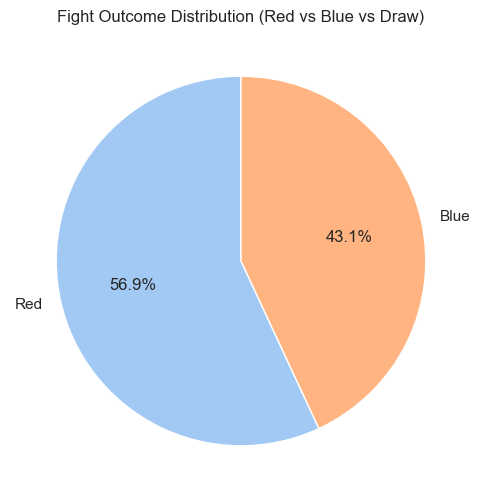

In [147]:
fighter_outcome_count = merged_fighter_stats['who_wins'].value_counts()

plt.figure(figsize=(10, 6))
fighter_outcome_count.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title("Fight Outcome Distribution (Red vs Blue vs Draw)")
plt.ylabel("")
plt.show()

#### Vis 2: Round-wise Fight Outcomes

<Figure size 1000x600 with 0 Axes>

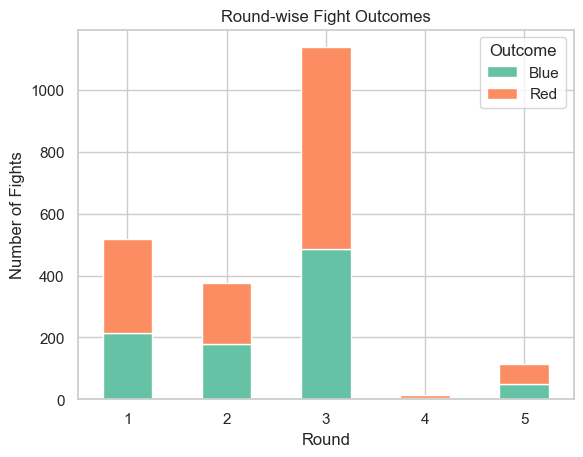

In [175]:
round_outcomes = merged_fighter_stats.groupby(['round', 'who_wins']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
round_outcomes.plot(kind='bar', stacked=True, color=sns.color_palette("Set2"))
plt.title("Round-wise Fight Outcomes")
plt.xlabel("Round")
plt.xticks(rotation=0)
plt.ylabel("Number of Fights")
plt.legend(title="Outcome")
plt.show()

#### Vis 3: Fight Method outcome

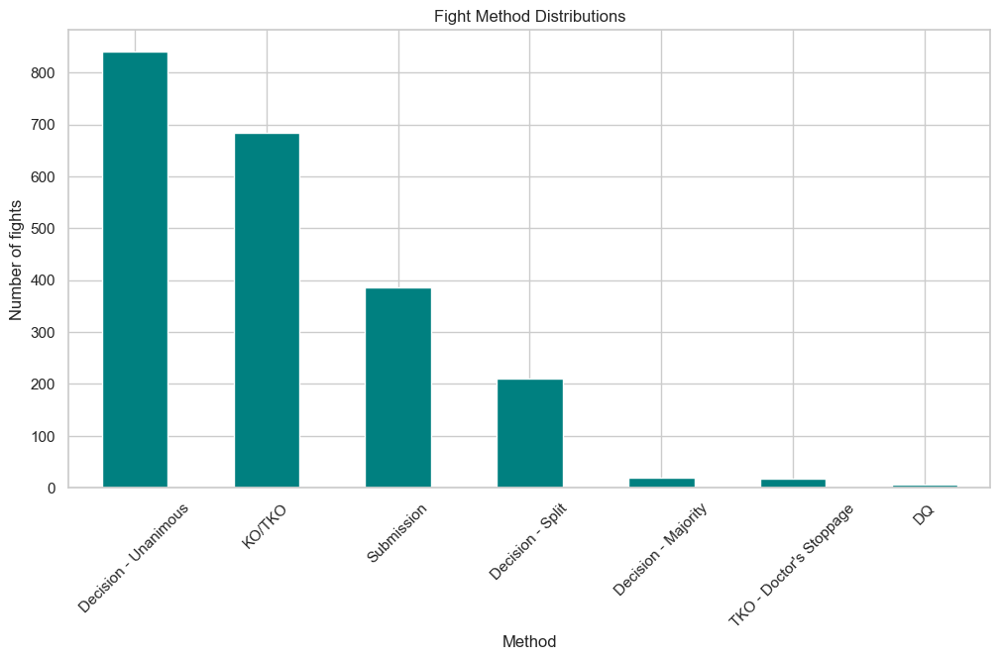

In [149]:
method_counts = merged_fighter_stats['method'].value_counts()

plt.figure(figsize=(12, 6))
method_counts.plot(kind='bar', color='teal')
plt.title('Fight Method Distributions')
plt.xlabel('Method')
plt.ylabel('Number of fights')
plt.xticks(rotation=45)
plt.show()

#### Vis 4:  boxplots for outliers

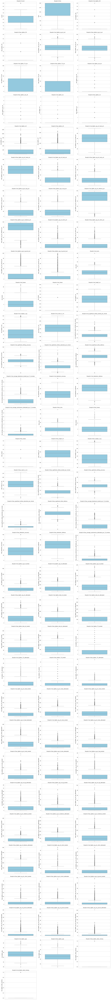

In [150]:

numeric_features = merged_fighter_stats.select_dtypes(include=['float64', 'int64']).columns


num_features = len(numeric_features)
num_rows = (num_features // 3) + (num_features % 3 > 0)  # Calculate number of rows


plt.figure(figsize=(18, num_rows * 5))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(num_rows, 3, i)
    sns.boxplot(y=merged_fighter_stats[feature], color='skyblue')
    plt.title(f"Boxplot of {feature}")
    plt.xlabel("")

plt.tight_layout()
plt.show()


#### Vis 5: Correlation Heatmap 

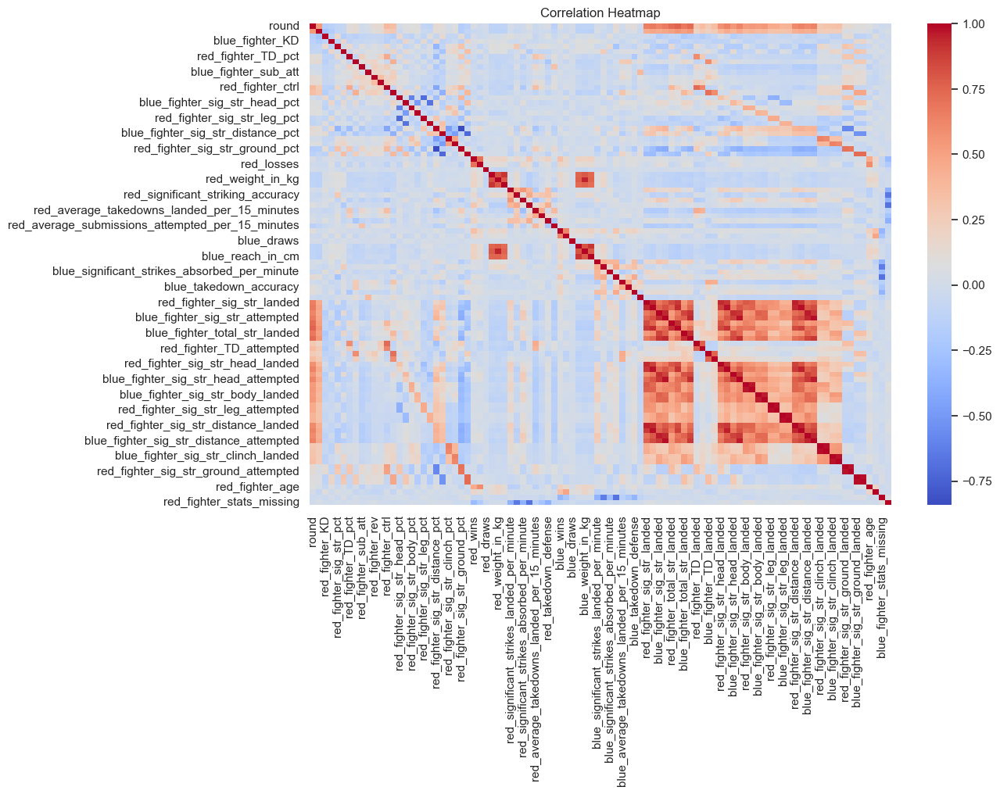

In [151]:
correlation_matrix = merged_fighter_stats.select_dtypes(include=['float64', 'int64', 'Int64']).corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False)
plt.title("Correlation Heatmap")
plt.show()

We can see that we have highly correlated columns, which we need to extract and show


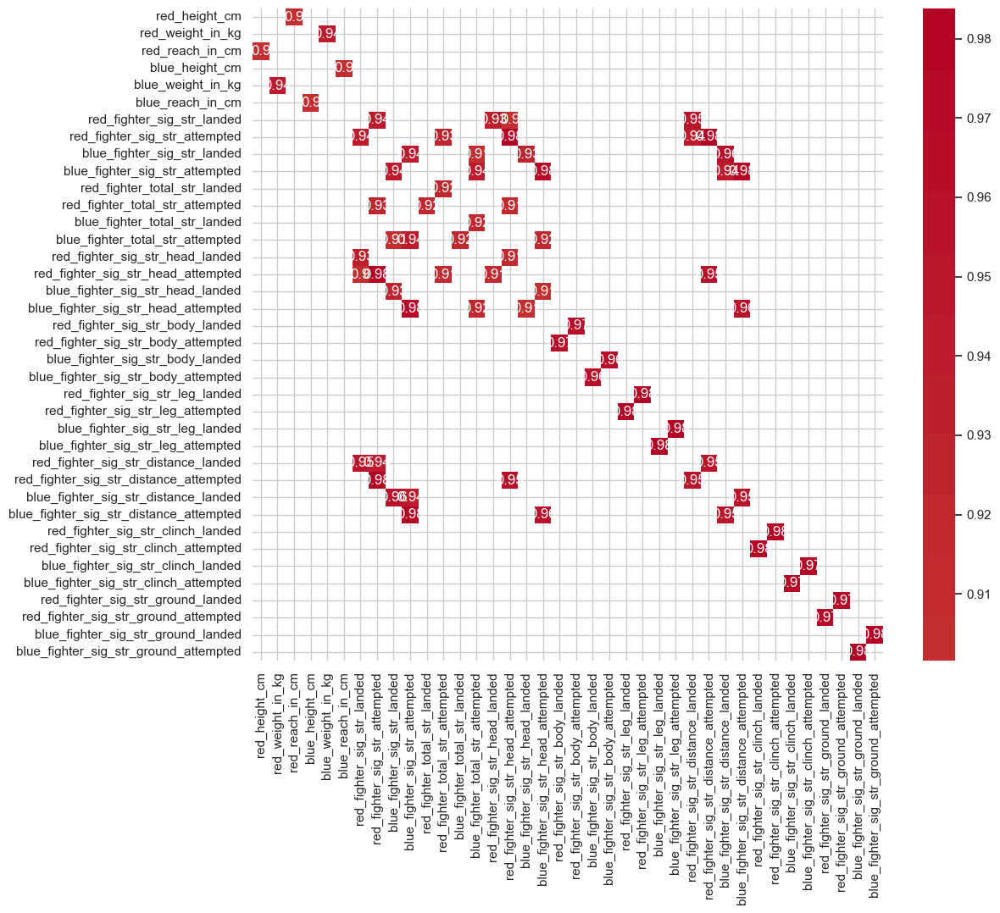

In [152]:
threshold = 0.9

# find correlated columns
filtered_corr_matrix_lrn = correlation_matrix[(correlation_matrix >= threshold) | (correlation_matrix <= -threshold)]

# avoid diagonal of the matrix and get highly correlated  intersections 
np.fill_diagonal(filtered_corr_matrix_lrn.values, np.nan)
filtered_corr_matrix_lrn = filtered_corr_matrix_lrn.dropna(how='all').dropna(axis=1, how='all')

plt.figure(figsize=(12, 10))
sns.heatmap(filtered_corr_matrix_lrn, annot=True, cmap='coolwarm', center=0)
plt.show()

We will remove highly correlated features

In [153]:
def remove_correlated_features(dataset, categorical_features, threshold=0.9):
    corr_matrix = dataset[categorical_features].corr().abs()

    # mask for ignoring self-correlations and it is enough only one triangle, because correlation is symetric
    upper_triangle = np.triu(np.ones(corr_matrix.shape), k=1)
    upper_triangle_matrix = corr_matrix * upper_triangle

    # check which columns we need to drop
    columns_to_drop = [
        column for column in upper_triangle_matrix.columns
        if any(upper_triangle_matrix[column] > threshold)
    ]

    dataset = dataset.drop(columns=columns_to_drop)
    return dataset, columns_to_drop

numerical_features = list(merged_fighter_stats.select_dtypes(include=['float64', 'int64', 'Int64']).columns)
non_correlated_df, correlated_columns = remove_correlated_features(merged_fighter_stats, numeric_features, threshold=0.9)


non_correlated_df

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,blue_fighter_sig_str_landed,red_fighter_total_str_landed,blue_fighter_total_str_landed,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_body_landed,blue_fighter_sig_str_body_landed,red_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_landed,red_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_landed,red_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_landed,red_fighter_age,blue_fighter_age,blue_fighter_stats_missing,red_fighter_stats_missing
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,1,0,52.0,38.0,100.0,0.0,0,0,0,0,45,0,65,59,14,16,20,24,94,100,0,0,5,0,14.0,0.0,0.0,170.18,65.77,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.3,Red,75,79,78,84,2,2,0,0,11,13,15,19,0,0,4,0,28.0,33.0,0,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,100.0,75.0,0.0,50.0,0,1,0,0,0,200,0,66,0,33,100,0,100,0,0,0,0,100,25.0,7.0,0.0,182.88,83.91,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,5.72,58.0,3.46,42.0,3.99,46.0,100.0,2.7,Blue,2,3,2,25,0,0,2,4,0,1,2,0,0,0,0,3,34.0,30.0,0,0
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,No bonus,0,0,48.0,45.0,0.0,0.0,0,0,0,0,91,60,36,18,40,16,23,64,90,94,9,5,0,0,18.0,1.0,1.0,190.50,92.99,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.2,Red,55,53,75,59,0,0,0,1,22,9,13,34,5,3,0,0,32.0,32.0,0,0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,No bonus,0,1,52.0,43.0,60.0,33.0,0,0,0,2,137,287,69,76,23,10,7,13,71,69,23,13,5,17,13.0,0.0,1.0,175.26,65.77,3.65,50.0,2.40,56.0,1.29,46.0,46.0,0.9,17.0,7.0,0.0,170.18,3.76,45.0,3.53,57.0,1.07,26.0,58.0,0.3,Red,52,46,78,52,3,5,1,3,12,5,4,6,12,6,3,8,33.0,33.0,0,0
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,KO/TKO,2,292,Middleweight Bout,perf,1,0,61.0,55.0,0.0,0.0,0,0,0,0,2,21,36,28,44,12,18,58,96,97,3,2,0,0,12.0,0.0,0.0,187.96,83.91,7.53,73.0,4.33,28.0,0.00,0.0,57.0,0.0,9.0,2.0,0.0,190.50,5.97,52.0,3.03,56.0,0.23,33.0,36.0,0.0,Red,65,77,67,77,0,0,0,0,29,10,12,45,2,2,0,0,30.0,34.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2159,FELICE HERRIG,VIRNA JANDIROBA,Submission,1,104,Women's Strawweight Bout,perf,0,0,100.0,80.0,0.0,100.0,0,2,0,0,0,9

In [154]:
correlated_columns

['red_reach_in_cm',
 'blue_weight_in_kg',
 'blue_reach_in_cm',
 'red_fighter_sig_str_attempted',
 'blue_fighter_sig_str_attempted',
 'red_fighter_total_str_attempted',
 'blue_fighter_total_str_attempted',
 'red_fighter_sig_str_head_landed',
 'red_fighter_sig_str_head_attempted',
 'blue_fighter_sig_str_head_landed',
 'blue_fighter_sig_str_head_attempted',
 'red_fighter_sig_str_body_attempted',
 'blue_fighter_sig_str_body_attempted',
 'red_fighter_sig_str_leg_attempted',
 'blue_fighter_sig_str_leg_attempted',
 'red_fighter_sig_str_distance_landed',
 'red_fighter_sig_str_distance_attempted',
 'blue_fighter_sig_str_distance_landed',
 'blue_fighter_sig_str_distance_attempted',
 'red_fighter_sig_str_clinch_attempted',
 'blue_fighter_sig_str_clinch_attempted',
 'red_fighter_sig_str_ground_attempted',
 'blue_fighter_sig_str_ground_attempted']

## Outliers detection

It is neccessary to detect outliers. We will use interquartile range to detect outliers and prepare function for handling

In [155]:
def detect_outliers(df, feature):
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]


def count_outliers(df, numerical_features):
    outliers_counter = {}
    for col in numerical_features:
        outliers = detect_outliers(df, col)
        if(len(outliers) > 0):
            outliers_counter[col] = len(outliers)

    df_outliers = pd.DataFrame.from_dict(outliers_counter, orient='index', columns=['Outlier Count'])
    df_outliers.sort_values(by='Outlier Count', ascending=False, inplace=True)

    return df_outliers

# this function applies interquartile range by default. In case there is another values,
# it will clip by using it
def handle_outliers(df, features, upper_quantile=0.75, lower_quantile=0.25):
    for col in features:  
        # in this case apply interquantile range outliers clip[]
        if upper_quantile == 0.75 and lower_quantile == 0.25:
            Q3 = df[col].quantile(upper_quantile)
            Q1 = df[col].quantile(lower_quantile)

            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            df[col] = np.clip(df[col], lower_bound, upper_bound)

        else:
            upper_bound = df[col].quantile(upper_quantile)
            lower_bound = df[col].quantile(lower_quantile)
            
            df[col] = np.clip(df[col], lower_bound, upper_bound)
            
    return df




We will exclude those columns 'round', 'blue_fighter_stats_missing', 'red_fighter_stats_missing' from outliers removal because round is discrete value and all values have same importance. Other two are indeed categorical features which have been already encoded. Time is also important to exclude because it is related to round. We can mix the rounds and times the match has been finished.


In [156]:
# again calculate numerical features because we removed some
columns_to_exclude_outliers = ['round', 'blue_fighter_stats_missing' , 'red_fighter_stats_missing', 'time']
numerical_features = list(non_correlated_df.select_dtypes(include=['float64', 'int64', 'Int64']).drop(columns=columns_to_exclude_outliers).columns)


numerical_features

['red_fighter_KD',
 'blue_fighter_KD',
 'red_fighter_sig_str_pct',
 'blue_fighter_sig_str_pct',
 'red_fighter_TD_pct',
 'blue_fighter_TD_pct',
 'red_fighter_sub_att',
 'blue_fighter_sub_att',
 'red_fighter_rev',
 'blue_fighter_rev',
 'red_fighter_ctrl',
 'blue_fighter_ctrl',
 'red_fighter_sig_str_head_pct',
 'blue_fighter_sig_str_head_pct',
 'red_fighter_sig_str_body_pct',
 'blue_fighter_sig_str_body_pct',
 'red_fighter_sig_str_leg_pct',
 'blue_fighter_sig_str_leg_pct',
 'red_fighter_sig_str_distance_pct',
 'blue_fighter_sig_str_distance_pct',
 'red_fighter_sig_str_clinch_pct',
 'blue_fighter_sig_str_clinch_pct',
 'red_fighter_sig_str_ground_pct',
 'blue_fighter_sig_str_ground_pct',
 'red_wins',
 'red_losses',
 'red_draws',
 'red_height_cm',
 'red_weight_in_kg',
 'red_significant_strikes_landed_per_minute',
 'red_significant_striking_accuracy',
 'red_significant_strikes_absorbed_per_minute',
 'red_significant_strike_defence',
 'red_average_takedowns_landed_per_15_minutes',
 'red_takedo

In [157]:
outliers_sum = count_outliers(non_correlated_df, numerical_features)
outliers_sum

,Outlier Count
red_fighter_sub_att,482
red_fighter_KD,432
blue_fighter_sub_att,384
blue_fighter_KD,355
red_draws,316
...,...
red_fighter_sig_str_head_pct,38
blue_fighter_total_str_landed,37
red_fighter_total_str_landed,29
blue_fighter_age,27


In [158]:
handled_outliers_df = handle_outliers(non_correlated_df, numerical_features, upper_quantile=0.75, lower_quantile=0.25)
outliers_sum = count_outliers(handled_outliers_df, numerical_features)
outliers_sum

,Outlier Count


In [159]:
#handled_outliers_df.to_csv(intermediate_steps_folder + 'DS_after_outliers_handling.csv')
handled_outliers_df

,red_fighter_name,blue_fighter_name,method,round,time,bout_type,bonus,red_fighter_KD,blue_fighter_KD,red_fighter_sig_str_pct,blue_fighter_sig_str_pct,red_fighter_TD_pct,blue_fighter_TD_pct,red_fighter_sub_att,blue_fighter_sub_att,red_fighter_rev,blue_fighter_rev,red_fighter_ctrl,blue_fighter_ctrl,red_fighter_sig_str_head_pct,blue_fighter_sig_str_head_pct,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct,red_wins,red_losses,red_draws,red_height_cm,red_weight_in_kg,red_significant_strikes_landed_per_minute,red_significant_striking_accuracy,red_significant_strikes_absorbed_per_minute,red_significant_strike_defence,red_average_takedowns_landed_per_15_minutes,red_takedown_accuracy,red_takedown_defense,red_average_submissions_attempted_per_15_minutes,blue_wins,blue_losses,blue_draws,blue_height_cm,blue_significant_strikes_landed_per_minute,blue_significant_striking_accuracy,blue_significant_strikes_absorbed_per_minute,blue_significant_strike_defence,blue_average_takedowns_landed_per_15_minutes,blue_takedown_accuracy,blue_takedown_defense,blue_average_submissions_attempted_per_15_minutes,who_wins,red_fighter_sig_str_landed,blue_fighter_sig_str_landed,red_fighter_total_str_landed,blue_fighter_total_str_landed,red_fighter_TD_landed,red_fighter_TD_attempted,blue_fighter_TD_landed,blue_fighter_TD_attempted,red_fighter_sig_str_body_landed,blue_fighter_sig_str_body_landed,red_fighter_sig_str_leg_landed,blue_fighter_sig_str_leg_landed,red_fighter_sig_str_clinch_landed,blue_fighter_sig_str_clinch_landed,red_fighter_sig_str_ground_landed,blue_fighter_sig_str_ground_landed,red_fighter_age,blue_fighter_age,blue_fighter_stats_missing,red_fighter_stats_missing
0,ILIA TOPURIA,MAX HOLLOWAY,KO/TKO,3,94,UFC Featherweight Title Bout,belt,0,0,52.0,38.0,100.0,0.0,0,0,0,0,45.0,0,65.0,59,14.0,16.0,20.0,24.0,94.0,100.0,0,0,5,0.0,14.0,0.0,0.0,170.18,65.77,4.44,46.0,3.05,67.0,2.19,56.0,92.0,1.5,25.0,7.0,0.0,180.34,7.17,47.0,4.75,59.0,0.27,53.0,84.0,0.30,Red,75.0,79.0,78.0,84.0,2,2,0.0,0,11,13,15.0,19.0,0,0,4,0.000,28.0,33.0,0,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,Submission,1,214,Middleweight Bout,perf,0,0,85.0,75.0,0.0,50.0,0,0,0,0,0.0,200,3.5,66,0.0,33.0,56.5,0.0,100.0,28.5,0,0,0,27.5,25.0,7.0,0.0,182.88,83.91,4.47,42.0,3.39,60.0,0.85,39.0,82.0,0.0,13.0,0.0,0.0,187.96,5.72,58.0,3.46,42.0,3.99,46.0,100.0,1.75,Blue,2.0,3.0,2.0,25.0,0,0,2.0,4,0,1,2.0,0.0,0,0,0,3.000,34.0,30.0,0,0
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,Decision - Unanimous,3,300,Light Heavyweight Bout,No bonus,0,0,48.0,45.0,0.0,0.0,0,0,0,0,91.0,60,36.0,18,40.0,16.0,23.0,57.5,90.0,94.0,9,5,0,0.0,18.0,1.0,0.0,190.50,92.99,3.56,52.0,2.20,58.0,1.07,31.0,86.0,0.0,14.0,3.0,0.0,193.04,4.01,50.0,2.30,53.0,0.82,25.0,90.0,0.20,Red,55.0,53.0,75.0,59.0,0,0,0.0,1,22,9,13.0,23.5,5,3,0,0.000,32.0,32.0,0,0
3,LERONE MURPHY,DAN IGE,Decision - Unanimous,3,300,Featherweight Bout,No bonus,0,0,52.0,43.0,60.0,33.0,0,0,0,0,137.0,287,69.0,76,23.0,10.0,7.0,13.0,71.0,69.0,23,13,5,17.0,13.0,0.0,0.0,175.26,65.77,3.65,50.0,2.40,56.0,1.29,46.0,46.0,0.9,17.0,7.0,0.0,170.18,3.76,45.0,3.53,57.0,1.07,26.0,58.0,0.30,Red,52.0,46.0,78.0,52.0,3,5,1.0,3,12,5,4.0,6.0,12,6,3,8.000,33.0,33.0,0,0
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,KO/TKO,2,292,Middleweight Bout,perf,0,0,61.0,55.0,0.0,0.0,0,0,0,0,2.0,21,36.0,28,44.0,12.0,18.0,57.5,96.0,97.0,3,2,0,0.0,12.0,0.0,0.0,187.96,83.91,7.45,67.0,4.33,35.5,0.00,0.0,57.0,0.0,9.0,2.0,0.0,190.50,5.97,52.0,3.03,56.0,0.23,33.0,36.0,0.00,Red,65.0,77.0,67.0,77.0,0,0,0.0,0,29,10,12.0,23.5,2,2,0,0.000,30.0,34.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

## Categorical Label encoding

Before splitting data set into parts, we will encode categorical variables

In [160]:
le = LabelEncoder()

# extract categorical features
categorical_features = list(handled_outliers_df.select_dtypes(include=['object']).columns)


# get a copy of the dataframe
encoded_df = handled_outliers_df.copy()

for feature in categorical_features:
    encoded_df[feature] = le.fit_transform(encoded_df[feature])

#encoded_df.to_csv(intermediate_steps_folder + 'DS_after_encoding.csv')

print(categorical_features)

['red_fighter_name', 'blue_fighter_name', 'method', 'bout_type', 'bonus', 'who_wins']


## Train test split and other scaling transformations

Now, we need to scale features which are skewed or not normaly distributed. Before that we will plot distributions to have a better look of it.

In [161]:
def plot_dataset_histogram(dataset, categorical_features):
    # create plotting df, we exclude categorical columns
    df_for_plot = dataset.drop(columns=categorical_features)

    num_features = len(list(df_for_plot.columns))
    num_rows = (num_features // 3) + (num_features % 3 > 0)  # Calculate number of rows
    plt.figure(figsize=(18, num_rows * 5))
    for i, feature in enumerate(list(df_for_plot.columns), 1):
        plt.subplot(num_rows, 3, i)
        sns.histplot(x=df_for_plot[feature], kde=True, color='green')
        plt.title(f"Boxplot of {feature}")
        plt.xlabel("")

    plt.tight_layout()
    plt.show()



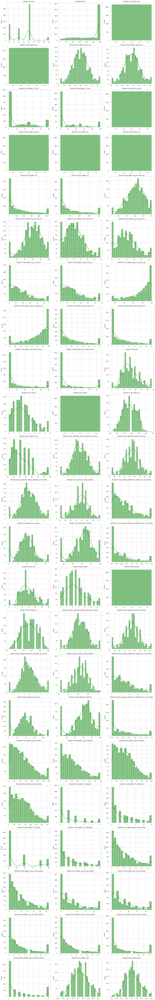

In [162]:
# we need to add missing statistics for blue and red fighter stats, because they are binary categorical values
categorical_features.extend(['blue_fighter_stats_missing', 'red_fighter_stats_missing'])
plot_dataset_histogram(encoded_df, categorical_features)


We will need to detect which are skewed features. We will apply logarithmic transformation. However, firstly we will split dataset

In [163]:
X = encoded_df.drop(columns=['who_wins'])
y = encoded_df['who_wins']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)



Now, we will detect skew features. They will be independently done for train and test


In [164]:
def log_transform(X_train, X_test, skewed_features_train, skewed_features_test):
    X_train[skewed_features_train] = X_train[skewed_features_train].apply(lambda x: np.log1p(x))
    X_test[skewed_features_test] = X_test[skewed_features_test].apply(lambda x: np.log1p(x))
    
    return X_train, X_test

In [165]:
# apply logarithmic function
skewed_features_train = [col for col in X_train.columns if X_train[col].skew() < -1 or X_train[col].skew() > 1]
skewed_features_test = [col for col in X_test.columns if X_test[col].skew() < -1 or X_test[col].skew() > 1]

X_train, X_test = log_transform(X_train, X_test, skewed_features_train=skewed_features_train, skewed_features_test=skewed_features_test)

## First ML testing

In this task, we will use 4 different classifiers, which use different logic for predicting the values. Those are:
- SVM
- Random Forest
- XGBoost
- MLP

Initially we will use default parameters without any data tranformation except logarithmic operation

In [166]:
# initialize ML models
models = {
    "MLP": MLPClassifier(),
    "SVM": SVC(),
    "XGBoost": XGBClassifier(), 
    "RandomForest": RandomForestClassifier()
}

results = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Compute metrics
    results[model_name] = {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "Confusion Matrix": confusion_matrix(y_test, y_pred),
        "Classification Report": classification_report(y_test, y_pred)
    }

# Convert results to DataFrame for display
df_results = pd.DataFrame({model: {metric: results[model][metric] for metric in ["Accuracy", "Precision", "Recall", "F1 Score"]} for model in results})

In [167]:
for model_name, result in results.items():
    print("Model: ", model_name)
    print(result['Classification Report'])

Model:  MLP
              precision    recall  f1-score   support

           0       0.90      0.32      0.48       195
           1       0.64      0.97      0.77       238

    accuracy                           0.68       433
   macro avg       0.77      0.65      0.62       433
weighted avg       0.76      0.68      0.64       433

Model:  SVM
              precision    recall  f1-score   support

           0       0.88      0.68      0.77       195
           1       0.78      0.92      0.84       238

    accuracy                           0.81       433
   macro avg       0.83      0.80      0.81       433
weighted avg       0.82      0.81      0.81       433

Model:  XGBoost
              precision    recall  f1-score   support

           0       0.80      0.80      0.80       195
           1       0.84      0.84      0.84       238

    accuracy                           0.82       433
   macro avg       0.82      0.82      0.82       433
weighted avg       0.82      0.82 

Now, we will do scaling and applying k-fold cross valdiation with grid search hyperparameter tuning

In [176]:
# Define scalers
scaler_standard = StandardScaler()
scaler_minmax = MinMaxScaler()

# Define classifiers and hyperparameter grids
models = {
    "RandomForest": (RandomForestClassifier(), {"n_estimators": [50, 100], "max_depth": [None, 10]}),
    # SVM takes a lot of time toe xecute, so we executed it once and remember the results 
    # in the chunk below
    #"SVM": (SVC(), {"C": [0.1, 1, 10], "kernel": ["linear", 'rbf']}), 
    "XGBoost": (XGBClassifier(), {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1]}),
    "MLP": (MLPClassifier(), {"hidden_layer_sizes": [(50,), (100,)], "alpha": [0.0001, 0.001]})
}

# Scaling combinations
scaling_methods = {
    "No Scaling": lambda X: X,
    "Standard Scaling": lambda X: scaler_standard.fit_transform(X),
    "MinMax Scaling": lambda X: scaler_minmax.fit_transform(X)
}

# Perform k-fold cross-validation with hyperparameter tuning
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for model_name, (model, param_grid) in models.items():
    for scaling_name, scaling_function in scaling_methods.items():
        print(f"Training {model_name} with {scaling_name}...")
        
        # Apply scaling
        X_scaled = scaling_function(X)
        
        grid_search = GridSearchCV(model, param_grid, cv=kf, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_scaled, y)
        
        print(f"Best parameters for {model_name} ({scaling_name}): {grid_search.best_params_}")
        print(f"Best accuracy for {model_name} ({scaling_name}): {grid_search.best_score_}\n")


Training RandomForest with No Scaling...
Best parameters for RandomForest (No Scaling): {'max_depth': 10, 'n_estimators': 100}
Best accuracy for RandomForest (No Scaling): 0.8438104097168763

Training RandomForest with Standard Scaling...
Best parameters for RandomForest (Standard Scaling): {'max_depth': 10, 'n_estimators': 100}
Best accuracy for RandomForest (Standard Scaling): 0.8364169018903429

Training RandomForest with MinMax Scaling...
Best parameters for RandomForest (MinMax Scaling): {'max_depth': None, 'n_estimators': 100}
Best accuracy for RandomForest (MinMax Scaling): 0.840572876571722

Training XGBoost with No Scaling...
Best parameters for XGBoost (No Scaling): {'learning_rate': 0.1, 'n_estimators': 100}
Best accuracy for XGBoost (No Scaling): 0.8502844068086564

Training XGBoost with Standard Scaling...
Best parameters for XGBoost (Standard Scaling): {'learning_rate': 0.1, 'n_estimators': 100}
Best accuracy for XGBoost (Standard Scaling): 0.8502844068086564

Training XG

This is output with SVM. We will remember this because we don't want to repeat SVM because it takes 41 min to execute all combinations

Training RandomForest with No Scaling...
Best parameters for RandomForest (No Scaling): {'max_depth': None, 'n_estimators': 100}
Best accuracy for RandomForest (No Scaling): 0.8382666153451372

Training RandomForest with Standard Scaling...
Best parameters for RandomForest (Standard Scaling): {'max_depth': 10, 'n_estimators': 100}
Best accuracy for RandomForest (Standard Scaling): 0.842881276195364

Training RandomForest with MinMax Scaling...
Best parameters for RandomForest (MinMax Scaling): {'max_depth': None, 'n_estimators': 100}
Best accuracy for RandomForest (MinMax Scaling): 0.8410358395346847

Training SVM with No Scaling...
Best parameters for SVM (No Scaling): {'C': 1, 'kernel': 'linear'}
Best accuracy for SVM (No Scaling): 0.8553652382174322

Training SVM with Standard Scaling...
Best parameters for SVM (Standard Scaling): {'C': 0.1, 'kernel': 'linear'}
Best accuracy for SVM (Standard Scaling): 0.8572170900692841

Training SVM with MinMax Scaling...
Best parameters for SVM (MinMax Scaling): {'C': 1, 'kernel': 'linear'}
Best accuracy for SVM (MinMax Scaling): 0.8558303395774528

Training XGBoost with No Scaling...
Best parameters for XGBoost (No Scaling): {'learning_rate': 0.1, 'n_estimators': 100}
Best accuracy for XGBoost (No Scaling): 0.8502844068086564

Training XGBoost with Standard Scaling...
Best parameters for XGBoost (Standard Scaling): {'learning_rate': 0.1, 'n_estimators': 100}
Best accuracy for XGBoost (Standard Scaling): 0.8502844068086564

Training XGBoost with MinMax Scaling...
Best parameters for XGBoost (MinMax Scaling): {'learning_rate': 0.1, 'n_estimators': 100}
Best accuracy for XGBoost (MinMax Scaling): 0.8502844068086564

Training MLP with No Scaling...
Best parameters for MLP (No Scaling): {'alpha': 0.0001, 'hidden_layer_sizes': (50,)}
Best accuracy for MLP (No Scaling): 0.8202367205542724

Training MLP with Standard Scaling...
Best parameters for MLP (Standard Scaling): {'alpha': 0.001, 'hidden_layer_sizes': (100,)}
Best accuracy for MLP (Standard Scaling): 0.8364211786844582

Training MLP with MinMax Scaling...
Best parameters for MLP (MinMax Scaling): {'alpha': 0.0001, 'hidden_layer_sizes': (100,)}
Best accuracy for MLP (MinMax Scaling): 0.8498182362501069

#### Output analysis
From the output above, we can extract information:

Random Forest<br/>
No Scaling -> 0.83826 <br/>
Standard Scaling -> 0.84288 -> The best<br/>
MinMax -> 0.84103<br/>

SVM <br/>
No Scaling -> 0.85536<br/>
Standard Scaling -> 0.85721 -> The best<br/>
MinMax Scaling -> 0.85583<br/>

XGBoost <br/>
No Scaling -> 0.85028<br/>
Standard Scaling -> 0.85028<br/>
MinMax Scaling -> 0.85028 <br/>
For all accuracy is same, so it doesn't matter

MLP<br/>
No Scaling -> 0.82023<br/>
Standard Scaling -> 0.83642<br/>
MinMax Scaling -> 0.84981 -> The best<br/>
 
Using accuracy as main metric, we can conclude that the best algorithm is SVM, with scaled features and parameters:
{'C': 0.1, 'kernel': 'linear'}

We will use it for the final prediction


In [177]:
# define hyperparameters
c = 0.1
kernel = 'linear'

scaler = StandardScaler()

# apply standard scaler
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = SVC(C=c, kernel=kernel)

model.fit(X_train_scaled, y_train)
y_pred = model.predict(X_test_scaled)

results = {
    "Metric": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "Value": [
        accuracy_score(y_test, y_pred),
        precision_score(y_test, y_pred),
        recall_score(y_test, y_pred),
        f1_score(y_test, y_pred)
    ]
}

# Convert dictionary to Pandas DataFrame
df_results = pd.DataFrame(results)

df_results

,Metric,Value
0,Accuracy,0.702079
1,Precision,0.965812
2,Recall,0.474790
3,F1 Score,0.636620


In [170]:
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[191   4]
 [125 113]]


In [171]:
classification_report = classification_report(y_test, y_pred)
print(classification_report)

              precision    recall  f1-score   support

           0       0.60      0.98      0.75       195
           1       0.97      0.47      0.64       238

    accuracy                           0.70       433
   macro avg       0.79      0.73      0.69       433
weighted avg       0.80      0.70      0.69       433



However, the last result is not so good, accuracy is 70%. It is expected because this model almost cannot be used in reality because of a lot of reasons.
If we knew how to predict fights, we would be rich. However, we can use this model to try and predict the outcome of the fight, but we need to be aware that this model is not perfect and it can be used only for fun.

# Question 2 - NLP nicknames analysis

The goal is to see if there are any topic clusters or common sentiments for them. For example,
"The Reaper" and "The Body Snatcher" are death related, "The Hulk" and "The Ninja" are some
supernatural names, "The Ox" and "Crocota" are animal related etc.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import seaborn as sns

## Dataset creation

We will use the statistics dataset to create a new dataset that will have the following columns:
- fighter	
- result	
- nickname	
- event_date

In [2]:
stats = pd.read_csv("datasets/stats.csv", sep=";")
stats.head()

,red_fighter_name,blue_fighter_name,event_date,red_fighter_nickname,blue_fighter_nickname,red_fighter_result,blue_fighter_result,method,round,time,...,red_fighter_sig_str_body_pct,blue_fighter_sig_str_body_pct,red_fighter_sig_str_leg_pct,blue_fighter_sig_str_leg_pct,red_fighter_sig_str_distance_pct,blue_fighter_sig_str_distance_pct,red_fighter_sig_str_clinch_pct,blue_fighter_sig_str_clinch_pct,red_fighter_sig_str_ground_pct,blue_fighter_sig_str_ground_pct
0,ILIA TOPURIA,MAX HOLLOWAY,26/10/2024,El Matador,Blessed,W,L,KO/TKO,3,1:34,...,14,16,20,24,94,100,0,0,5,0
1,ROBERT WHITTAKER,KHAMZAT CHIMAEV,26/10/2024,The Reaper,Borz,L,W,Submission,1,3:34,...,0,33,100,0,100,0,0,0,0,100
2,MAGOMED ANKALAEV,ALEKSANDAR RAKIC,26/10/2024,-,Rocket,W,L,Decision - Unanimous,3,5:00,...,40,16,23,64,90,94,9,5,0,0
3,LERONE MURPHY,DAN IGE,26/10/2024,The Miracle,50K,W,L,Decision - Unanimous,3,5:00,...,23,10,7,13,71,69,23,13,5,17
4,SHARA MAGOMEDOV,ARMEN PETROSYAN,26/10/2024,Bullet,Superman,W,L,KO/TKO,2,4:52,...,44,12,18,58,96,97,3,2,0,0


Let's check for missing values.

In [40]:
stats.isnull().sum()

red_fighter_name                     0
blue_fighter_name                    0
event_date                           0
red_fighter_nickname                 0
blue_fighter_nickname                0
red_fighter_result                   0
blue_fighter_result                  0
method                               0
round                                0
time                                 0
time_format                          0
referee                              0
details                              0
bout_type                            0
bonus                                0
event_name                           0
event_location                       0
red_fighter_KD                       0
blue_fighter_KD                      0
red_fighter_sig_str                  0
blue_fighter_sig_str                 0
red_fighter_sig_str_pct              0
blue_fighter_sig_str_pct             0
red_fighter_total_str                0
blue_fighter_total_str               0
red_fighter_TD           

The **fighters** dataframe will be constructed by combining red and blue fighters name, nickname and result.

In [3]:
# transform the stats dataset to have one row per figher 
# - red_fighter_name and blue_fighter_name = fighter
# - red_fighter_result and blue_fighter_result = result
# - red_fighter_nickname and blue_fighter_nickname = nickname
# - keep event_date

fighters = pd.DataFrame()
fighters["fighter"] = pd.concat([stats["red_fighter_name"], stats["blue_fighter_name"]])
fighters["result"] = pd.concat([stats["red_fighter_result"], stats["blue_fighter_result"]])
fighters["nickname"] = pd.concat([stats["red_fighter_nickname"], stats["blue_fighter_nickname"]])
fighters["event_date"] = stats["event_date"].reset_index(drop=True)

fighters.head()

,fighter,result,nickname,event_date
0,ILIA TOPURIA,W,El Matador,26/10/2024
1,ROBERT WHITTAKER,L,The Reaper,26/10/2024
2,MAGOMED ANKALAEV,W,-,26/10/2024
3,LERONE MURPHY,W,The Miracle,26/10/2024
4,SHARA MAGOMEDOV,W,Bullet,26/10/2024


Now we can take only the nicknames. Let's check out some examples.

In [9]:
nicknames = fighters[["fighter", "nickname"]].drop_duplicates()
# show 20 random nicknames
nicknames.sample(20)

,fighter,nickname
4777,GARETT WHITELEY,Goodnight
4593,PHILLIPE NOVER,The Filipino Assassin
7163,KRISTOF MIDOUX,The Hurricane
7051,JOSH HAYNES,Bring the Pain
692,ALEXANDR ROMANOV,King Kong
766,KRON GRACIE,-
16,CAMERON SMOTHERMAN,The Baby-Faced Killa
2688,DANIEL TEYMUR,Kid Dynamite
5789,DELSON HELENO,Pe De Chumbo
704,CODY BRUNDAGE,-


## NLP Analysis

In [5]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/lucijaaleksic/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/lucijaaleksic/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

To preprocess a nickname we will remove any punctuation and stopwords. We will remove both english and spanish stopwords since some fighters have spanish nicknames, e.g. El Matador.

In [11]:
def preprocess_nickname(nickname):
    # remove punctuation
    nickname = nickname.translate(str.maketrans('', '', string.punctuation))
    # remove stopwords
    stop_words_en = set(stopwords.words('english'))
    stop_words_es = set(stopwords.words('spanish'))
    word_tokens = word_tokenize(nickname)
    filtered_sentence = [w for w in word_tokens if not w.lower() in stop_words_en and not w.lower() in stop_words_es]
    # filtered_sentence = " ".join(filtered_sentence)
    return filtered_sentence, word_tokens

clean = []
tokens = []
for nickname in nicknames["nickname"]:
    filtered_sentence, word_tokens = preprocess_nickname(nickname)
    clean.append(" ".join(filtered_sentence))
    tokens.append(word_tokens)
    
nicknames["clean"] = clean
nicknames["tokens"] = tokens

# remove nicknames with no "nickname" after preprocessing
nicknames = nicknames[nicknames["clean"] != ""]

nicknames.head()

,fighter,nickname,clean,tokens
0,ILIA TOPURIA,El Matador,Matador,"[El, Matador]"
1,ROBERT WHITTAKER,The Reaper,Reaper,"[The, Reaper]"
3,LERONE MURPHY,The Miracle,Miracle,"[The, Miracle]"
4,SHARA MAGOMEDOV,Bullet,Bullet,[Bullet]
5,IBO ASLAN,The Last Ottoman,Last Ottoman,"[The, Last, Ottoman]"


### 1. Natural clustering of nicknames

Firstly, let's try to cluster the nicknames using KMeans and TF-IDF Vectorization. Then we can anaylze the clusters and see if there are any common themes.

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from collections import defaultdict

In [13]:
# TF-IDF vectorization
vectorizer = TfidfVectorizer(max_features=1000)
tfidf_matrix = vectorizer.fit_transform(nicknames["clean"])

# KMeans clustering
kmeans = KMeans(n_clusters=7, random_state=42)  # Adjust n_clusters based on your data

In [14]:
nicknames["cluster"] = kmeans.fit_predict(tfidf_matrix)

for cluster in range(kmeans.n_clusters):
    print(f"\nCluster {cluster}:")
    cluster_nicknames = nicknames[nicknames["cluster"] == cluster]["nickname"].values.tolist()
    print(", ".join(cluster_nicknames))

/Users/lucijaaleksic/anaconda3/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 0:
El Matador, The Reaper, The Miracle, Bullet, The Last Ottoman, Handz of Steel, African Savage, Ferocious, Fluffy, InnerG, White Kong, The Damage, Superman, La Pantera, Super Mely, Raw Dawg, Bang Bang, KGD, D-Rod, JSP, The Answer, The Juggernaut, The Determined, Poatan, Rocky, Fenomeno, Wonderboy, Thud, Cesinha, Superman, Cookie Monster, The Crusher, The Sniper, Jaguar, Air, The Last Pirate, Smile Killer, The Hulk, Mr. Highlight, Double Impact, Fiona, The Zulu Warrior, Suga, T-City, Golden Boy, Lazy Boy, El Loco, Puro Chicali, El Nino Problema, Durinho, Bate Estaca, Mean Machine, Danger, The Midwest Choppa, Lipe Detona, The Killa Gorilla, Overkill, Robzilla, Genghis, The Haitian Sensation, The Golden Boy, The Great, Savage, Slava Claus, The Joker, Stillknocks, Don't Blink, Gamer, Bam Bam, The Leech, Kuya, King, Phar, Kakamora, Tybur, The Leech, LeftHand2God, El Guapo, The Moroccan Devil, Rondinha, Chito, El Cucuy, El Fenomeno, The Professional, The UAE Warrior, Georgian Viki

We can descripe the clusters by looking at the most common words in each cluster.
1. Topics like killing and danger (Violent Bob Ross, The Butcher), titles (Lord, Archangel), animlals some geographical (Felipinho, The Irish Dragon) can be found, this is by far the biggest cluster.
2. This cluster contains names with the word "train" (The Train, Freight Train) or depict something big (Big Rig, Big C, Big Dog).
3. Here we have all related to psychopaths (Psycho, The American Psycho).
4. This cluster has names related to the word "hammer" (The Russian Hammer, The War Hammer)
5. This fifth cluster has names related to the word "gladiator" (The Baltic Gladiator, The Gladiator)
6. Last cluster contains names related to the word "assassin" (The Silent Assassin, The Assassin Baby, The Greek Assassin).


## 2. Predefined topic cluster

Here we'll use a transformer model to embed topics and then find the closest nicknames to each topic.

In [15]:
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# pretrained model for embedding sentences
model = SentenceTransformer('all-MiniLM-L6-v2')

topics = [
    "protagonist", "antagonist",  # narrative
    "european", "american", "latino", "asian",  # geographic
    "animal", "supernatural", "death"  # thematic
]

topic_embeddings = model.encode(topics)
nickname_embeddings = model.encode(nicknames["clean"].values)


def find_closest_topic(nickname_embedding, topic_embeddings, topics):
    similarities = cosine_similarity([nickname_embedding], topic_embeddings)[0]
    closest_topic_idx = np.argmax(similarities)
    return topics[closest_topic_idx]


nicknames["assigned_topic"] = [
    find_closest_topic(nickname_embedding, topic_embeddings, topics)
    for nickname_embedding in nickname_embeddings
]

for topic in topics:
    print(f"\nTopic: {topic}")
    print(nicknames[nicknames["assigned_topic"] == topic]["nickname"].values)

/Users/lucijaaleksic/anaconda3/envs/torch/lib/python3.10/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange



Topic: protagonist
['El Matador' 'Superman' 'Bang Bang' 'The Juggernaut' 'Wonderboy'
 'Superman' 'The Crusher' 'The Sniper' 'The Last Pirate' 'Mr. Highlight'
 'The Zulu Warrior' 'Golden Boy' 'Lazy Boy' 'The Golden Boy' 'Slava Claus'
 'Bam Bam' 'King' 'Rondinha' 'The Professional' 'Almighty' 'The Prospect'
 'The Welsh Gangster' 'Marretinha' 'Juicy J' 'The Fearless'
 'The Karate Hottie' 'Hillman' 'Mr. Perfect' 'Bam Bam' 'Melk Cauthy'
 'Rudeboy' 'The Fresh Prince' 'Junior' 'Lil Monster' 'Bruce Leeroy'
 'Marreta' 'Lord Kong' 'Magnum' 'The All-American' 'Senor Perfecto' 'Josi'
 'Pastor' 'Blonde Fighter' 'The Young Punisher' 'The Big Boy' 'JoJo'
 'Bigi Boy' 'Pride of Palestine' 'The King' 'The High Chief' 'Nomad'
 'Kung Fu Kid' 'The Carpenter' 'Puna' 'Captain Morocco' 'Ataman' 'Mamba'
 'StarBoy' 'The Last Ninja' 'Blessed' 'Ninja' 'Young Savage' 'The Matrix'
 'The Sniper' 'Bonecrusher' 'Rebel Girl' 'Pretty Boy' 'Superman'
 'The Warrior Princess' 'Remember the Name' 'Uglyman Joe' 'Knightmare'

It can help us to represent clusters with word clouds to gain better insights.

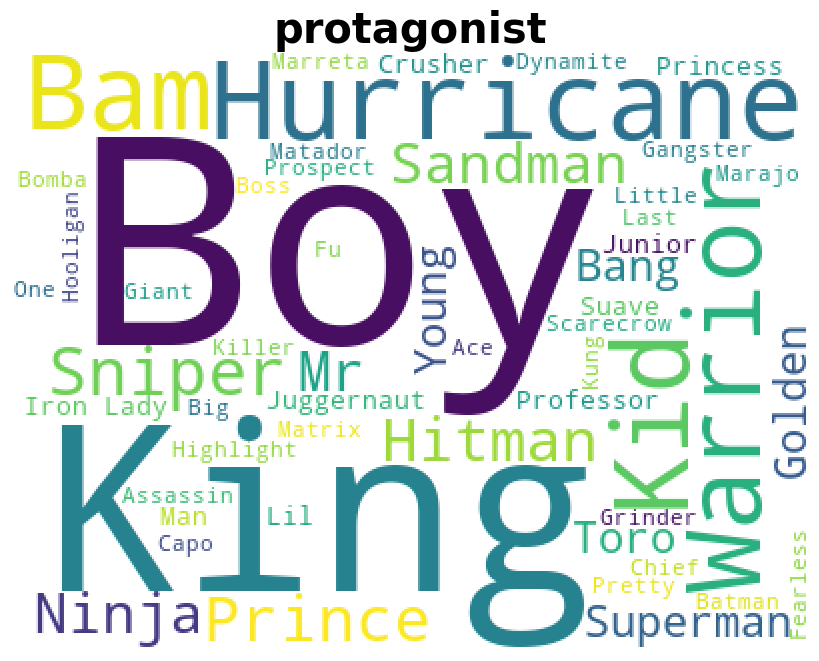

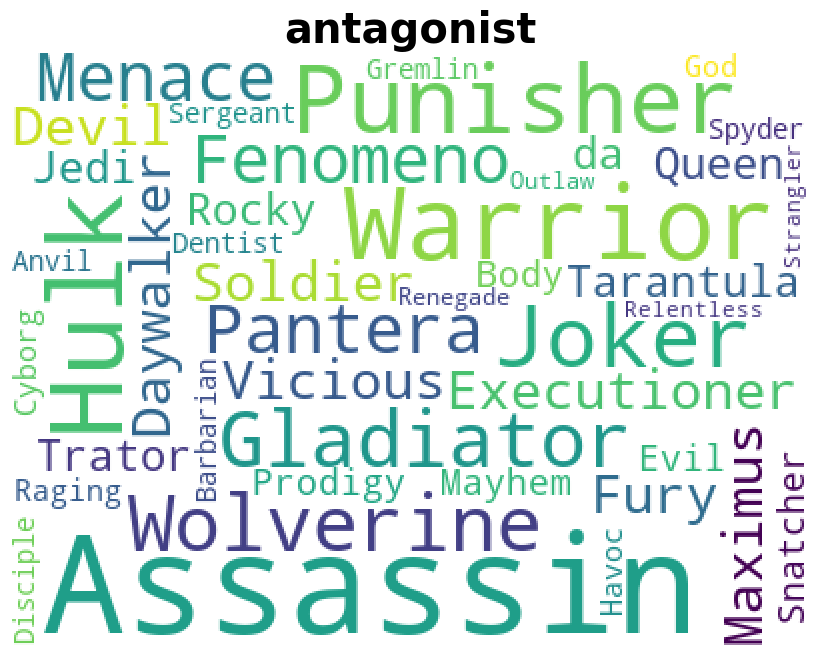

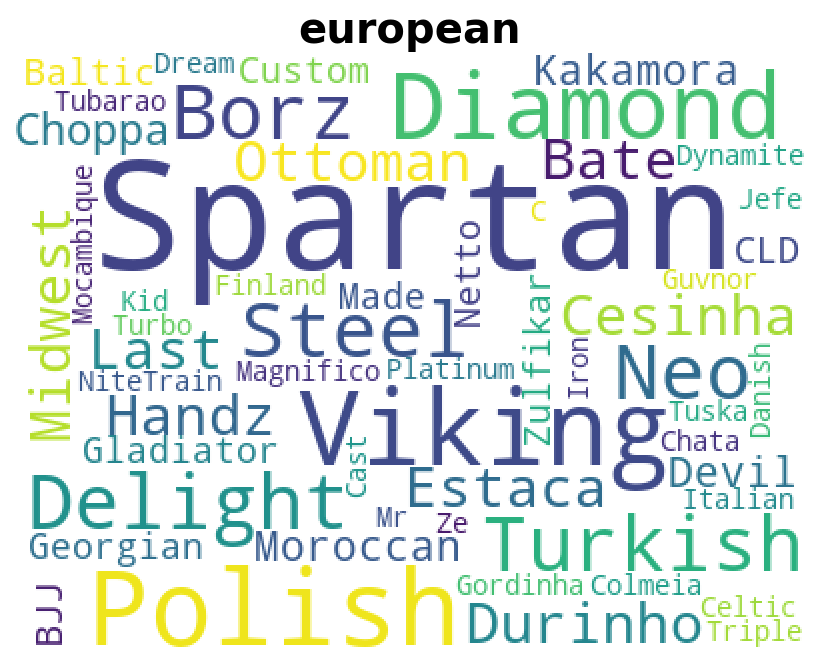

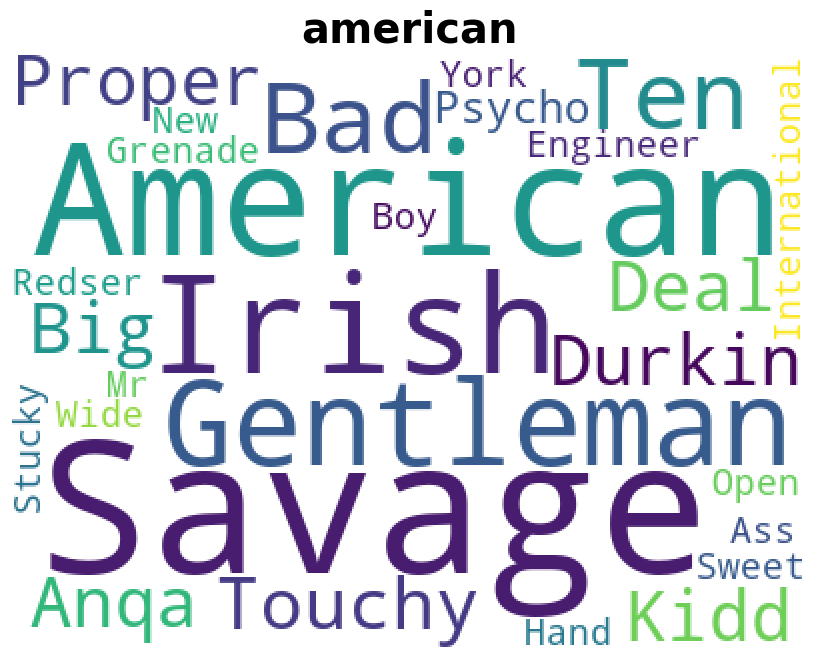

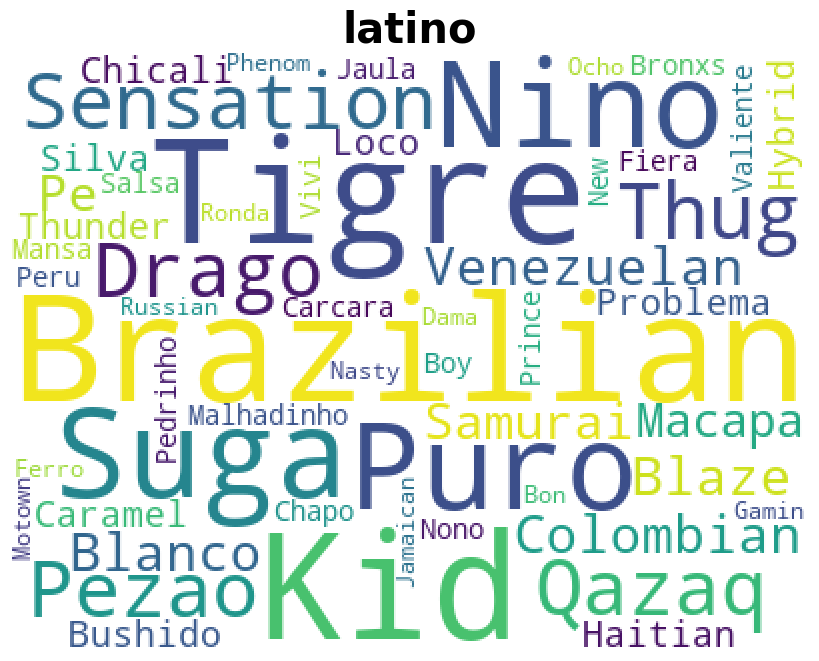

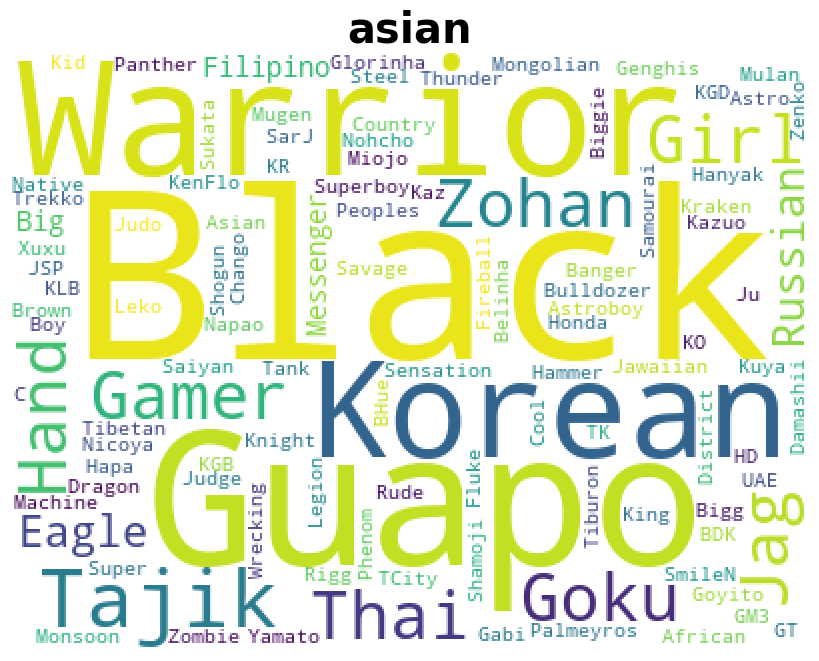

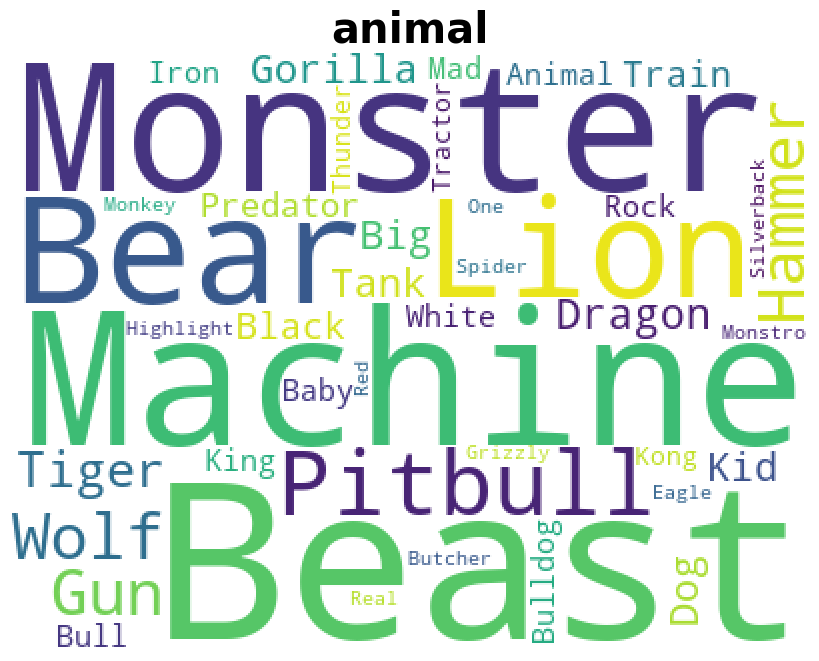

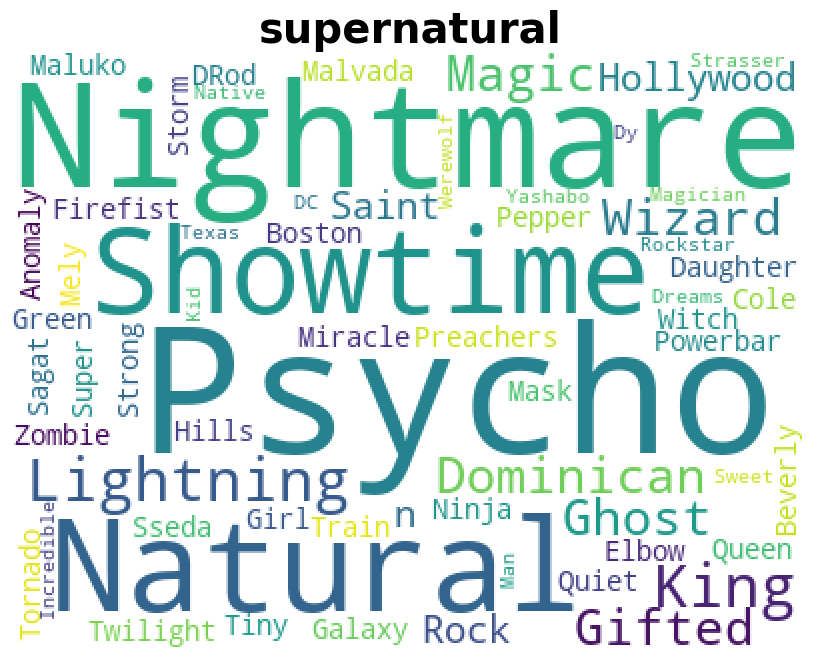

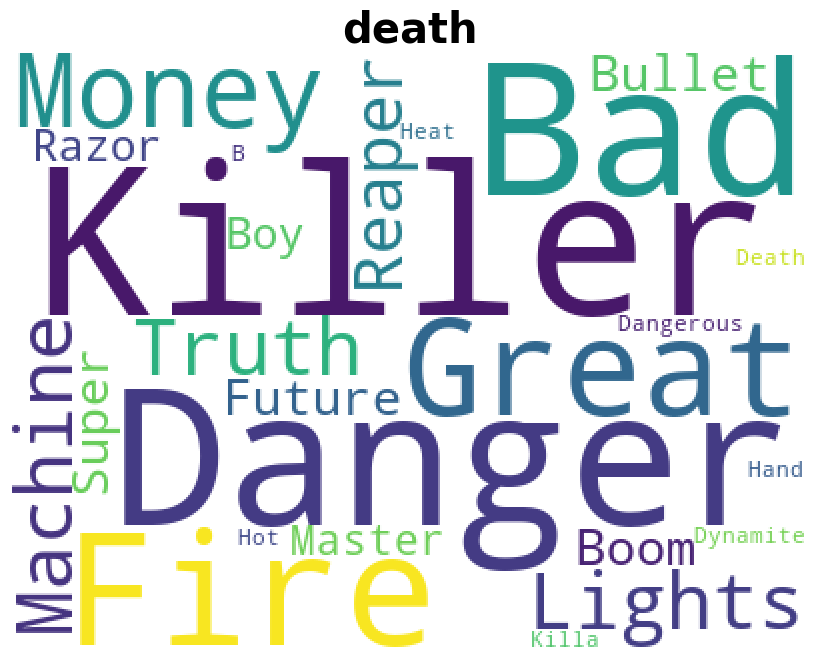

In [20]:
from wordcloud import WordCloud

# visualize wordcloud for each topic
for topic in topics:
    wordcloud = WordCloud(width = 400, height = 300, 
                background_color ='white', 
                stopwords = set(stopwords.words('english')), 
                min_font_size = 10).generate(" ".join(nicknames[nicknames["assigned_topic"] == topic]["clean"]))
    
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(f"{topic}", fontsize=30, color="black", fontweight="bold")
    plt.show()

In [38]:
# print sizes of all clusters in nicknames["assigned_topic"] 
for topic in topics:
    print(f"Cluster {topic}: {len(nicknames[nicknames['assigned_topic'] == topic])}")

Cluster protagonist: 310
Cluster antagonist: 220
Cluster european: 93
Cluster american: 30
Cluster latino: 142
Cluster asian: 99
Cluster animal: 392
Cluster supernatural: 97
Cluster death: 251


We can see for the **protagonist** topic words like "kid", "king", "boy" and "warrior" are the most common. 

For the **antagonist** topic words like "assassin", "devil", "punisher" and "executioner" can be found.

In the **european** word cloud the most common is the "spartan" word. Along with "viking", "polish", "turkish". It's interesting that a word like "diamond" is very common in this cluster.

For the **american** word cloud the most common is of course the "american" word. It's weird why the word "Irish" is very represented here and not in the european cluster. The word "savage" and "gentleman" are also here.

In the **latino** cluster we have many spanish and portuguese words alongside with geographical names like "colombian" and "brazilian". There are words "tigre", "nino" and "caramel".

**Asian** cluster has words like "korean", "russian", "thai, as well as some words liek "dragon" or "goku". It's interesting as to why the word "black" is so common here.

The **animal** cluster has words like "beast" which is the most common as well as "pitbull", "tiger", "lion" and "dragon". The word "machine" is here which is weird.

In the **supernatural** cluster we have words "nightmare", "psycho", "ghost" and "wizard".

In the final cluster **death** we have words like "killer", "danger", "bad" and "money".

We can identify a potential issue with clustering and that is the different language. In this approach we clustered all spanish names together, but inside the cluster we can still assign topics. For example, one of the more represented words "nino" is the equivalent of "kid" which is in the **protagonist** cluster. Also, the word "tigre" can be put in the **animal** cluster.

# Question 3

## Fighters and Fighting Styles Analysis


Imports


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import matplotlib.patches as patches


### Loading Data


In [2]:
fighter_stats = pd.read_csv("datasets/fighter_stats.csv")
fighters = pd.read_csv("datasets/pro_mma_fighters.csv")
fights_df = pd.read_csv("datasets/merged_stats_n_scorecards.csv", sep=";")


Cleaning datasets and removing unnecessary columns


In [3]:
fighter_stats = fighter_stats.dropna(subset=["name"])
fighters = fighters.dropna(subset=["fighter_name"])


In [4]:
duplicate_stats = fighter_stats["name"][fighter_stats["name"].duplicated()]
duplicate_rows_stats = fighter_stats[fighter_stats["name"].isin(duplicate_stats)]

duplicate_fighters = fighters["fighter_name"][fighters["fighter_name"].duplicated()]
duplicate_rows_fighters = fighters[fighters["fighter_name"].isin(duplicate_fighters)]

fighter_stats = fighter_stats[~fighter_stats["name"].isin(duplicate_stats)]
fighters = fighters[~fighters["fighter_name"].isin(duplicate_fighters)]


In [5]:
cols_stats = [
    "nickname",
    "height_cm",
    "weight_in_kg",
    "reach_in_cm",
    "stance",
    "date_of_birth",
    "wins",
]
cols_fighters = [
    "url",
    "nickname",
    "birth_date",
    "age",
    "death_date",
    "height",
    "weight",
    "lossess",
]
fighter_stats.drop(columns=cols_stats, inplace=True)
fighters.drop(columns=cols_fighters, inplace=True)


Merging data


In [6]:
merged_data = pd.merge(
    fighter_stats, fighters, left_on="name", right_on="fighter_name", how="inner"
)
merged_data[["wins", "wins_other", "losses", "losses_other", "draws"]] = merged_data[
    ["wins", "wins_other", "losses", "losses_other", "draws"]
].fillna(0)

merged_data.head()


,name,losses,draws,significant_strikes_landed_per_minute,significant_striking_accuracy,significant_strikes_absorbed_per_minute,significant_strike_defence,average_takedowns_landed_per_15_minutes,takedown_accuracy,takedown_defense,...,weight_class,wins,wins_ko,wins_submission,wins_decision,wins_other,losses_ko,losses_submission,losses_decision,losses_other
0,Robert Drysdale,0,0,0.00,0.0,0.00,0.0,7.32,100.0,0.0,...,Light Heavyweight,7,0,7,0,0.0,0,0,0,0.0
1,Paul Ruiz,4,0,1.40,33.0,1.40,75.0,0.00,0.0,100.0,...,Bantamweight,7,3,1,3,0.0,0,0,3,0.0
2,Gerald Strebendt,7,0,0.00,0.0,4.00,38.0,0.00,0.0,0.0,...,Lightweight,9,1,8,0,0.0,4,3,0,0.0
3,Neil Grove,8,1,0.00,0.0,0.00,0.0,0.00,0.0,100.0,...,Heavyweight,12,12,0,0,0.0,1,3,4,0.0
4,Raphael Butler,2,1,4.69,45.0,0.94,91.0,0.00,0.0,100.0,...,Heavyweight,9,6,3,0,0.0,1,1,0,0.0


Two data frames containing information about fighters were merged based on the fighter names and all NaN values are replaced by zeroes in all columns where they semantically represent 0.


### Most Successful Fighters Overall


#### Top 20 Fighters with most overall wins


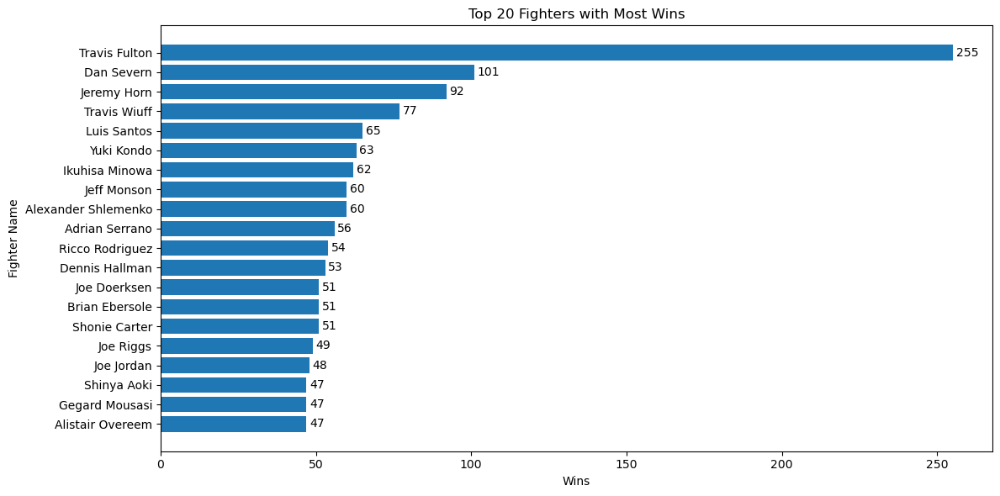

In [7]:
top_20_fighters = merged_data.nlargest(20, "wins")[["name", "wins"]]
top_fighters = set(top_20_fighters["name"])

plt.figure(figsize=(12, 6))
plt.barh(top_20_fighters["name"], top_20_fighters["wins"], align="center")
plt.xlabel("Wins")
plt.ylabel("Fighter Name")
plt.title("Top 20 Fighters with Most Wins")
plt.gca().invert_yaxis()

for index, value in enumerate(top_20_fighters["wins"]):
    plt.text(value + 1, index, str(value), va="center")

plt.tight_layout()

plt.show()


Travis Fulton stands out as the fighter with by far the most wins, but Dan Severn, Jeremy Horn and Travis Wiuff (althouh by smaller margin) are also ahead of the curve.


#### Top 20 Fighters with most wins, but without a loss


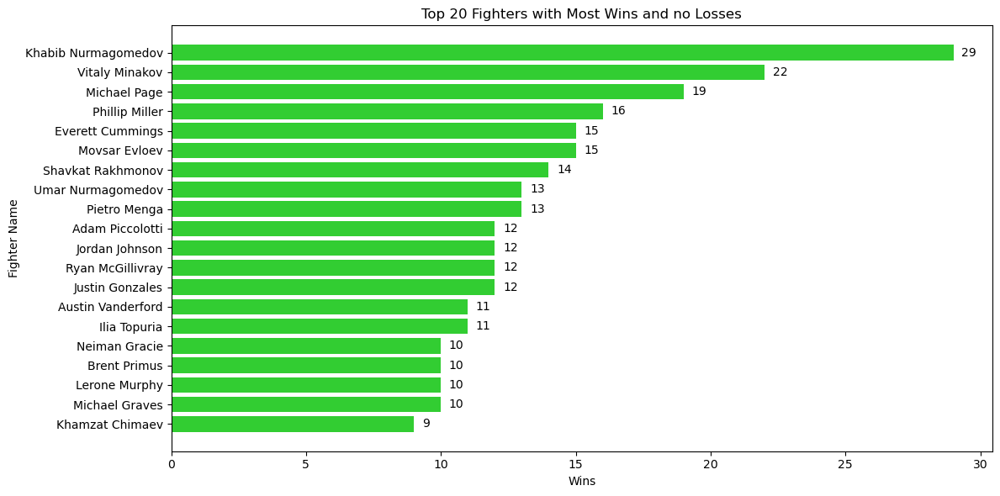

In [8]:
zero_losses = merged_data[merged_data["losses"] == 0]
top_20_unbeaten = zero_losses.nlargest(20, "wins")[["name", "wins"]]
top_fighters.update(top_20_unbeaten["name"])


plt.figure(figsize=(12, 6))
plt.barh(
    top_20_unbeaten["name"], top_20_unbeaten["wins"], align="center", color="limegreen"
)
plt.xlabel("Wins")
plt.ylabel("Fighter Name")
plt.title("Top 20 Fighters with Most Wins and no Losses")
plt.gca().invert_yaxis()

for index, value in enumerate(top_20_unbeaten["wins"]):
    plt.text(value + 0.3, index, str(value), va="center")

plt.tight_layout()

plt.show()


Khabib Nurmagomedov's unbeaten record is the most impressive one.


#### Top 20 Fighters considering win percentage, $\frac{wins}{wins + draws + losses}$


In [9]:
merged_data["no_of_fights"] = merged_data[["wins", "losses", "draws"]].sum(
    axis=1, skipna=True
)
merged_data["win_percentage"] = merged_data["wins"] / merged_data["no_of_fights"]
tenth_perc_no_of_fights = round(merged_data["no_of_fights"].quantile(0.1))
print("10th percintile of number of fights: ", (tenth_perc_no_of_fights))


10th percintile of number of fights:  8


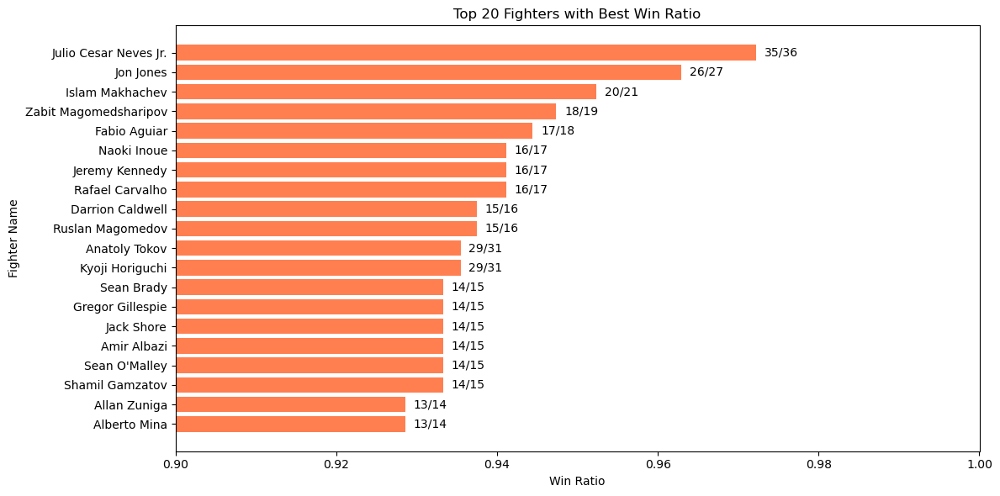

In [10]:
over_tenth_perc_fights = merged_data[
    merged_data["no_of_fights"] > tenth_perc_no_of_fights
].copy()
over_tenth_perc_fights = over_tenth_perc_fights[
    over_tenth_perc_fights["win_percentage"] != 1
]
over_tenth_perc_fights = over_tenth_perc_fights.sort_values(
    by=["win_percentage", "no_of_fights"], ascending=[False, False]
)

top_20_percentage = over_tenth_perc_fights.head(20)[
    ["name", "wins", "no_of_fights", "win_percentage"]
]
top_fighters.update(top_20_percentage["name"])

plt.figure(figsize=(12, 6))
plt.barh(
    top_20_percentage["name"],
    top_20_percentage["win_percentage"],
    align="center",
    color="coral",
)
plt.xlabel("Win Ratio")
plt.ylabel("Fighter Name")
plt.title("Top 20 Fighters with Best Win Ratio")
plt.gca().invert_yaxis()
plt.xlim(0.9, 1)

for i, row in enumerate(top_20_percentage.itertuples()):
    annotation = f"{row.wins}/{row.no_of_fights}"
    plt.text(row.win_percentage + 0.001, i, annotation, va="center")

plt.tight_layout()

plt.show()


The win percentage is not calculated on 10% least experienced fighters in dataset, because the small number of fights can lead to wrong conclusions. Also, the fighters with 0 losses are also excluded because they all have 100% win rate and are already processed in the previous visualization.

All fighters that proved to be top 20 and appeared in these three visualizations were saved in set of best fighters.


### Most Successful Fighters Based on Winning Style

<!-- Only fighters with more than median number of wins are considered -->

#### Distribution of winning types

All wins


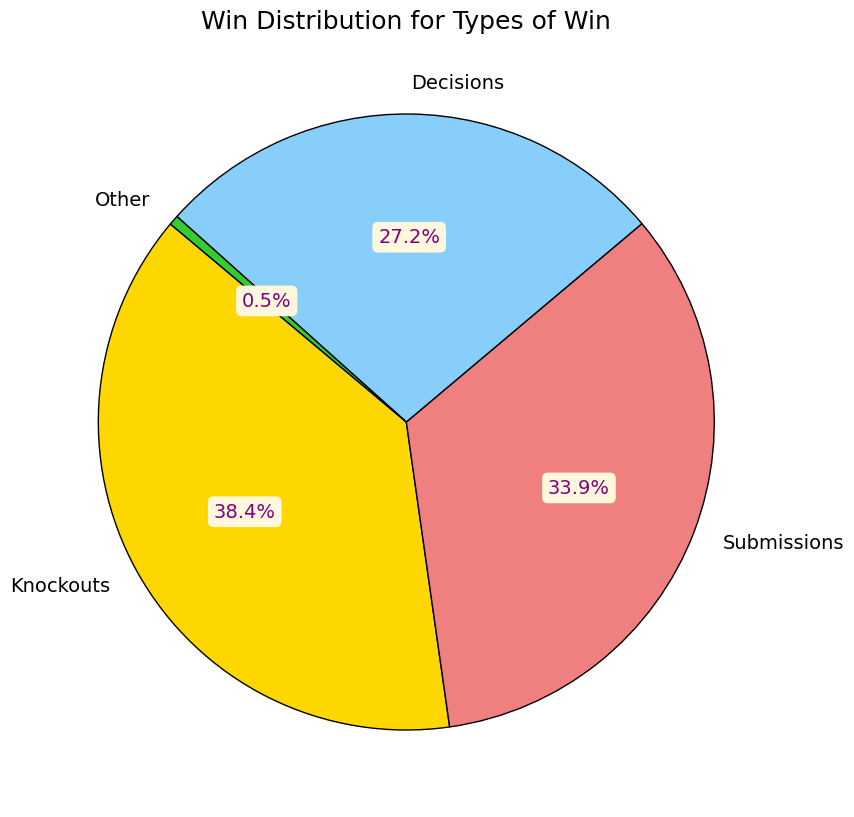

In [11]:
win_type_data = merged_data[merged_data["wins"] >= 1]

knockouts = win_type_data["wins_ko"].sum()
submission = win_type_data["wins_submission"].sum()
decision = win_type_data["wins_decision"].sum()
other = win_type_data["wins_other"].sum()
total_wins = win_type_data["wins"].sum()


other += total_wins - (knockouts + submission + decision + other)

labels = ["Knockouts", "Submissions", "Decisions", "Other"]
sizes = [knockouts, submission, decision, other]
colors = ["gold", "lightcoral", "lightskyblue", "limegreen"]
label_fontsize = 14
title_fontsize = 18
autopct_color = "purple"
background_color = "cornsilk"

plt.figure(figsize=(10, 10))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct="%1.1f%%",
    startangle=140,
    wedgeprops={"edgecolor": "black"},
    textprops={"fontsize": label_fontsize},
)

for autotext in autotexts:
    bbox_props = {
        "boxstyle": "round,pad=0.3",
        "facecolor": background_color,
        "edgecolor": "none",
    }
    autotext.set_bbox(bbox_props)
    autotext.set_color(autopct_color)
    autotext.set_fontsize(label_fontsize)

plt.title("Win Distribution for Types of Win", fontsize=title_fontsize)

plt.show()


This chart illustrates that knockouts are the most common method of victory, with submissions and decisions also playing significant roles. Together, these three outcomes form an almost even distribution, collectively accounting for nearly all fight results.


Fighters with dominant style


In [12]:
win_type_data = win_type_data.copy()
win_type_data["ko_perc"] = (win_type_data["wins_ko"]) / (win_type_data["wins"])
win_type_data["submission_perc"] = (
    (win_type_data["wins_submission"]) / (win_type_data["wins"])
)
win_type_data["decision_perc"] = (
    (win_type_data["wins_decision"]) / (win_type_data["wins"])
)

melted_data = win_type_data.melt(
    id_vars=["name", "wins"],
    value_vars=["ko_perc", "submission_perc", "decision_perc"],
    var_name="Type",
    value_name="Percentage",
)

dominant_type = melted_data[melted_data["Percentage"] > 0.5]

print(
    "Proportion of fighters that do have dominant way of winning: {:.2f}%".format(
        len(dominant_type) / len(win_type_data) * 100
    )
)


Proportion of fighters that do have dominant way of winning: 58.89%


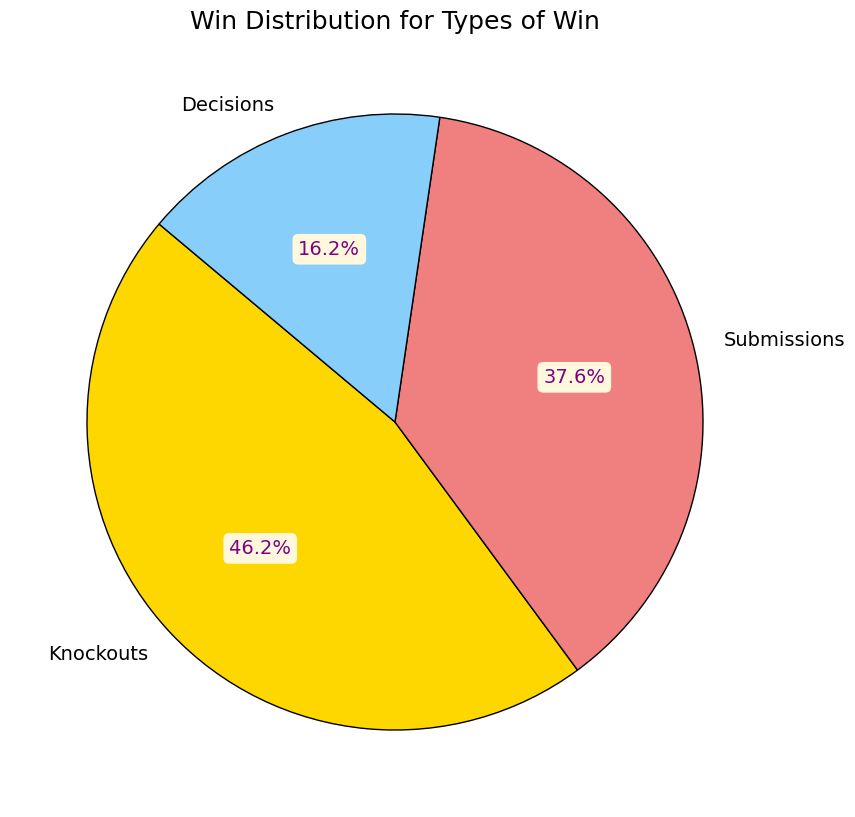

In [13]:
ko_df = dominant_type[dominant_type["Type"] == "ko_perc"]
ko_submission = dominant_type[dominant_type["Type"] == "submission_perc"]
ko_decision = dominant_type[dominant_type["Type"] == "decision_perc"]

labels = ["Knockouts", "Submissions", "Decisions"]
sizes = [len(ko_df), len(ko_submission), len(ko_decision)]
colors = ["gold", "lightcoral", "lightskyblue"]
label_fontsize = 14
title_fontsize = 18
autopct_color = "purple"
background_color = "cornsilk"

plt.figure(figsize=(10, 10))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct="%1.1f%%",
    startangle=140,
    wedgeprops={"edgecolor": "black"},
    textprops={"fontsize": label_fontsize},
)

for autotext in autotexts:
    bbox_props = {
        "boxstyle": "round,pad=0.3",
        "facecolor": background_color,
        "edgecolor": "none",
    }
    autotext.set_bbox(bbox_props)
    autotext.set_color(autopct_color)
    autotext.set_fontsize(label_fontsize)

plt.title("Win Distribution for Types of Win", fontsize=title_fontsize)

plt.show()


Firstly, columns containing percentage of fights won by type of outcome were added. To say one predominantly wins by certain outcome, more than 50% percent of his victories must be by that outcome, so only rows with `Percentage` > 50% were left in the data frame. As shown, around 60% of fighters do have an outcome they predominantly win with. In the consequent Pie-Chart it can be seen, as expected that no fighter


#### Fighters With Dominant Style Among Best Fighters


In [14]:
print("Number of best fighters: ", len(top_fighters))
best_dominant_fighters = (
    dominant_type[dominant_type["name"].isin(top_fighters)]
    .sort_values(by="Percentage", ascending=False)
    .reset_index()
)
print("Number of best fighters with dominant style: ", len(best_dominant_fighters))
print(
    "Ratio of fighters with dominant style among best fighters: {:.1f}%".format(
        len(best_dominant_fighters) / len(top_fighters) * 100
    )
)


Number of best fighters:  60
Number of best fighters with dominant style:  39
Ratio of fighters with dominant style among best fighters: 65.0%


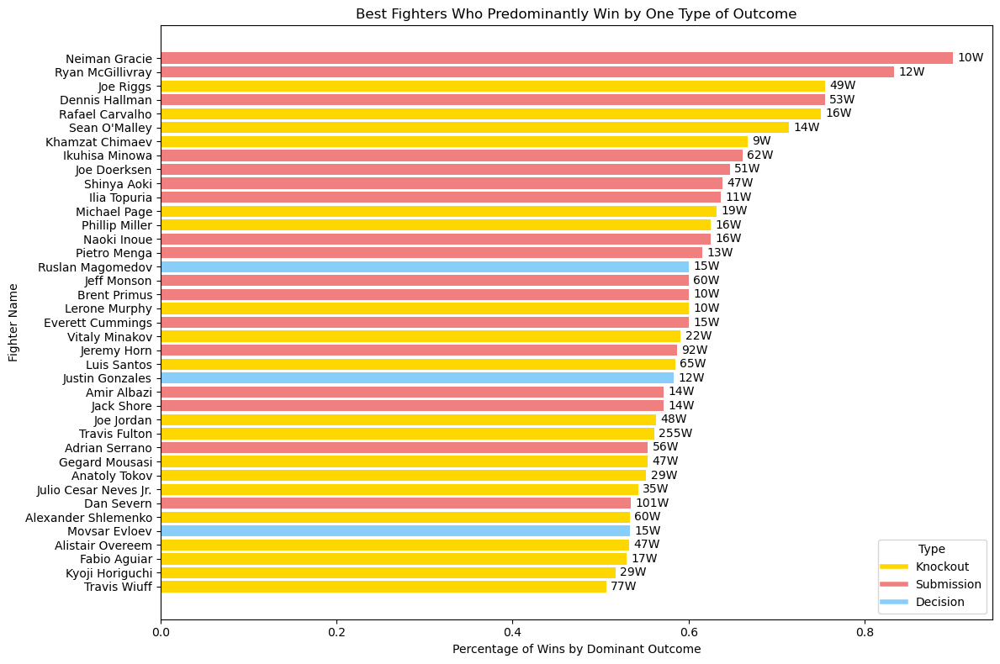

In [15]:
color_map = {
    "ko_perc": "gold",
    "submission_perc": "lightcoral",
    "decision_perc": "lightskyblue",
}
win_type_map = {
    "ko_perc": "Knockout",
    "submission_perc": "Submission",
    "decision_perc": "Decision",
}

best_dominant_fighters["Color"] = best_dominant_fighters["Type"].map(color_map)

plt.figure(figsize=(12, 8))
bars = plt.barh(
    best_dominant_fighters["name"],
    best_dominant_fighters["Percentage"],
    color=best_dominant_fighters["Color"],
    align="center",
)

plt.xlabel("Percentage of Wins by Dominant Outcome")
plt.ylabel("Fighter Name")
plt.title("Best Fighters Who Predominantly Win by One Type of Outcome")
plt.gca().invert_yaxis()

legend_labels = [
    plt.Line2D([0], [0], color=color, lw=4) for color in color_map.values()
]
legend_names = [win_type_map[key] for key in color_map.keys()]
plt.legend(legend_labels, legend_names, title="Type", loc="lower right")

for i, row in enumerate(best_dominant_fighters.itertuples()):
    plt.text(row.Percentage + 0.005, i, f"{row.wins}W", va="center")


plt.tight_layout()
plt.show()


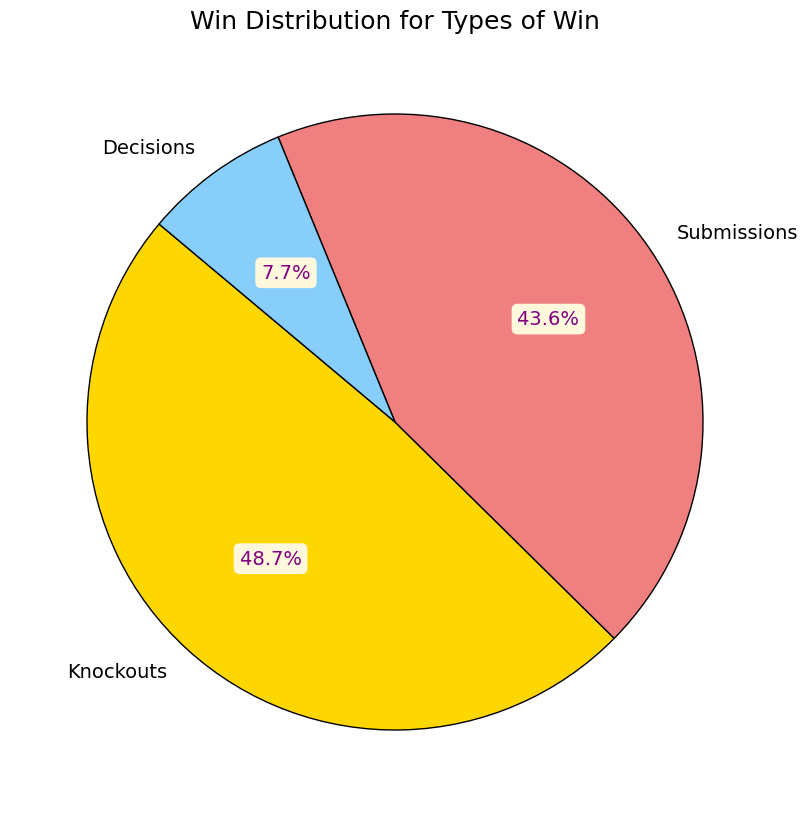

In [16]:
labels = ["Knockouts", "Submissions", "Decisions"]
sizes = [
    len(best_dominant_fighters[best_dominant_fighters["Type"] == "ko_perc"]),
    len(best_dominant_fighters[best_dominant_fighters["Type"] == "submission_perc"]),
    len(best_dominant_fighters[best_dominant_fighters["Type"] == "decision_perc"]),
]
colors = ["gold", "lightcoral", "lightskyblue"]
label_fontsize = 14
title_fontsize = 18
autopct_color = "purple"
background_color = "cornsilk"

plt.figure(figsize=(10, 10))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct="%1.1f%%",
    startangle=140,
    wedgeprops={"edgecolor": "black"},
    textprops={"fontsize": label_fontsize},
)

for autotext in autotexts:
    bbox_props = {
        "boxstyle": "round,pad=0.3",
        "facecolor": background_color,
        "edgecolor": "none",
    }
    autotext.set_bbox(bbox_props)
    autotext.set_color(autopct_color)
    autotext.set_fontsize(label_fontsize)

plt.title("Win Distribution for Types of Win", fontsize=title_fontsize)

plt.show()


In [17]:
average_percentage_per_type = best_dominant_fighters.groupby("Type")[
    "Percentage"
].mean()
print(
    "Average win percentage for Knockout fighters: {:.2f}%".format(
        average_percentage_per_type["ko_perc"] * 100
    )
)
print(
    "Average win percentage for Submission fighters: {:.2f}%".format(
        average_percentage_per_type["submission_perc"] * 100
    )
)
print(
    "Average win percentage for Decision fighters: {:.2f}%".format(
        average_percentage_per_type["decision_perc"] * 100
    )
)


Average win percentage for Knockout fighters: 59.51%
Average win percentage for Submission fighters: 64.29%
Average win percentage for Decision fighters: 57.22%


Here are the best fighters that have won with one style more than half of their fights. Number of wins is displayed to the right of the bars in barplot. From obtained 60 best fighters in previous parts of code, 39 of them match th "Fighters With Dominant Style" role. Interestingly, here fighters who win by submission the most came even closer to knockout fighters representation-wise. In addition, most submission fighters are in the top part of the graph. Numerical confirmation is the average win percentage, which submission fighters have the largest. Furthermore, the share of decision fighters kept falling and among these 39 fighters there are only three decision fighters and they have the lowest average win percentage. That can be explained by the fact that man can not depend on referee's decision in most of the fights and be very successful.


### Location


Mapping all countries to corresponding continent


In [18]:
Europe = [
    "Austria",
    "Belgium",
    "Bosnia and Herzegovina",
    "Bulgaria",
    "Croatia",
    "Czech Republic",
    "Denmark",
    "England",
    "Finland",
    "France",
    "Georgia",
    "Germany",
    "Greece",
    "Hungary",
    "Iceland",
    "Ireland",
    "Italy",
    "Latvia",
    "Lithuania",
    "Macedonia",
    "Moldova",
    "Netherlands",
    "Northern Ireland",
    "Norway",
    "Poland",
    "Portugal",
    "Romania",
    "Russia",
    "Scotland",
    "Serbia",
    "Slovakia",
    "Spain",
    "Sweden",
    "Switzerland",
    "Turkey",
    "Ukraine",
    "Wales",
]

Asia = [
    "Afghanistan",
    "Armenia",
    "China",
    "India",
    "Iran",
    "Iraq",
    "Israel",
    "Japan",
    "Jordan",
    "Kazakhstan",
    "Kyrgyzstan",
    "Mongolia",
    "Philippines",
    "Singapore",
    "South Korea",
    "Syria",
    "Taiwan",
    "Tajikistan",
    "Thailand",
    "Turkey",
    "Uzbekistan",
]

Africa = [
    "Angola",
    "Cameroon",
    "Cape Verde",
    "Morocco",
    "Nigeria",
    "South Africa",
    "Tunisia",
]

North_America = [
    "Canada",
    "Costa Rica",
    "Cuba",
    "El Salvador",
    "Guam",
    "Jamaica",
    "Mexico",
    "Nicaragua",
    "Northern Mariana Islands",
    "Panama",
    "Puerto Rico",
    "United States",
    "USA",
]

South_America = [
    "Argentina",
    "Bolivia",
    "Brazil",
    "Chile",
    "Colombia",
    "Ecuador",
    "Paraguay",
    "Peru",
    "Suriname",
    "Uruguay",
    "Venezuela",
]

Oceania = ["Australia", "New Zealand"]

continent_map = {}
for country in Europe:
    continent_map[country] = "Europe"
for country in Asia:
    continent_map[country] = "Asia"
for country in Africa:
    continent_map[country] = "Africa"
for country in North_America:
    continent_map[country] = "North America"
for country in South_America:
    continent_map[country] = "South America"
for country in Oceania:
    continent_map[country] = "Oceania"


In [19]:
merged_data = merged_data.dropna(subset=["country"])
merged_data["continent"] = merged_data["country"].map(continent_map)


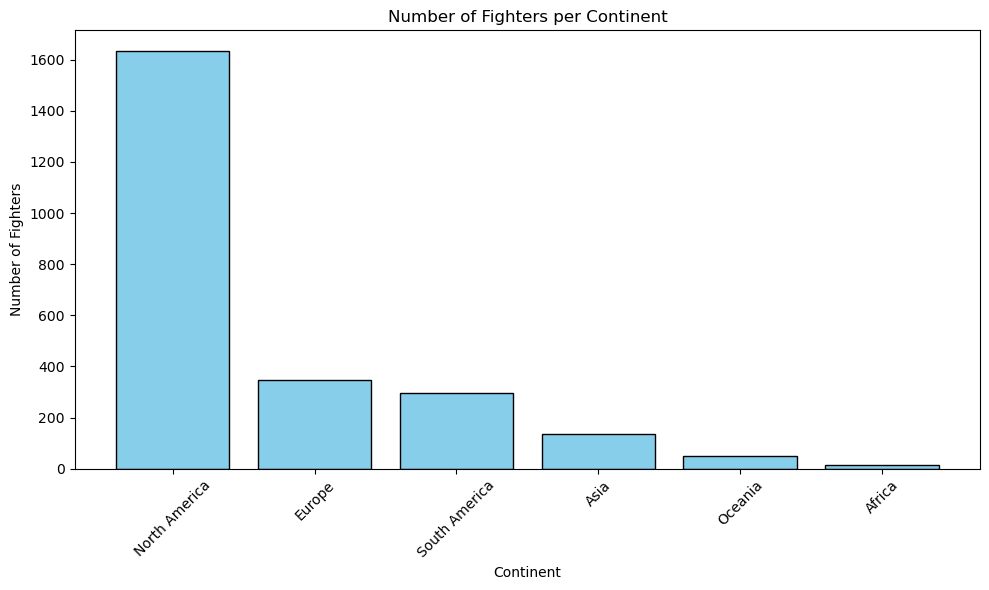

In [20]:
continent_counts = merged_data["continent"].value_counts()

plt.figure(figsize=(10, 6))
plt.bar(
    continent_counts.index, continent_counts.values, color="skyblue", edgecolor="black"
)

plt.xlabel("Continent")
plt.ylabel("Number of Fighters")
plt.title("Number of Fighters per Continent")

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


The vast majority of fighters are from North America.


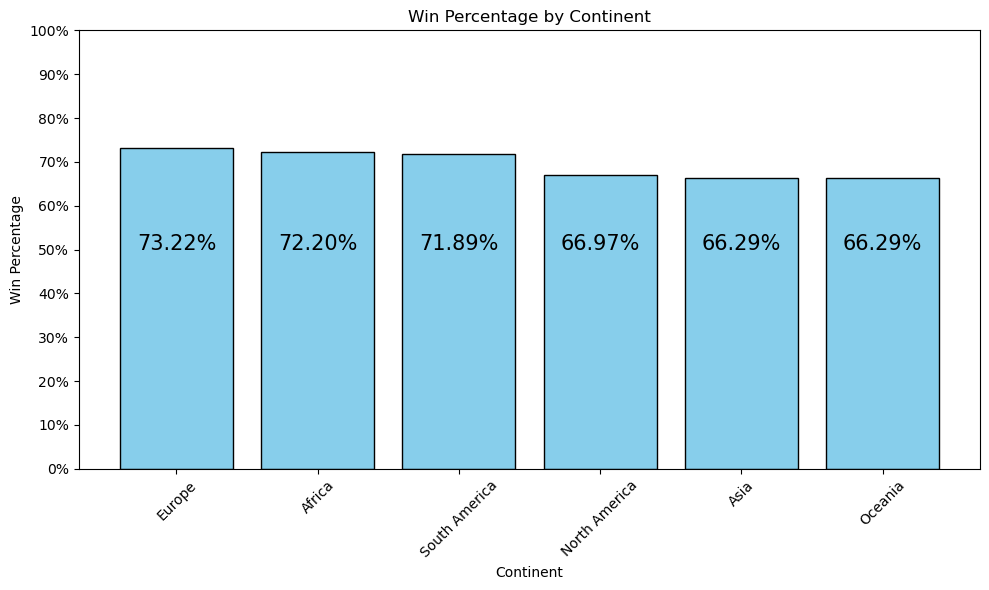

In [21]:
selected_columns = [
    "continent",
    "losses",
    "draws",
    "wins_ko",
    "wins_submission",
    "wins_decision",
]
averaged_fighters = merged_data[selected_columns].groupby("continent").mean()

averaged_fighters["wins"] = (
    averaged_fighters["wins_ko"]
    + averaged_fighters["wins_submission"]
    + averaged_fighters["wins_decision"]
)
averaged_fighters["no_of_fights"] = (
    averaged_fighters["losses"] + averaged_fighters["draws"] + averaged_fighters["wins"]
)
averaged_fighters["win_percentage"] = (
    averaged_fighters["wins"] / averaged_fighters["no_of_fights"]
)

averaged_fighters = averaged_fighters.reset_index()
averaged_fighters = averaged_fighters.sort_values(by="win_percentage", ascending=False)


plt.figure(figsize=(10, 6))
plt.bar(
    averaged_fighters["continent"],
    averaged_fighters["win_percentage"],
    color="skyblue",
    edgecolor="black",
)

plt.xlabel("Continent")
plt.ylabel("Win Percentage")
plt.title("Win Percentage by Continent")


for idx, percentage in enumerate(averaged_fighters["win_percentage"]):
    plt.text(
        idx, 0.5, f"{percentage * 100:.2f}%", ha="center", color="black", fontsize=15
    )

plt.gca().set_yticks([i / 10 for i in range(0, 11)])
plt.gca().set_yticklabels([f"{int(i * 100)}%" for i in plt.gca().get_yticks()])
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


Even though the differences are not grand, there seem to be two clusters, one with Europe, Africa and South America with win percentages around 72,5% and other one with North America, Asia and Oceania with percentages around 66.5%.


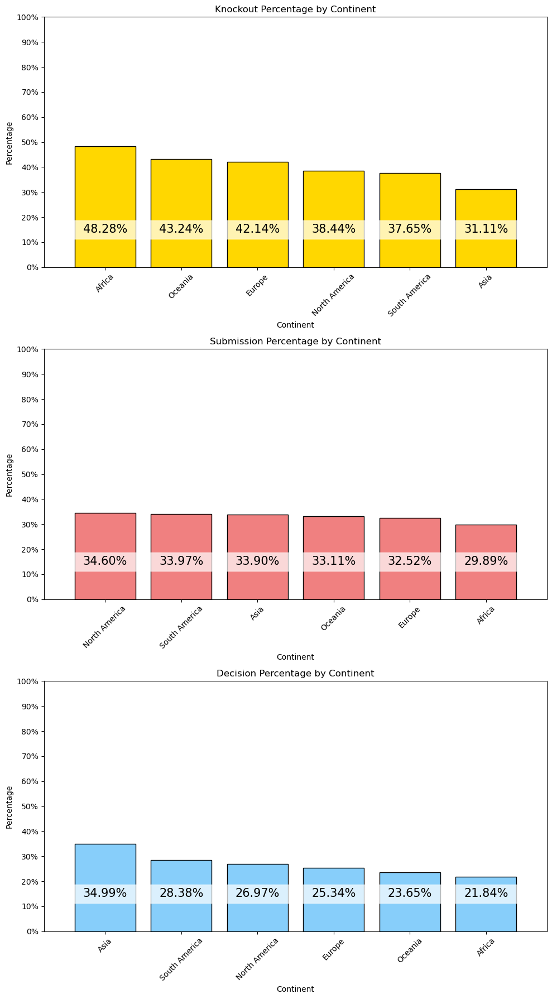

In [22]:
averaged_fighters["ko_perc"] = (
    (averaged_fighters["wins_ko"]) / (averaged_fighters["wins"])
)
averaged_fighters["submission_perc"] = (
    (averaged_fighters["wins_submission"]) / (averaged_fighters["wins"])
)
averaged_fighters["decision_perc"] = (
    (averaged_fighters["wins_decision"]) / (averaged_fighters["wins"])
)

fig, axes = plt.subplots(3, 1, figsize=(10, 18), sharex=False)

titles = [
    "Knockout Percentage by Continent",
    "Submission Percentage by Continent",
    "Decision Percentage by Continent",
]
columns = ["ko_perc", "submission_perc", "decision_perc"]
colors = ["gold", "lightcoral", "lightskyblue"]

for i, (ax, col, color, title) in enumerate(zip(axes, columns, colors, titles)):
    sorted_data = averaged_fighters.sort_values(by=col, ascending=False)
    bars = ax.bar(
        sorted_data["continent"], sorted_data[col], color=color, edgecolor="black"
    )

    for bar, percentage in zip(bars, sorted_data[col]):
        x = bar.get_x() + bar.get_width() / 2
        y = 0.15
        rect = patches.Rectangle(
            (x - 0.5, y - 0.0375),
            1,
            0.075,
            color="white",
            alpha=0.7,
            transform=ax.transData,
            zorder=2,
        )
        ax.add_patch(rect)
        ax.text(
            x,
            y,
            f"{percentage * 100:.2f}%",
            ha="center",
            va="center",
            fontsize=15,
            color="black",
            zorder=3,
        )

    ax.set_ylabel("Percentage")
    ax.set_title(title)
    ax.set_ylim(0, 1)
    ax.set_yticks([i / 10 for i in range(0, 11)])
    ax.set_yticklabels([f"{int(i * 100)}%" for i in ax.get_yticks()])
    ax.set_xticks(range(len(sorted_data["continent"])))
    ax.set_xticklabels(sorted_data["continent"], rotation=45)
    ax.set_xlabel("Continent")

plt.tight_layout()
plt.show()


Based on average data for each continent, Africa and Asia have most homogenous fighting style. African fighters favor knockout considerably more than any other continent while also having te lowest percentage in submission and decision wins. Asia, on the other hand, has noticeably lower knockout percentage and noticeably higher percentage in referee decision wins.

Submission win rates are almost the same for all continents, apart from Africa that has a bit smaller percentage than the rest.

Another observation is that Europe and Oceania have very similar results, as do North and South America, pointing to similar fighting styles these continents mutually share


In [23]:
new_columns = ["name", "sig_str", "sig_str_head", "sig_str_body", "sig_str_leg"]
body_parts = ["sig_str", "sig_str_head", "sig_str_body", "sig_str_leg"]

red_columns = [f"red_fighter_{col}" for col in new_columns]
blue_columns = [f"blue_fighter_{col}" for col in new_columns]
columns_to_keep = red_columns + blue_columns


fights_df = fights_df[columns_to_keep]


for part in body_parts:
    fights_df[[f"red_fighter_{part}_succ", f"red_fighter_{part}_att"]] = fights_df[
        f"red_fighter_{part}"
    ].str.split(" of ", expand=True)
    fights_df[[f"blue_fighter_{part}_succ", f"blue_fighter_{part}_att"]] = fights_df[
        f"blue_fighter_{part}"
    ].str.split(" of ", expand=True)

    fights_df[f"red_fighter_{part}_succ"] = pd.to_numeric(
        fights_df[f"red_fighter_{part}_succ"], errors="coerce"
    )
    fights_df[f"red_fighter_{part}_att"] = pd.to_numeric(
        fights_df[f"red_fighter_{part}_att"], errors="coerce"
    )
    fights_df[f"blue_fighter_{part}_succ"] = pd.to_numeric(
        fights_df[f"blue_fighter_{part}_succ"], errors="coerce"
    )
    fights_df[f"blue_fighter_{part}_att"] = pd.to_numeric(
        fights_df[f"blue_fighter_{part}_att"], errors="coerce"
    )


fights_df_split = fights_df.drop(
    columns=[
        "red_fighter_sig_str",
        "blue_fighter_sig_str",
        "red_fighter_sig_str_head",
        "blue_fighter_sig_str_head",
        "red_fighter_sig_str_body",
        "blue_fighter_sig_str_body",
        "red_fighter_sig_str_leg",
        "blue_fighter_sig_str_leg",
    ]
)

red_fighters_df = fights_df_split[
    [
        "red_fighter_name",
        "red_fighter_sig_str_succ",
        "red_fighter_sig_str_att",
        "red_fighter_sig_str_head_succ",
        "red_fighter_sig_str_head_att",
        "red_fighter_sig_str_body_succ",
        "red_fighter_sig_str_body_att",
        "red_fighter_sig_str_leg_succ",
        "red_fighter_sig_str_leg_att",
    ]
].rename(columns=lambda x: x.replace("red_fighter_", ""))

blue_fighters_df = fights_df_split[
    [
        "blue_fighter_name",
        "blue_fighter_sig_str_succ",
        "blue_fighter_sig_str_att",
        "blue_fighter_sig_str_head_succ",
        "blue_fighter_sig_str_head_att",
        "blue_fighter_sig_str_body_succ",
        "blue_fighter_sig_str_body_att",
        "blue_fighter_sig_str_leg_succ",
        "blue_fighter_sig_str_leg_att",
    ]
].rename(columns=lambda x: x.replace("blue_fighter_", ""))

red_fighters_grouped = red_fighters_df.groupby("name", as_index=False).sum()
blue_fighters_grouped = blue_fighters_df.groupby("name", as_index=False).sum()

final_fighters_df = pd.merge(
    red_fighters_grouped,
    blue_fighters_grouped,
    on="name",
    how="outer",
    suffixes=("_red", "_blue"),
)

for stat in [
    "sig_str_succ",
    "sig_str_att",
    "sig_str_head_succ",
    "sig_str_head_att",
    "sig_str_body_succ",
    "sig_str_body_att",
    "sig_str_leg_succ",
    "sig_str_leg_att",
]:
    final_fighters_df[stat] = final_fighters_df[f"{stat}_red"].fillna(
        0
    ) + final_fighters_df[f"{stat}_blue"].fillna(0)

final_fighters_df = final_fighters_df[
    [
        "name",
        "sig_str_succ",
        "sig_str_att",
        "sig_str_head_succ",
        "sig_str_head_att",
        "sig_str_body_succ",
        "sig_str_body_att",
        "sig_str_leg_succ",
        "sig_str_leg_att",
    ]
]

merged_data["name"] = merged_data["name"].str.upper()

merged_final_df = pd.merge(merged_data, final_fighters_df, on="name", how="inner")

merged_final_df = merged_final_df[
    [
        "name",
        "wins",
        "sig_str_succ",
        "sig_str_att",
        "sig_str_head_succ",
        "sig_str_head_att",
        "sig_str_body_succ",
        "sig_str_body_att",
        "sig_str_leg_succ",
        "sig_str_leg_att",
        "continent",
    ]
]

merged_final_df.head()


,name,wins,sig_str_succ,sig_str_att,sig_str_head_succ,sig_str_head_att,sig_str_body_succ,sig_str_body_att,sig_str_leg_succ,sig_str_leg_att,continent
0,WESTIN WILSON,11,15.0,45.0,8.0,32.0,3.0,9.0,4.0,4.0,North America
1,JIMMY FLICK,16,67.0,146.0,23.0,71.0,29.0,48.0,15.0,27.0,North America
2,PRESTON PARSONS,9,223.0,430.0,138.0,332.0,32.0,42.0,53.0,56.0,North America
3,HERBERT BURNS,11,59.0,170.0,32.0,129.0,18.0,29.0,9.0,12.0,South America
4,ANTHONY HERNANDEZ,8,368.0,558.0,306.0,488.0,50.0,55.0,12.0,15.0,North America


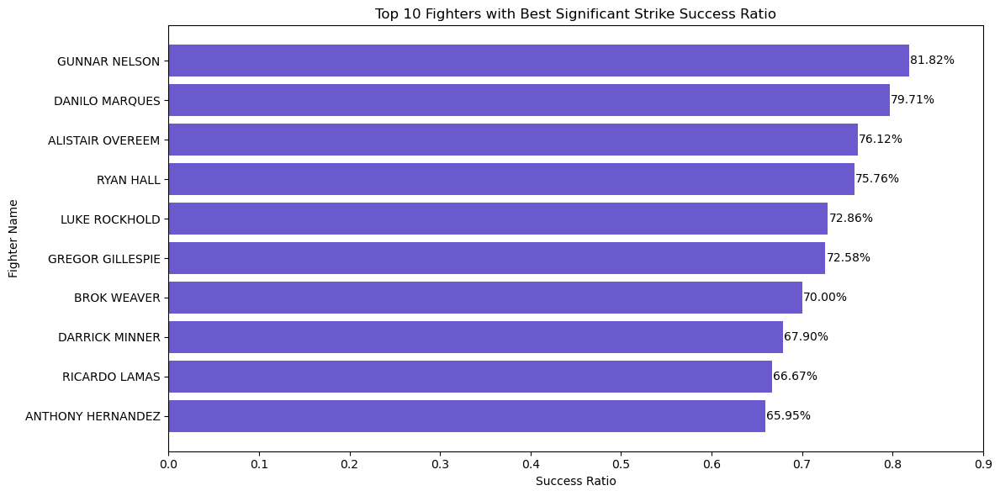

In [24]:
merged_fighters = merged_final_df.copy()
merged_fighters["success_rate"] = (
    merged_fighters["sig_str_succ"] / merged_fighters["sig_str_att"]
)
merged_fighters = merged_fighters[merged_fighters["sig_str_succ"] > 40]

top_10_overall = merged_fighters.nlargest(10, "success_rate")[["name", "success_rate"]]


plt.figure(figsize=(12, 6))
plt.barh(
    top_10_overall["name"],
    top_10_overall["success_rate"],
    align="center",
    color="slateblue",
)
plt.xlabel("Success Ratio")
plt.ylabel("Fighter Name")
plt.title("Top 10 Fighters with Best Significant Strike Success Ratio")
plt.gca().invert_yaxis()


for i, row in enumerate(top_10_overall.itertuples()):
    annotation = f"{row.success_rate * 100:.2f}%"
    plt.text(row.success_rate + 0.001, i, annotation, va="center")

plt.xlim(0, 0.9)
plt.tight_layout()
plt.show()


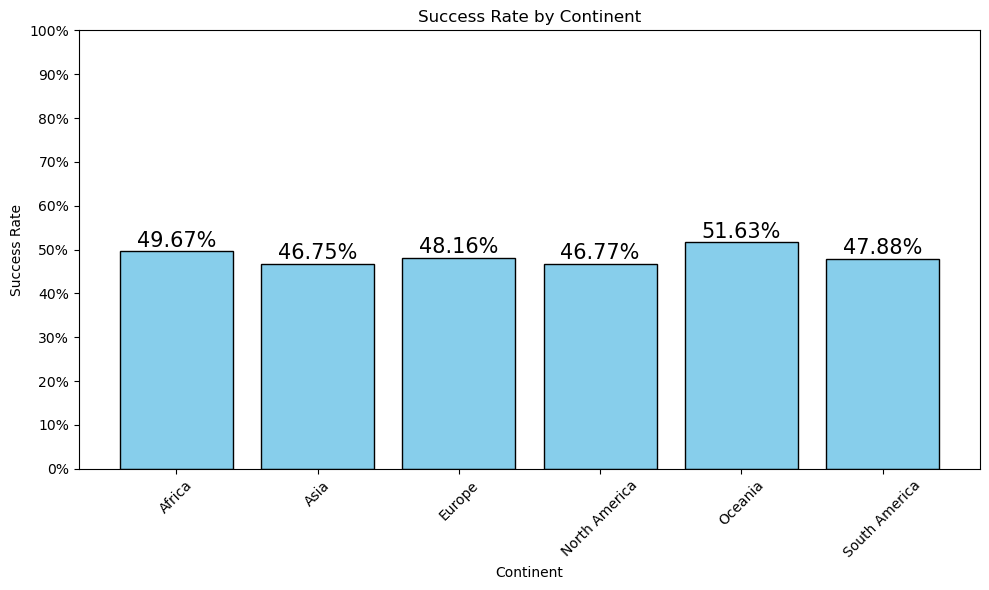

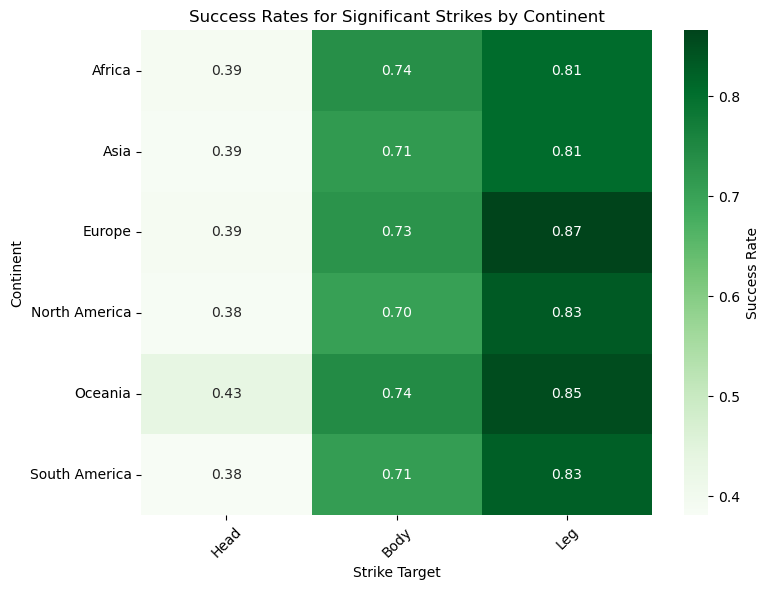

In [25]:
grouped_data = merged_final_df.groupby("continent").sum()


grouped_data["head_success_rate"] = (
    grouped_data["sig_str_head_succ"] / grouped_data["sig_str_head_att"]
)
grouped_data["body_success_rate"] = (
    grouped_data["sig_str_body_succ"] / grouped_data["sig_str_body_att"]
)
grouped_data["leg_success_rate"] = (
    grouped_data["sig_str_leg_succ"] / grouped_data["sig_str_leg_att"]
)

grouped_data["success_rate"] = (
    grouped_data["sig_str_succ"] / grouped_data["sig_str_att"]
)


plt.figure(figsize=(10, 6))
plt.bar(
    grouped_data.index, grouped_data["success_rate"], color="skyblue", edgecolor="black"
)


plt.xlabel("Continent")
plt.ylabel("Success Rate")
plt.title("Success Rate by Continent")


for idx, percentage in enumerate(grouped_data["success_rate"]):
    plt.text(
        idx,
        grouped_data["success_rate"].iloc[idx] + 0.01,
        f"{percentage * 100:.2f}%",
        ha="center",
        fontsize=15,
    )

plt.gca().set_yticks([i / 10 for i in range(0, 11)])
plt.gca().set_yticklabels([f"{int(i * 100)}%" for i in plt.gca().get_yticks()])

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

success_rate_data = grouped_data[
    ["head_success_rate", "body_success_rate", "leg_success_rate"]
]
plt.figure(figsize=(8, 6))
sns.heatmap(
    success_rate_data,
    annot=True,
    fmt=".2f",
    cmap="Greens",
    cbar_kws={"label": "Success Rate"},
)
plt.title("Success Rates for Significant Strikes by Continent")
plt.ylabel("Continent")
plt.xlabel("Strike Target")
plt.xticks(ticks=[0.5, 1.5, 2.5], labels=["Head", "Body", "Leg"], rotation=45)
plt.tight_layout()
plt.show()


# Question 4: Fight features analysis

We want to explore patterns in UFC fight characteristics. Namely we want to understand how fights end in different rounds, with different outcomes and the geographical distribution of venues. By doing this we want to understand the physical aspects of fights and the business strategies behind organizing events. This analysis will reveal trends influencing fight outcomes and provide insights into the sport's competitive dynamics.


In [1]:
from scipy.ndimage import gaussian_filter1d

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")


In [2]:
base_folder_path = "datasets/"
stats = pd.read_csv(base_folder_path + "stats.csv", delimiter=";")

print(stats.head())


   red_fighter_name blue_fighter_name  event_date red_fighter_nickname  \
0      ILIA TOPURIA      MAX HOLLOWAY  26/10/2024           El Matador   
1  ROBERT WHITTAKER   KHAMZAT CHIMAEV  26/10/2024           The Reaper   
2  MAGOMED ANKALAEV  ALEKSANDAR RAKIC  26/10/2024                    -   
3     LERONE MURPHY           DAN IGE  26/10/2024          The Miracle   
4   SHARA MAGOMEDOV   ARMEN PETROSYAN  26/10/2024               Bullet   

  blue_fighter_nickname red_fighter_result blue_fighter_result  \
0               Blessed                  W                   L   
1                  Borz                  L                   W   
2                Rocket                  W                   L   
3                   50K                  W                   L   
4              Superman                  W                   L   

                 method  round  time  ... red_fighter_sig_str_body_pct  \
0                KO/TKO      3  1:34  ...                           14   
1         

## Distribution of fight locations


Number of unique countries: 28


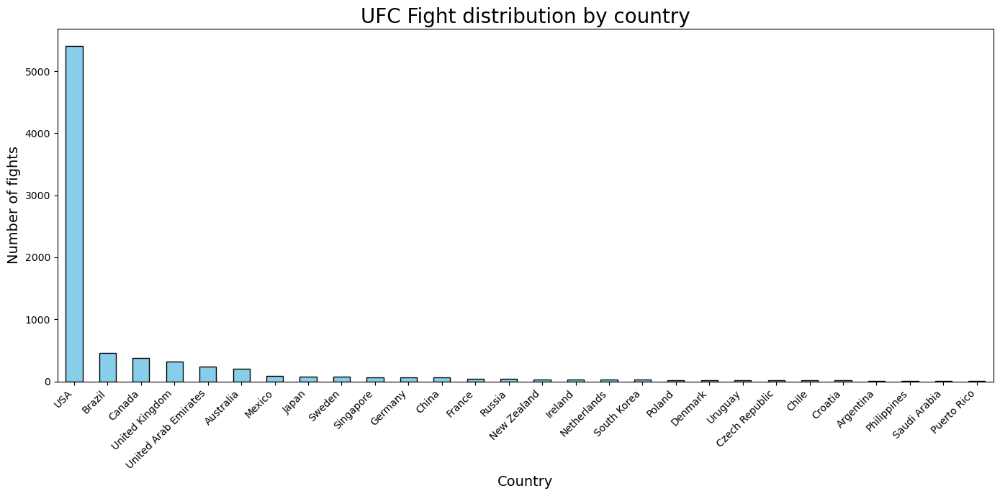

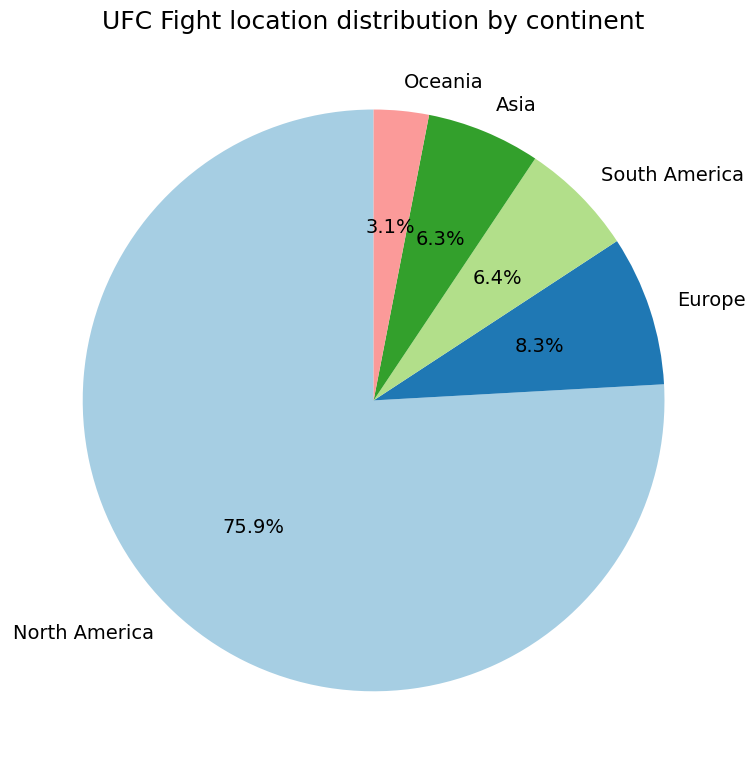

In [3]:
# Fights by country
stats["country"] = stats["event_location"].str.extract(r",\s*([^,]+)$")
stats["country"] = stats["country"].str.strip()
stats["country"] = stats["country"].fillna("Unknown")

unique_countries = stats["country"].unique()
print("Number of unique countries:", len(unique_countries))

country_counts = stats["country"].value_counts()


plt.figure(figsize=(14, 7))
country_counts.plot(kind="bar", color="skyblue", edgecolor="black")
plt.title("UFC Fight distribution by country", fontsize=20)
plt.xlabel("Country", fontsize=14)
plt.ylabel("Number of fights", fontsize=14)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

continent_mapping = {
    "United Arab Emirates": "Asia",
    "USA": "North America",
    "France": "Europe",
    "Australia": "Oceania",
    "United Kingdom": "Europe",
    "Saudi Arabia": "Asia",
    "Brazil": "South America",
    "Mexico": "North America",
    "Canada": "North America",
    "Singapore": "Asia",
    "New Zealand": "Oceania",
    "South Korea": "Asia",
    "Russia": "Europe",
    "Denmark": "Europe",
    "China": "Asia",
    "Uruguay": "South America",
    "Sweden": "Europe",
    "Czech Republic": "Europe",
    "Argentina": "South America",
    "Germany": "Europe",
    "Chile": "South America",
    "Poland": "Europe",
    "Japan": "Asia",
    "Netherlands": "Europe",
    "Croatia": "Europe",
    "Ireland": "Europe",
    "Philippines": "Asia",
    "Puerto Rico": "North America",
    "Unknown": "Unknown",
}

# Fights by continent
stats["continent"] = stats["country"].map(continent_mapping)

continent_counts = stats["continent"].value_counts()

plt.figure(figsize=(8, 8))
continent_counts.plot(
    kind="pie",
    autopct="%1.1f%%",
    startangle=90,
    colors=plt.cm.Paired.colors,
    textprops={"fontsize": 14},
)
plt.title("UFC Fight location distribution by continent", fontsize=18)
plt.ylabel("")
plt.tight_layout()
plt.show()


## Distribution of fight outcomes by country


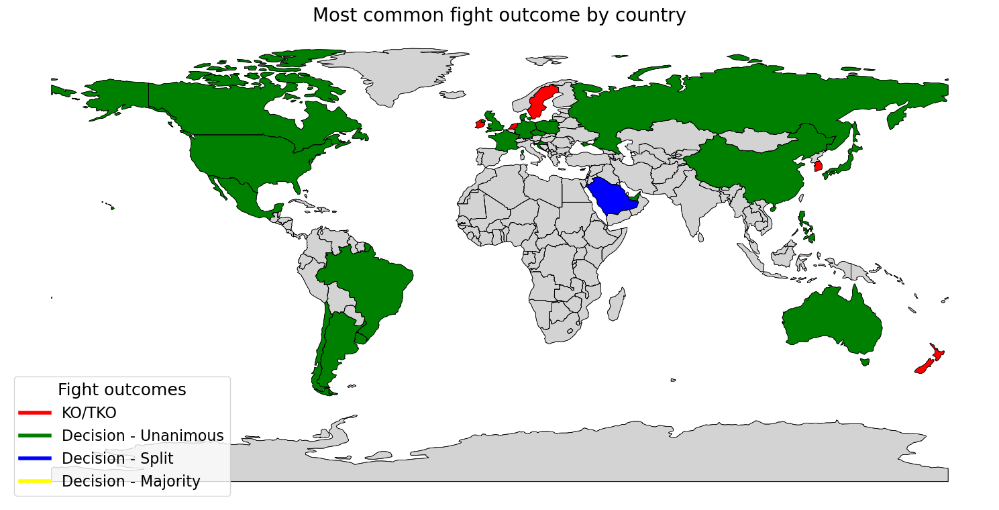


Decision - Split:
    Saudi Arabia - 27.27% of fights

Decision - Unanimous:
    Argentina - 41.67% of fights
    Australia - 36.76% of fights
    Brazil - 33.19% of fights
    Canada - 41.1% of fights
    Chile - 46.15% of fights
    China - 37.7% of fights
    Croatia - 46.15% of fights
    Czechia - 46.15% of fights
    Denmark - 46.15% of fights
    France - 43.24% of fights
    Germany - 46.97% of fights
    Japan - 36.71% of fights
    Mexico - 34.15% of fights
    Philippines - 33.33% of fights
    Poland - 60.87% of fights
    Russia - 47.22% of fights
    Singapore - 37.14% of fights
    United Arab Emirates - 45.49% of fights
    United Kingdom - 35.31% of fights
    United States of America - 35.24% of fights
    Uruguay - 38.46% of fights

KO/TKO:
    Ireland - 41.38% of fights
    Netherlands - 44.0% of fights
    New Zealand - 39.39% of fights
    Puerto Rico - 55.56% of fights
    South Korea - 37.5% of fights
    Sweden - 36.11% of fights


In [4]:
country_name_mapping = {
    "USA": "United States of America",
    "United Kingdom": "United Kingdom",
    "United Arab Emirates": "United Arab Emirates",
    "Czech Republic": "Czechia",
    "South Korea": "South Korea",
    "Puerto Rico": "Puerto Rico",
    "Netherlands": "Netherlands",
    "New Zealand": "New Zealand",
    "Sweden": "Sweden",
    "Ireland": "Ireland",
    "Uruguay": "Uruguay",
    "Saudi Arabia": "Saudi Arabia",
    "Argentina": "Argentina",
    "Australia": "Australia",
    "Brazil": "Brazil",
    "Canada": "Canada",
    "Chile": "Chile",
    "China": "China",
    "Croatia": "Croatia",
    "Denmark": "Denmark",
    "France": "France",
    "Germany": "Germany",
    "Japan": "Japan",
    "Mexico": "Mexico",
    "Philippines": "Philippines",
    "Poland": "Poland",
    "Russia": "Russia",
    "Singapore": "Singapore",
}  # Map country names to their official names in the shapefiles


country_outcomes = stats.groupby(["country", "method"]).size().reset_index(name="count")
prominent_outcomes_country = country_outcomes.loc[
    country_outcomes.groupby("country")["count"].idxmax()
]
total_fights_by_country = (
    stats.groupby("country").size().reset_index(name="total_fights")
)
prominent_outcomes_country = prominent_outcomes_country.merge(
    total_fights_by_country, on="country"
)
prominent_outcomes_country["country"] = prominent_outcomes_country["country"].replace(
    country_name_mapping
)
prominent_outcomes_country["percentage"] = (
    (prominent_outcomes_country["count"] / prominent_outcomes_country["total_fights"])
    * 100
).round(2)
world = gpd.read_file("shapefiles/ne_110m_admin_0_countries.shp")
world = world.merge(
    prominent_outcomes_country, how="left", left_on="NAME", right_on="country"
)
outcome_colors = {
    "KO/TKO": "red",
    "Decision - Unanimous": "green",
    "Decision - Split": "blue",
    "Decision - Majority": "yellow",
}

world["color"] = world["method"].map(outcome_colors).fillna("lightgray")
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world.boundary.plot(ax=ax, linewidth=0.5, edgecolor="black")
world.plot(ax=ax, color=world["color"], edgecolor="black", linewidth=0.5)
handles = [plt.Line2D([0], [0], color=color, lw=4) for color in outcome_colors.values()]
labels = list(outcome_colors.keys())
plt.legend(
    handles,
    labels,
    title="Fight outcomes",
    loc="lower left",
    fontsize=16,
    title_fontsize=18,
)
plt.title("Most common fight outcome by country", fontsize=20)
plt.axis("off")
plt.tight_layout()
plt.show()

grouped_outcomes = prominent_outcomes_country.sort_values(
    by=["method", "country"], ascending=[True, True]
)

current_method = None
for idx, row in grouped_outcomes.iterrows():
    if row["method"] != current_method:
        current_method = row["method"]
        print(f"\n{current_method}:")
    print(f"    {row['country']} - {row['percentage']}% of fights")


## Distribution of fights by rounds across countries


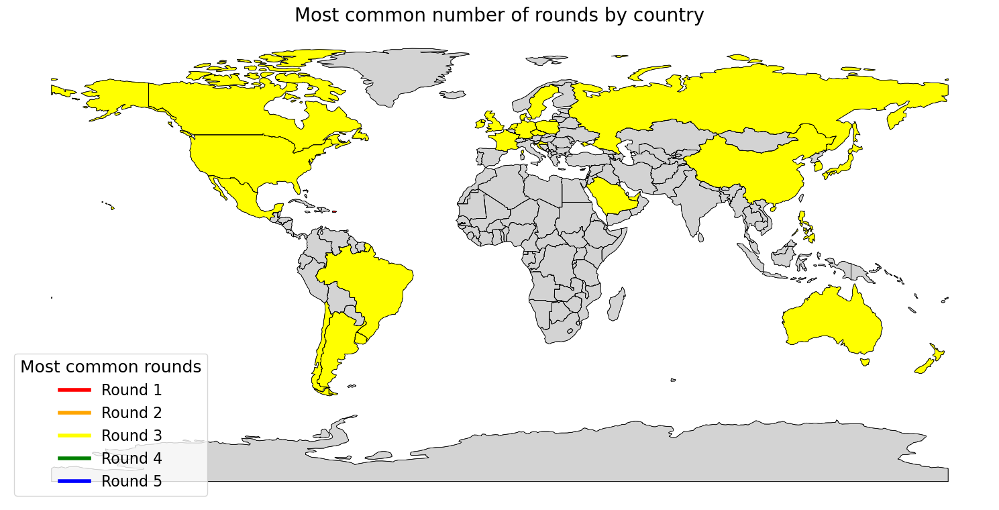


Round 1:
    Puerto Rico - 100.0% of fights

Round 3:
    Argentina - 50.0% of fights
    Australia - 52.45% of fights
    Brazil - 48.47% of fights
    Canada - 57.33% of fights
    Chile - 53.85% of fights
    China - 63.93% of fights
    Croatia - 46.15% of fights
    Czechia - 53.85% of fights
    Denmark - 61.54% of fights
    France - 62.16% of fights
    Germany - 63.64% of fights
    Ireland - 48.28% of fights
    Japan - 50.63% of fights
    Mexico - 56.1% of fights
    Netherlands - 52.0% of fights
    New Zealand - 45.45% of fights
    Philippines - 50.0% of fights
    Poland - 69.57% of fights
    Russia - 63.89% of fights
    Saudi Arabia - 81.82% of fights
    Singapore - 51.43% of fights
    South Korea - 58.33% of fights
    Sweden - 47.22% of fights
    United Arab Emirates - 57.08% of fights
    United Kingdom - 50.0% of fights
    United States of America - 49.38% of fights
    Uruguay - 53.85% of fights


In [5]:
round_distribution = (
    stats.groupby(["country", "round"]).size().reset_index(name="count")
)
most_common_rounds = round_distribution.loc[
    round_distribution.groupby("country")["count"].idxmax()
]
total_fights_by_country = (
    stats.groupby("country").size().reset_index(name="total_fights")
)
most_common_rounds = most_common_rounds.merge(
    total_fights_by_country, on="country"
).assign(percentage=lambda df: ((df["count"] / df["total_fights"]) * 100).round(2))
most_common_rounds["country"] = most_common_rounds["country"].replace(
    country_name_mapping
)
world = gpd.read_file("shapefiles/ne_110m_admin_0_countries.shp")
world = world.merge(most_common_rounds, how="left", left_on="NAME", right_on="country")
round_colors = {
    1: "red",
    2: "orange",
    3: "yellow",
    4: "green",
    5: "blue",
}
world["color"] = world["round"].map(round_colors).fillna("lightgray")
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world.boundary.plot(ax=ax, linewidth=0.5, edgecolor="black")
world.plot(ax=ax, color=world["color"], edgecolor="black", linewidth=0.5)
handles = [plt.Line2D([0], [0], color=color, lw=4) for color in round_colors.values()]
labels = [f"Round {round_num}" for round_num in round_colors.keys()]
plt.legend(
    handles,
    labels,
    title="Most common rounds",
    loc="lower left",
    fontsize=16,
    title_fontsize=18,
)
plt.title("Most common number of rounds by country", fontsize=20)
plt.axis("off")
plt.tight_layout()
plt.show()

grouped_rounds = most_common_rounds.sort_values(
    by=["round", "country"], ascending=[True, True]
)

current_round = None
for idx, row in grouped_rounds.iterrows():
    if row["round"] != current_round:
        current_round = row["round"]
        print(f"\nRound {current_round}:")
    print(f"    {row['country']} - {row['percentage']}% of fights")


## Most common round to have fight stoppage by countries


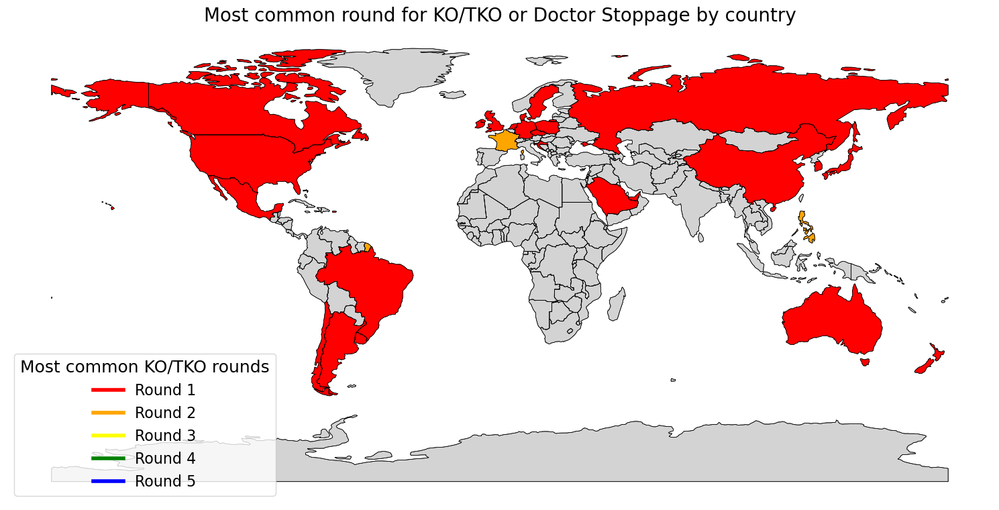


Round 1:
    Argentina - 33.33% of fights
    Australia - 54.29% of fights
    Brazil - 52.6% of fights
    Canada - 55.36% of fights
    Chile - 100.0% of fights
    China - 76.47% of fights
    Croatia - 80.0% of fights
    Czechia - 50.0% of fights
    Denmark - 75.0% of fights
    Germany - 50.0% of fights
    Ireland - 58.33% of fights
    Japan - 48.0% of fights
    Mexico - 57.89% of fights
    Netherlands - 36.36% of fights
    New Zealand - 69.23% of fights
    Poland - 33.33% of fights
    Puerto Rico - 100.0% of fights
    Russia - 55.56% of fights
    Saudi Arabia - 66.67% of fights
    Singapore - 54.55% of fights
    South Korea - 66.67% of fights
    Sweden - 69.23% of fights
    United Arab Emirates - 53.03% of fights
    United Kingdom - 55.24% of fights
    United States of America - 53.18% of fights
    Uruguay - 50.0% of fights

Round 2:
    France - 46.15% of fights
    Philippines - 66.67% of fights


In [6]:
ko_tko_distribution = (
    stats[stats["method"].isin(["KO/TKO", "TKO - Doctor's Stoppage"])]
    .groupby(["country", "round"])
    .size()
    .reset_index(name="count")
)
most_common_ko_tko_rounds = ko_tko_distribution.loc[
    ko_tko_distribution.groupby("country")["count"].idxmax()
]
total_ko_tko_fights_by_country = (
    stats[stats["method"].isin(["KO/TKO", "TKO - Doctor's Stoppage"])]
    .groupby("country")
    .size()
    .reset_index(name="total_fights")
)
most_common_ko_tko_rounds = most_common_ko_tko_rounds.merge(
    total_ko_tko_fights_by_country, on="country"
).assign(percentage=lambda df: ((df["count"] / df["total_fights"]) * 100).round(2))
most_common_ko_tko_rounds["country"] = most_common_ko_tko_rounds["country"].replace(
    country_name_mapping
)
world = gpd.read_file("shapefiles/ne_110m_admin_0_countries.shp")
world = world.merge(
    most_common_ko_tko_rounds, how="left", left_on="NAME", right_on="country"
)
world["color"] = world["round"].map(round_colors).fillna("lightgray")
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world.boundary.plot(ax=ax, linewidth=0.5, edgecolor="black")
world.plot(ax=ax, color=world["color"], edgecolor="black", linewidth=0.5)
handles = [plt.Line2D([0], [0], color=color, lw=4) for color in round_colors.values()]
labels = [f"Round {round_num}" for round_num in round_colors.keys()]
plt.legend(
    handles,
    labels,
    title="Most common KO/TKO rounds",
    loc="lower left",
    fontsize=16,
    title_fontsize=18,
)
plt.title("Most common round for KO/TKO or Doctor Stoppage by country", fontsize=20)
plt.axis("off")
plt.tight_layout()
plt.show()

grouped_ko_tko_rounds = most_common_ko_tko_rounds.sort_values(
    by=["round", "country"], ascending=[True, True]
)

current_round = None
for idx, row in grouped_ko_tko_rounds.iterrows():
    if row["round"] != current_round:
        current_round = row["round"]
        print(f"\nRound {current_round}:")
    print(f"    {row['country']} - {row['percentage']}% of fights")


## Distribution of fight stoppages by round by country


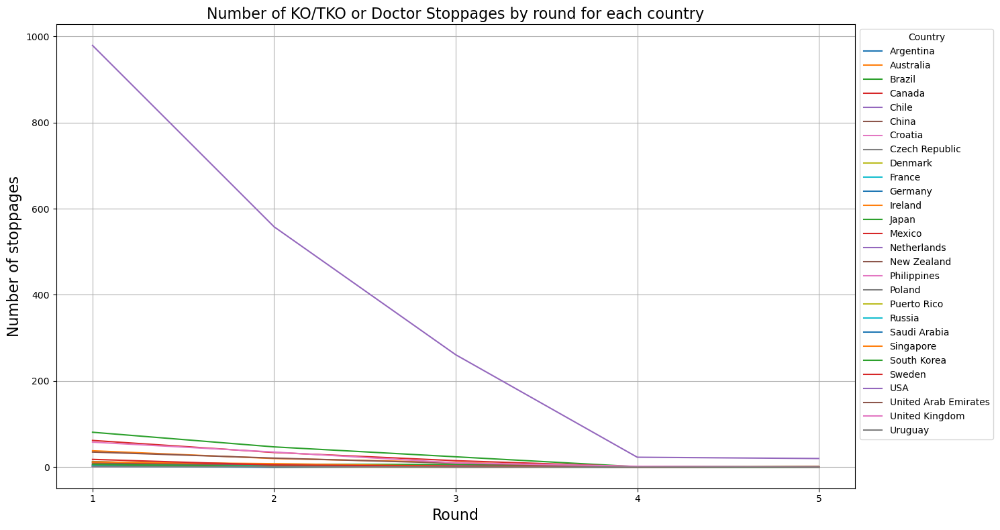

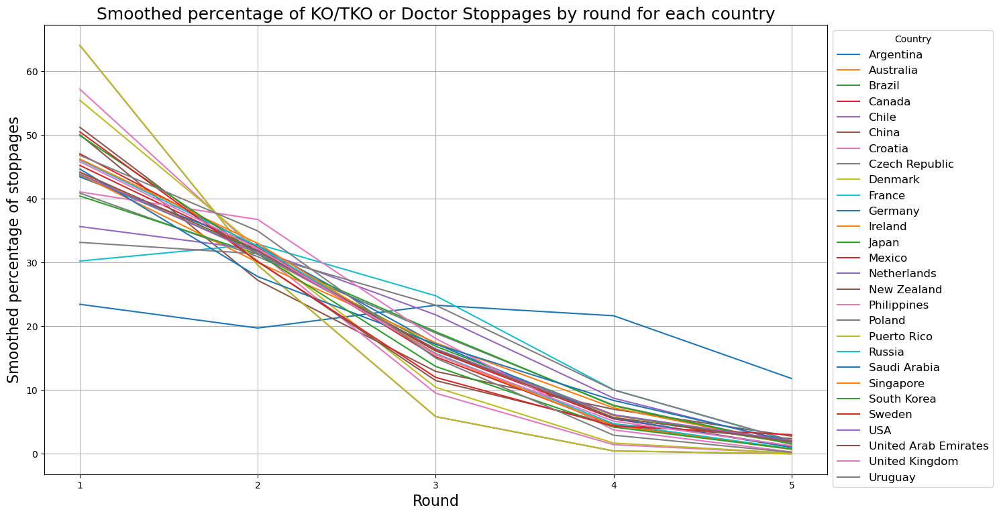

In [7]:
ko_tko_line_data = (
    stats[stats["method"].isin(["KO/TKO", "TKO - Doctor's Stoppage"])]
    .groupby(["country", "round"])
    .size()
    .reset_index(name="count")
)
ko_tko_pivot = ko_tko_line_data.pivot(
    index="round", columns="country", values="count"
).fillna(0)

plt.figure(figsize=(15, 8))
for country in ko_tko_pivot.columns:
    plt.plot(ko_tko_pivot.index, ko_tko_pivot[country], label=country)

plt.title("Number of KO/TKO or Doctor Stoppages by round for each country", fontsize=16)
plt.xlabel("Round", fontsize=16)
plt.ylabel("Number of stoppages", fontsize=16)
plt.xticks(range(1, 6))
plt.legend(title="Country", bbox_to_anchor=(1, 1), loc="upper left", fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

normalized_ko_tko_data = (
    stats[stats["method"].isin(["KO/TKO", "TKO - Doctor's Stoppage"])]
    .groupby(["country", "round"])
    .size()
    .reset_index(name="count")
)
total_stoppages_by_country = (
    stats[stats["method"].isin(["KO/TKO", "TKO - Doctor's Stoppage"])]
    .groupby("country")
    .size()
    .reset_index(name="total_stoppages")
)
normalized_ko_tko_data = normalized_ko_tko_data.merge(
    total_stoppages_by_country, on="country"
).assign(percentage=lambda df: (df["count"] / df["total_stoppages"]) * 100)
normalized_ko_tko_pivot = normalized_ko_tko_data.pivot(
    index="round", columns="country", values="percentage"
).fillna(0)
smoothed_data = normalized_ko_tko_pivot.apply(
    lambda x: gaussian_filter1d(x, sigma=1), axis=0
)

plt.figure(figsize=(15, 8))
for country in smoothed_data.columns:
    plt.plot(
        smoothed_data.index,
        smoothed_data[country],
        label=country,
    )

plt.title(
    "Smoothed percentage of KO/TKO or Doctor Stoppages by round for each country",
    fontsize=18,
)
plt.xlabel("Round", fontsize=16)
plt.ylabel("Smoothed percentage of stoppages", fontsize=16)
plt.xticks(range(1, 6))
plt.legend(title="Country", bbox_to_anchor=(1, 1), loc="upper left", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


# Conclusion

The UFC mainly holds events in the U.S., its biggest market, but it's also expanded to places like Brazil, Canada and the U.K. because of strong MMA fanbases there. Over 75% of fights happen in North America while other continents host fewer events, showing how the UFC prioritizes its home market while slowly branching out worldwide.

Knockout (KO) and technical knockout (TKO) finishes are common in striking-heavy regions like Puerto Rico and the Netherlands. On the other hand, unanimous decisions are more frequent in Poland and Russia, where fighters tend to be well-rounded and judging is more technical. Saudi Arabia stands out with a preference for split decisions, which may reflect closely matched fights. This trend could be an effort to keep fans engaged and boost local interest, although further analysis would be needed to confirm this hypothesis. These trends really highlight how regional fighting styles and judging approaches impact outcomes.

Globally, fights often go all three rounds. For example, Round 3 finishes are most common in Poland (69.57%) and Saudi Arabia (81.82%), showing how endurance and strategy matter in tight matchups. On the flip side, countries like Puerto Rico, Chile and Croatia see a lot of first-round stoppages, pointing to fast-paced, aggressive fighting styles.

First-round finishes are the most common overall, especially in places like China (76.47%) and Denmark (75.0%), where fighters aim to end fights early. In areas like the Philippines (67.76%) and France (46.15%), fighters typically take slightly longer to wrap up their fights in Round 2. There’s a noticeable drop in stoppages during later rounds, showing how fatigue and defensive adjustments come into play, making conditioning key for fighters who want to perform well as fights go on.
